# Telecom Churn Prediction - Starter Notebook

**Author:** Venkat Lata

The goal of this notebook is to provide an overview of how write a notebook and create a submission file that successfully solves the churn prediction problem. Please download the datasets, unzip and place them in the same folder as this notebook.

We are going to follow the process called CRISP-DM.

<img src="https://upload.wikimedia.org/wikipedia/commons/thumb/b/b9/CRISP-DM_Process_Diagram.png/639px-CRISP-DM_Process_Diagram.png" style="height: 400px; width:400px;"/>

After Business and Data Understanding via EDA, we want to prepare data for modelling. Then evaluate and submit our predictions.

# 0. Problem statement

In the telecom industry, customers are able to choose from multiple service providers and actively switch from one operator to another. In this highly competitive market, the telecommunications industry experiences an average of 15-25% annual churn rate. Given the fact that it costs 5-10 times more to acquire a new customer than to retain an existing one, customer retention has now become even more important than customer acquisition.

For many incumbent operators, retaining high profitable customers is the number one business
goal. To reduce customer churn, telecom companies need to predict which customers are at high risk of churn. In this project, you will analyze customer-level data of a leading telecom firm, build predictive models to identify customers at high risk of churn, and identify the main indicators of churn.

In this competition, your goal is *to build a machine learning model that is able to predict churning customers based on the features provided for their usage.*

**Customer behaviour during churn:**

Customers usually do not decide to switch to another competitor instantly, but rather over a
period of time (this is especially applicable to high-value customers). In churn prediction, we
assume that there are three phases of customer lifecycle :

1. <u>The ‘good’ phase:</u> In this phase, the customer is happy with the service and behaves as usual.

2. <u>The ‘action’ phase:</u> The customer experience starts to sore in this phase, for e.g. he/she gets a compelling offer from a competitor, faces unjust charges, becomes unhappy with service quality etc. In this phase, the customer usually shows different behaviour than the ‘good’ months. It is crucial to identify high-churn-risk customers in this phase, since some corrective actions can be taken at this point (such as matching the competitor’s offer/improving the service quality etc.)

3. <u>The ‘churn’ phase:</u> In this phase, the customer is said to have churned. In this case, since you are working over a four-month window, the first two months are the ‘good’ phase, the third month is the ‘action’ phase, while the fourth month (September) is the ‘churn’ phase.

## STEP #0 - LOADING DEPENDENCIES AND DATASETS

In [1]:
# Importing Libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import re

# Suppress Warnings
import warnings
warnings.filterwarnings('ignore')

%matplotlib inline

# Display Options
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)
pd.set_option('display.width', None)

# Set Styling
sns.set_style("whitegrid")
sns.set_context("notebook", font_scale=1.1)

In [2]:
from sklearn.model_selection import train_test_split
from sklearn.model_selection import KFold, cross_val_score
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV

from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA

from sklearn.linear_model import LogisticRegression
from sklearn.feature_selection import RFE
from sklearn.tree import DecisionTreeClassifier, plot_tree
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier
import xgboost as xgb
from xgboost import XGBClassifier

from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay, accuracy_score, classification_report
from sklearn.metrics import roc_curve, roc_auc_score, RocCurveDisplay
from sklearn.metrics import precision_score, recall_score, precision_recall_curve

In [3]:
#COMMENT THIS SECTION INCASE RUNNING THIS NOTEBOOK LOCALLY

#Checking the kaggle paths for the uploaded datasets
# import os
# for dirname, _, filenames in os.walk('/kaggle/input'):
#     for filename in filenames:
#         print(os.path.join(dirname, filename))

In [4]:
#INCASE RUNNING THIS LOCALLY, PASS THE RELATIVE PATH OF THE CSV FILES BELOW
#(e.g. if files are in same folder as notebook, simple write "train.csv" as path)

# Commands for loading file in Kaggle
# data = pd.read_csv("/kaggle/input/kagglelabstest2021/train.csv")
# unseen = pd.read_csv("/kaggle/input/kagglelabstest2021/test.csv")
# sample = pd.read_csv("/kaggle/input/kagglelabstest2021/sample.csv")
# data_dict = pd.read_csv("/kaggle/input/kagglelabstest2021/data_dictionary.csv")

# Commands for loading files locally
data = pd.read_csv("train.csv")
unseen = pd.read_csv("test.csv")
sample = pd.read_csv("sample.csv")
data_dict = pd.read_csv("data_dictionary.csv")

print(data.shape)
print(unseen.shape)
print(sample.shape)
print(data_dict.shape)

(69999, 172)
(30000, 171)
(30000, 2)
(36, 2)


In [5]:
data.head()

,id,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,og_others_6,og_others_7,og_others_8,total_og_mou_6,total_og_mou_7,total_og_mou_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,ic_others_6,ic_others_7,ic_others_8,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,date_of_last_rech_data_6,date_of_last_rech_data_7,date_of_last_rech_data_8,total_rech_data_6,total_rech_data_7,total_rech_data_8,max_rech_data_6,max_rech_data_7,max_rech_data_8,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_2g_6,arpu_2g_7,arpu_2g_8,night_pck_user_6,night_pck_user_7,night_pck_user_8,monthly_2g_6,monthly_2g_7,monthly_2g_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,fb_user_6,fb_user_7,fb_user_8,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,churn_probability
0,0,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,31.277,87.009,7.527,48.58,124.38,1.29,32.24,96.68,2.33,0.00,0.0,0.0,0.00,0.0,0.00,2.23,0.00,0.28,5.29,16.04,2.33,0.00,0.00,0.00,0.00,0.00,0.00,7.53,16.04,2.61,46.34,124.38,1.01,18.75,80.61,0.0,0.00,0.0,0.0,0.0,0.0,0.0,65.09,204.99,1.01,0.0,0.0,0.0,8.20,0.63,0.00,0.38,0.0,0.0,81.21,221.68,3.63,2.43,3.68,7.79,0.83,21.08,16.91,0.00,0.00,0.00,3.26,24.76,24.71,0.00,7.61,0.21,7.46,19.96,14.96,0.0,0.0,0.0,0.0,0.0,0.0,7.46,27.58,15.18,11.84,53.04,40.56,0.0,0.0,0.66,0.0,0.0,0.0,1.11,0.69,0.00,3,2,2,77,65,10,65,65,10,6/22/2014,7/10/2014,8/24/2014,65,65,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.00,0.00,0.0,0.00,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,0,0,0,0,0,0,0,0,0,0,0,NaN,NaN,NaN,1958,0.0,0.0,0.0,0
1,1,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,0.000,122.787,42.953,0.00,0.00,0.00,0.00,25.99,30.89,0.00,0.0,0.0,0.00,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,22.01,29.79,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.00,0.00,0.00,0.0,0.0,0.0,0.00,30.73,31.66,0.00,0.0,0.0,0.00,30.73,31.66,1.68,19.09,10.53,1.41,18.68,11.09,0.35,1.66,3.40,3.44,39.44,25.03,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.00,0.00,3.44,39.44,25.04,0.0,0.0,0.01,0.0,0.0,0.0,0.00,0.00,0.00,3,4,5,0,145,50,0,145,50,6/12/2014,7/10/2014,8/26/2014,0,0,0,NaN,7/8/2014,NaN,NaN,1.0,NaN,NaN,145.0,NaN,NaN,0.0,NaN,NaN,1.0,NaN,Na

In [6]:
data = data.set_index('id')
data.head()

,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,og_others_6,og_others_7,og_others_8,total_og_mou_6,total_og_mou_7,total_og_mou_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,ic_others_6,ic_others_7,ic_others_8,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,date_of_last_rech_data_6,date_of_last_rech_data_7,date_of_last_rech_data_8,total_rech_data_6,total_rech_data_7,total_rech_data_8,max_rech_data_6,max_rech_data_7,max_rech_data_8,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_2g_6,arpu_2g_7,arpu_2g_8,night_pck_user_6,night_pck_user_7,night_pck_user_8,monthly_2g_6,monthly_2g_7,monthly_2g_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,fb_user_6,fb_user_7,fb_user_8,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,churn_probability
id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
0,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,31.277,87.009,7.527,48.58,124.38,1.29,32.24,96.68,2.33,0.00,0.0,0.0,0.00,0.0,0.00,2.23,0.00,0.28,5.29,16.04,2.33,0.00,0.00,0.00,0.00,0.00,0.00,7.53,16.04,2.61,46.34,124.38,1.01,18.75,80.61,0.0,0.00,0.0,0.0,0.0,0.0,0.0,65.09,204.99,1.01,0.0,0.0,0.0,8.20,0.63,0.00,0.38,0.0,0.0,81.21,221.68,3.63,2.43,3.68,7.79,0.83,21.08,16.91,0.00,0.00,0.00,3.26,24.76,24.71,0.00,7.61,0.21,7.46,19.96,14.96,0.0,0.0,0.0,0.0,0.0,0.0,7.46,27.58,15.18,11.84,53.04,40.56,0.0,0.0,0.66,0.0,0.0,0.0,1.11,0.69,0.00,3,2,2,77,65,10,65,65,10,6/22/2014,7/10/2014,8/24/2014,65,65,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.00,0.00,0.0,0.00,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,0,0,0,0,0,0,0,0,0,0,0,NaN,NaN,NaN,1958,0.0,0.0,0.0,0
1,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,0.000,122.787,42.953,0.00,0.00,0.00,0.00,25.99,30.89,0.00,0.0,0.0,0.00,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,22.01,29.79,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.00,0.00,0.00,0.0,0.0,0.0,0.00,30.73,31.66,0.00,0.0,0.0,0.00,30.73,31.66,1.68,19.09,10.53,1.41,18.68,11.09,0.35,1.66,3.40,3.44,39.44,25.03,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.00,0.00,3.44,39.44,25.04,0.

In [7]:
unseen.head()

,id,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,og_others_6,og_others_7,og_others_8,total_og_mou_6,total_og_mou_7,total_og_mou_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,ic_others_6,ic_others_7,ic_others_8,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,date_of_last_rech_data_6,date_of_last_rech_data_7,date_of_last_rech_data_8,total_rech_data_6,total_rech_data_7,total_rech_data_8,max_rech_data_6,max_rech_data_7,max_rech_data_8,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_2g_6,arpu_2g_7,arpu_2g_8,night_pck_user_6,night_pck_user_7,night_pck_user_8,monthly_2g_6,monthly_2g_7,monthly_2g_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,fb_user_6,fb_user_7,fb_user_8,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g
0,69999,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,91.882,65.330,64.445,31.78,20.23,23.11,60.16,32.16,34.83,0.00,0.00,0.00,0.00,0.00,0.00,24.88,20.23,21.06,18.13,10.89,8.36,0.00,13.58,0.00,0.0,0.00,0.03,43.01,44.71,29.43,6.90,0.00,2.05,42.03,7.68,26.43,0.0,0.0,0.0,0.0,0.0,0.0,48.93,7.68,28.48,0.0,0.0,0.0,0.00,0.00,0.03,0.0,0.0,0.0,91.94,52.39,57.94,30.33,37.56,21.98,10.21,4.59,9.53,0.26,0.00,0.00,40.81,42.16,31.51,0.00,0.00,0.00,0.36,1.04,4.34,0.0,0.0,0.00,0.0,0.0,0.0,0.36,1.04,4.34,41.73,43.56,36.26,0.54,0.34,0.39,0.00,0.00,0.00,0.0,0.0,0.00,5,5,4,103,90,60,50,30,30,6/21/2014,7/26/2014,8/24/2014,30,30,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,0,0,0,0,0,0,0,0,0,0,0,NaN,NaN,NaN,1692,0.00,0.00,0.00
1,70000,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,414.168,515.568,360.868,75.51,41.21,19.84,474.34,621.84,394.94,0.00,0.00,0.00,0.00,0.00,0.00,75.51,41.21,19.84,473.61,598.08,377.26,0.73,0.00,0.00,0.0,0.00,0.00,549.86,639.29,397.11,0.00,0.00,0.00,0.00,23.76,17.68,0.0,0.0,0.0,0.0,0.0,0.0,0.00,23.76,17.68,0.0,0.0,0.8,0.00,0.00,0.00,0.0,0.0,0.0,549.86,663.06,415.59,19.99,26.95,2.61,160.19,122.29,184.81,1.49,0.00,0.00,181.69,149.24,187.43,0.00,0.00,0.00,0.00,12.51,0.00,0.0,0.0,0.00,0.0,0.0,0.0,0.00,12.51,0.00,296.33,339.64,281.66,0.00,0.00,0.00,114.63,177.88,94.23,0.0,0.0,0.00,5,4,5,500,500,500,250,250,250,6/19/2014,7/16/2014,8/24/2014,250,0,0,NaN,NaN,Na

In [8]:
unseen = unseen.set_index('id')
unseen.head()

,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,og_others_6,og_others_7,og_others_8,total_og_mou_6,total_og_mou_7,total_og_mou_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,ic_others_6,ic_others_7,ic_others_8,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,date_of_last_rech_data_6,date_of_last_rech_data_7,date_of_last_rech_data_8,total_rech_data_6,total_rech_data_7,total_rech_data_8,max_rech_data_6,max_rech_data_7,max_rech_data_8,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_2g_6,arpu_2g_7,arpu_2g_8,night_pck_user_6,night_pck_user_7,night_pck_user_8,monthly_2g_6,monthly_2g_7,monthly_2g_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,fb_user_6,fb_user_7,fb_user_8,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g
id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
69999,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,91.882,65.330,64.445,31.78,20.23,23.11,60.16,32.16,34.83,0.00,0.00,0.00,0.00,0.00,0.00,24.88,20.23,21.06,18.13,10.89,8.36,0.00,13.58,0.00,0.0,0.00,0.03,43.01,44.71,29.43,6.90,0.00,2.05,42.03,7.68,26.43,0.0,0.0,0.0,0.0,0.0,0.0,48.93,7.68,28.48,0.0,0.0,0.0,0.00,0.00,0.03,0.0,0.0,0.0,91.94,52.39,57.94,30.33,37.56,21.98,10.21,4.59,9.53,0.26,0.00,0.00,40.81,42.16,31.51,0.00,0.00,0.00,0.36,1.04,4.34,0.0,0.0,0.00,0.0,0.0,0.0,0.36,1.04,4.34,41.73,43.56,36.26,0.54,0.34,0.39,0.00,0.00,0.00,0.0,0.0,0.00,5,5,4,103,90,60,50,30,30,6/21/2014,7/26/2014,8/24/2014,30,30,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,0,0,0,0,0,0,0,0,0,0,0,NaN,NaN,NaN,1692,0.00,0.00,0.00
70000,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,414.168,515.568,360.868,75.51,41.21,19.84,474.34,621.84,394.94,0.00,0.00,0.00,0.00,0.00,0.00,75.51,41.21,19.84,473.61,598.08,377.26,0.73,0.00,0.00,0.0,0.00,0.00,549.86,639.29,397.11,0.00,0.00,0.00,0.00,23.76,17.68,0.0,0.0,0.0,0.0,0.0,0.0,0.00,23.76,17.68,0.0,0.0,0.8,0.00,0.00,0.00,0.0,0.0,0.0,549.86,663.06,415.59,19.99,26.95,2.61,160.19,122.29,184.81,1.49,0.00,0.00,181.69,149.24,187.43,0.00,0.00,0.00,0.00,12.51,0.00,0.0,0.0,0.00,0.0,0.0,0

## STEP #1 - DATA UNDERSTANDING

In [9]:
data.head()

,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,og_others_6,og_others_7,og_others_8,total_og_mou_6,total_og_mou_7,total_og_mou_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,ic_others_6,ic_others_7,ic_others_8,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,date_of_last_rech_data_6,date_of_last_rech_data_7,date_of_last_rech_data_8,total_rech_data_6,total_rech_data_7,total_rech_data_8,max_rech_data_6,max_rech_data_7,max_rech_data_8,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_2g_6,arpu_2g_7,arpu_2g_8,night_pck_user_6,night_pck_user_7,night_pck_user_8,monthly_2g_6,monthly_2g_7,monthly_2g_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,fb_user_6,fb_user_7,fb_user_8,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,churn_probability
id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
0,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,31.277,87.009,7.527,48.58,124.38,1.29,32.24,96.68,2.33,0.00,0.0,0.0,0.00,0.0,0.00,2.23,0.00,0.28,5.29,16.04,2.33,0.00,0.00,0.00,0.00,0.00,0.00,7.53,16.04,2.61,46.34,124.38,1.01,18.75,80.61,0.0,0.00,0.0,0.0,0.0,0.0,0.0,65.09,204.99,1.01,0.0,0.0,0.0,8.20,0.63,0.00,0.38,0.0,0.0,81.21,221.68,3.63,2.43,3.68,7.79,0.83,21.08,16.91,0.00,0.00,0.00,3.26,24.76,24.71,0.00,7.61,0.21,7.46,19.96,14.96,0.0,0.0,0.0,0.0,0.0,0.0,7.46,27.58,15.18,11.84,53.04,40.56,0.0,0.0,0.66,0.0,0.0,0.0,1.11,0.69,0.00,3,2,2,77,65,10,65,65,10,6/22/2014,7/10/2014,8/24/2014,65,65,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.00,0.00,0.0,0.00,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,0,0,0,0,0,0,0,0,0,0,0,NaN,NaN,NaN,1958,0.0,0.0,0.0,0
1,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,0.000,122.787,42.953,0.00,0.00,0.00,0.00,25.99,30.89,0.00,0.0,0.0,0.00,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,22.01,29.79,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.00,0.00,0.00,0.0,0.0,0.0,0.00,30.73,31.66,0.00,0.0,0.0,0.00,30.73,31.66,1.68,19.09,10.53,1.41,18.68,11.09,0.35,1.66,3.40,3.44,39.44,25.03,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.00,0.00,3.44,39.44,25.04,0.

#### THE DATA IS SPECIFICALLY PROVIDED FOR THE MONTHS OF JUNE, JULY AND AUGUST ONLY.

In [10]:
pd.DataFrame(data.columns)

,0
0,circle_id
1,loc_og_t2o_mou
2,std_og_t2o_mou
3,loc_ic_t2o_mou
4,last_date_of_month_6
5,last_date_of_month_7
6,last_date_of_month_8
7,arpu_6
8,arpu_7
9,arpu_8


In [11]:
data_dict

,Acronyms,Description
0,CIRCLE_ID,Telecom circle area to which the customer belo...
1,LOC,Local calls within same telecom circle
2,STD,STD calls outside the calling circle
3,IC,Incoming calls
4,OG,Outgoing calls
5,T2T,Operator T to T ie within same operator mobile...
6,T2M,Operator T to other operator mobile
7,T2O,Operator T to other operator fixed line
8,T2F,Operator T to fixed lines of T
9,T2C,Operator T to its own call center


In [12]:
data.describe()

,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,og_others_6,og_others_7,og_others_8,total_og_mou_6,total_og_mou_7,total_og_mou_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,ic_others_6,ic_others_7,ic_others_8,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,total_rech_data_6,total_rech_data_7,total_rech_data_8,max_rech_data_6,max_rech_data_7,max_rech_data_8,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_2g_6,arpu_2g_7,arpu_2g_8,night_pck_user_6,night_pck_user_7,night_pck_user_8,monthly_2g_6,monthly_2g_7,monthly_2g_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,fb_user_6,fb_user_7,fb_user_8,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,churn_probability
count,69999.0,69297.0,69297.0,69297.0,69999.000000,69999.000000,69999.000000,67231.000000,67312.000000,66296.000000,67231.000000,67312.000000,66296.000000,67231.000000,67312.000000,66296.000000,67231.000000,67312.000000,66296.000000,67231.000000,67312.000000,66296.000000,67231.000000,67312.000000,66296.000000,67231.000000,67312.000000,66296.000000,67231.000000,67312.000000,66296.000000,67231.000000,67312.000000,66296.000000,67231.000000,67312.000000,66296.000000,67231.000000,67312.000000,66296.000000,67231.000000,67312.000000,66296.000000,67231.0,67312.0,66296.0,67231.000000,67312.000000,66296.000000,67231.000000,67312.000000,66296.000000,67231.000000,67312.000000,66296.000000,67231.000000,67312.000000,66296.000000,69999.000000,69999.000000,69999.000000,67231.000000,67312.000000,66296.000000,67231.000000,67312.000000,66296.000000,67231.000000,67312.000000,66296.000000,67231.000000,67312.000000,66296.000000,67231.000000,67312.000000,66296.000000,67231.000000,67312.000000,66296.000000,67231.000000,67312.000000,66296.000000,67231.0,67312.0,66296.0,67231.000000,67312.000000,66296.000000,69999.000000,69999.000000,69999.000000,67231.000000,67312.000000,66296.000000,67231.000000,67312.000000,66296.000000,67231.000000,67312.000000,66296.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,17568.000000,17865.000000,18417.000000,17568.000000,17865.000000,18417.000000,17568.000000,17865.000000,18417.000000,17568.000000,17865.000000,18417.000000,17568.000000,17865.000000,18417.000000,69999.000000,69999.000000,69999.000000,69

#### 1. Categories having `MOU` provide insights into a customer's engagement level.
#### 2. Categories having `ARPU` provide insights into a customer's spending patterns.
#### 3. Categories having `RECH` provide insights into a customer's recharge patterns.

In [13]:
data.info(verbose=1, show_counts=True)

<class 'pandas.core.frame.DataFrame'>
Index: 69999 entries, 0 to 69998
Data columns (total 171 columns):
 #    Column                    Non-Null Count  Dtype  
---   ------                    --------------  -----  
 0    circle_id                 69999 non-null  int64  
 1    loc_og_t2o_mou            69297 non-null  float64
 2    std_og_t2o_mou            69297 non-null  float64
 3    loc_ic_t2o_mou            69297 non-null  float64
 4    last_date_of_month_6      69999 non-null  object 
 5    last_date_of_month_7      69600 non-null  object 
 6    last_date_of_month_8      69266 non-null  object 
 7    arpu_6                    69999 non-null  float64
 8    arpu_7                    69999 non-null  float64
 9    arpu_8                    69999 non-null  float64
 10   onnet_mou_6               67231 non-null  float64
 11   onnet_mou_7               67312 non-null  float64
 12   onnet_mou_8               66296 non-null  float64
 13   offnet_mou_6              67231 non-null  float64

#### 4. Data related to a customer's Data consumption, Night Pack usage and FB usage is very sparse.

#### 5. Some Columns such as `loc_og_t2o_mou`, `std_og_t2o_mou`, `loc_ic_t2o_mou`, `std_og_t2c_mou_6`, `std_og_t2c_mou_7`, 
#### `std_og_t2c_mou_8`, `std_ic_t2o_mou_6`, `std_ic_t2o_mou_7`, `std_ic_t2o_mou_8` are all-zero-valued columns.

## STEP #2 - CREATING X, y AND THEN TRAIN TEST SPLIT

In [14]:
X = data.drop(columns=['churn_probability'])
y = data['churn_probability']

X.shape, y.shape

((69999, 170), (69999,))

In [15]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

X_train.shape, X_test.shape, y_train.shape, y_test.shape

((55999, 170), (14000, 170), (55999,), (14000,))

In [16]:
X_train.head()

,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,og_others_6,og_others_7,og_others_8,total_og_mou_6,total_og_mou_7,total_og_mou_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,ic_others_6,ic_others_7,ic_others_8,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,date_of_last_rech_data_6,date_of_last_rech_data_7,date_of_last_rech_data_8,total_rech_data_6,total_rech_data_7,total_rech_data_8,max_rech_data_6,max_rech_data_7,max_rech_data_8,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_2g_6,arpu_2g_7,arpu_2g_8,night_pck_user_6,night_pck_user_7,night_pck_user_8,monthly_2g_6,monthly_2g_7,monthly_2g_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,fb_user_6,fb_user_7,fb_user_8,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g
id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
47338,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,172.250,149.720,244.222,20.71,13.16,48.34,152.38,129.73,268.23,0.0,0.0,0.0,0.0,0.0,0.0,20.71,13.16,48.34,140.83,121.26,241.23,11.54,6.79,26.99,0.00,1.66,0.0,173.09,141.23,316.58,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.00,0.00,0.0,0.0,0.0,0.00,1.66,0.00,0.00,0.0,0.0,173.09,142.89,316.58,17.83,16.69,34.51,44.74,29.91,82.41,6.89,40.14,79.53,69.48,86.76,196.46,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.00,0.0,0.0,0.0,0.0,0.00,0.00,0.00,166.04,121.78,205.19,0.0,0.0,0.0,96.56,35.01,8.73,0.00,0.00,0.0,6,4,2,0,0,398,0,0,398,6/27/2014,7/25/2014,8/6/2014,0,0,398,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,0,0,0,0,0,0,0,0,0,0,0,NaN,NaN,NaN,395,0.0,0.0,0.0
67455,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,155.610,53.934,47.532,11.84,7.54,5.33,107.69,44.76,28.31,0.0,0.0,0.0,0.0,0.0,0.0,11.84,7.54,5.33,86.66,31.26,28.31,0.00,0.00,0.00,20.63,0.00,0.0,98.51,38.81,33.64,0.00,0.00,0.00,0.00,11.13,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.00,11.13,0.00,0.0,0.0,0.0,21.26,2.88,2.18,0.00,0.0,0.0,119.78,52.83,35.83,109.71,77.11,15.64,533.33,288.61,204.88,2.00,0.55,0.00,645.04,366.28,220.53,0.00,0.00,0.00,0.00,32.41,0.00,0.0,0.73,0.0,0.0,0.0,0.0,0.00,33.

#### FITTING THE INITIAL MODEL ON THE ENTIRE DATASET

In [17]:
# Convert object columns to datetime and extract the day
date_columns = X_train.select_dtypes(include=['object']).columns
for col in date_columns:
    X_train[col] = pd.to_datetime(X_train[col], errors='ignore', format='%m/%d/%Y').dt.day
    X_test[col] = pd.to_datetime(X_test[col], errors='ignore', format='%m/%d/%Y').dt.day
    unseen[col] = pd.to_datetime(unseen[col], errors='ignore', format='%m/%d/%Y').dt.day

In [18]:
xgb_cf = XGBClassifier(
    n_estimators=200,
    learning_rate=0.05,
    max_depth=7,
    min_child_weight=9,
    subsample=0.8,
    colsample_bytree=0.6,
    gamma=0.1,
    scale_pos_weight = 1,
    objective="binary:logistic",
    random_state=42
)

xgb_cf.fit(X_train, y_train)
y_train_pred = xgb_cf.predict(X_train)
print(f'Train accuracy : {accuracy_score(y_train, y_train_pred)}')
y_test_pred = xgb_cf.predict(X_test)
print(f'Test accuracy : {accuracy_score(y_test, y_test_pred)}')

Train accuracy : 0.9577671029839818
Test accuracy : 0.9463571428571429


In [19]:
submission_kaggle = unseen.copy()
submission_kaggle['churn_probability'] = xgb_cf.predict(unseen)
submission_kaggle.reset_index(inplace=True)
output = submission_kaggle[['id','churn_probability']]
output.to_csv('submission_kaggle.csv', index=False)
kaggle_accuracy = 0.94576 # Kaggle Leaderboard Accuracy
print(f'Unseen accuracy : {kaggle_accuracy}')

Unseen accuracy : 0.94576


#### FEATURE IMPORTANCES

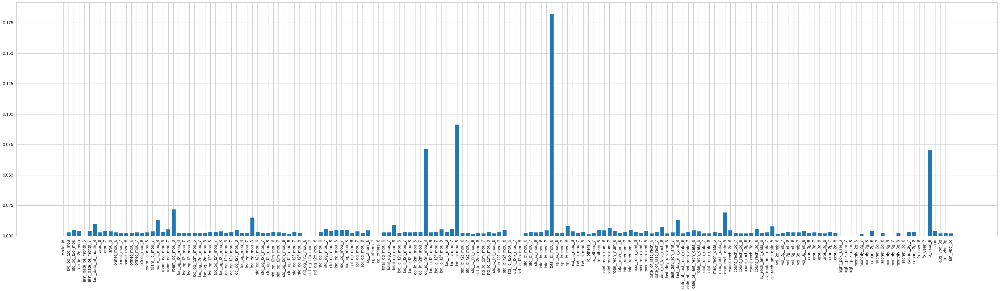

In [20]:
feature_importances = pd.DataFrame({'col': X_train.columns.tolist(), 
                                    'importance':xgb_cf.feature_importances_})

plt.figure(figsize=(50,12))
plt.xticks(rotation=90, ha='center')
plt.bar(feature_importances['col'], feature_importances['importance'])
plt.show()

## STEP #3 - HANDLING MISSING DATA

### 3.1 DROP COLUMNS WITH ALL NULL VALUES

In [21]:
X_train.describe()

,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,og_others_6,og_others_7,og_others_8,total_og_mou_6,total_og_mou_7,total_og_mou_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,ic_others_6,ic_others_7,ic_others_8,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,date_of_last_rech_data_6,date_of_last_rech_data_7,date_of_last_rech_data_8,total_rech_data_6,total_rech_data_7,total_rech_data_8,max_rech_data_6,max_rech_data_7,max_rech_data_8,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_2g_6,arpu_2g_7,arpu_2g_8,night_pck_user_6,night_pck_user_7,night_pck_user_8,monthly_2g_6,monthly_2g_7,monthly_2g_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,fb_user_6,fb_user_7,fb_user_8,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g
count,55999.0,55422.0,55422.0,55422.0,55999.0,55662.0,55398.0,55999.000000,55999.000000,55999.000000,53781.000000,53871.000000,53066.000000,53781.000000,53871.000000,53066.000000,53781.000000,53871.000000,53066.000000,53781.000000,53871.000000,53066.000000,53781.000000,53871.000000,53066.000000,53781.000000,53871.000000,53066.000000,53781.000000,53871.000000,53066.000000,53781.000000,53871.000000,53066.000000,53781.000000,53871.000000,53066.000000,53781.000000,53871.000000,53066.000000,53781.000000,53871.000000,53066.000000,53781.000000,53871.000000,53066.000000,53781.0,53871.0,53066.0,53781.000000,53871.000000,53066.000000,53781.000000,53871.000000,53066.000000,53781.000000,53871.000000,53066.000000,53781.000000,53871.000000,53066.000000,55999.000000,55999.000000,55999.000000,53781.000000,53871.000000,53066.000000,53781.000000,53871.000000,53066.000000,53781.000000,53871.000000,53066.000000,53781.000000,53871.000000,53066.000000,53781.000000,53871.000000,53066.000000,53781.000000,53871.000000,53066.000000,53781.000000,53871.000000,53066.000000,53781.0,53871.0,53066.0,53781.000000,53871.000000,53066.000000,55999.000000,55999.000000,55999.000000,53781.000000,53871.000000,53066.000000,53781.000000,53871.000000,53066.000000,53781.000000,53871.000000,53066.000000,55999.000000,55999.000000,55999.000000,55999.000000,55999.000000,55999.000000,55999.000000,55999.000000,55999.000000,55137.000000,54994.000000,54031.000000,55999.00000,55999.000000,55999.0

In [22]:
# Checking columns with all null values
print(X_train['loc_og_t2o_mou'].value_counts())
print(X_train['std_og_t2o_mou'].value_counts())
print(X_train['loc_ic_t2o_mou'].value_counts())
print(X_train['std_og_t2c_mou_6'].value_counts())
print(X_train['std_og_t2c_mou_7'].value_counts())
print(X_train['std_og_t2c_mou_8'].value_counts())
print(X_train['std_ic_t2o_mou_6'].value_counts())
print(X_train['std_ic_t2o_mou_7'].value_counts())
print(X_train['std_ic_t2o_mou_8'].value_counts())

loc_og_t2o_mou
0.0    55422
Name: count, dtype: int64
std_og_t2o_mou
0.0    55422
Name: count, dtype: int64
loc_ic_t2o_mou
0.0    55422
Name: count, dtype: int64
std_og_t2c_mou_6
0.0    53781
Name: count, dtype: int64
std_og_t2c_mou_7
0.0    53871
Name: count, dtype: int64
std_og_t2c_mou_8
0.0    53066
Name: count, dtype: int64
std_ic_t2o_mou_6
0.0    53781
Name: count, dtype: int64
std_ic_t2o_mou_7
0.0    53871
Name: count, dtype: int64
std_ic_t2o_mou_8
0.0    53066
Name: count, dtype: int64


In [23]:
# Dropping columns with all null values
columns_to_drop = [
    'loc_og_t2o_mou', 'std_og_t2o_mou', 'loc_ic_t2o_mou', 
    'std_og_t2c_mou_6', 'std_og_t2c_mou_7', 'std_og_t2c_mou_8', 
    'std_ic_t2o_mou_6', 'std_ic_t2o_mou_7', 'std_ic_t2o_mou_8'
]

X_train.drop(columns=columns_to_drop, inplace=True)

### 3.2 DROP COLUMNS WITH ONLY ONE UNIQUE VALUE

In [24]:
# Identify categorical columns by checking their unique values
for col in list(X_train.columns):
    print(col, ': ', X_train[col].nunique())

circle_id :  1
last_date_of_month_6 :  1
last_date_of_month_7 :  1
last_date_of_month_8 :  1
arpu_6 :  49977
arpu_7 :  49857
arpu_8 :  48837
onnet_mou_6 :  17702
onnet_mou_7 :  17709
onnet_mou_8 :  17383
offnet_mou_6 :  23384
offnet_mou_7 :  23333
offnet_mou_8 :  23110
roam_ic_mou_6 :  4641
roam_ic_mou_7 :  3702
roam_ic_mou_8 :  3696
roam_og_mou_6 :  5687
roam_og_mou_7 :  4592
roam_og_mou_8 :  4504
loc_og_t2t_mou_6 :  10331
loc_og_t2t_mou_7 :  10191
loc_og_t2t_mou_8 :  10144
loc_og_t2m_mou_6 :  16167
loc_og_t2m_mou_7 :  15989
loc_og_t2m_mou_8 :  15849
loc_og_t2f_mou_6 :  3085
loc_og_t2f_mou_7 :  3070
loc_og_t2f_mou_8 :  3035
loc_og_t2c_mou_6 :  1807
loc_og_t2c_mou_7 :  1926
loc_og_t2c_mou_8 :  2024
loc_og_mou_6 :  19919
loc_og_mou_7 :  19715
loc_og_mou_8 :  19607
std_og_t2t_mou_6 :  12563
std_og_t2t_mou_7 :  12701
std_og_t2t_mou_8 :  12423
std_og_t2m_mou_6 :  13960
std_og_t2m_mou_7 :  14182
std_og_t2m_mou_8 :  13894
std_og_t2f_mou_6 :  1821
std_og_t2f_mou_7 :  1762
std_og_t2f_mou_8 :  

In [25]:
# Dropping columns with non-unique values
columns_to_drop = ['circle_id', 'last_date_of_month_6', 'last_date_of_month_7', 'last_date_of_month_8']

X_train.drop(columns=columns_to_drop, inplace=True)

In [26]:
X_train.shape

(55999, 157)

### 3.3 IMPUTING ROWS WITH MISSING VALUES USING SIMPLEIMPUTER

In [27]:
# !pip install missingno

import missingno as msno

<Axes: >

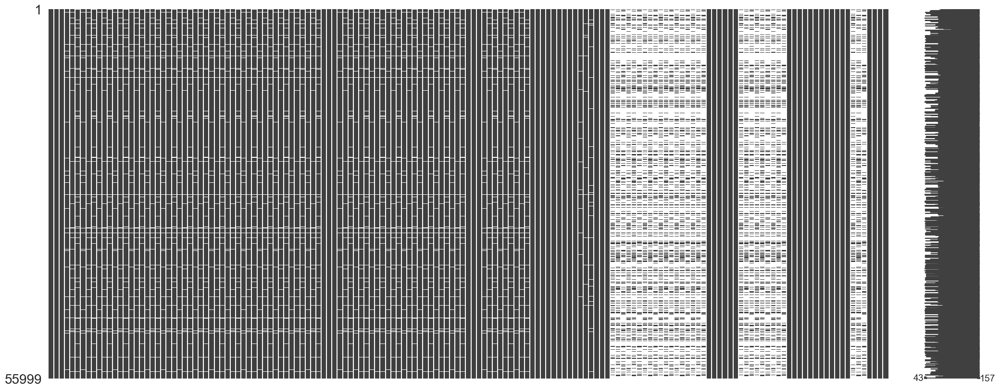

In [28]:
msno.matrix(X_train)

In [29]:
100*X_train.isnull().sum()/X_train.shape[0]

arpu_6                       0.000000
arpu_7                       0.000000
arpu_8                       0.000000
onnet_mou_6                  3.960785
onnet_mou_7                  3.800068
onnet_mou_8                  5.237594
offnet_mou_6                 3.960785
offnet_mou_7                 3.800068
offnet_mou_8                 5.237594
roam_ic_mou_6                3.960785
roam_ic_mou_7                3.800068
roam_ic_mou_8                5.237594
roam_og_mou_6                3.960785
roam_og_mou_7                3.800068
roam_og_mou_8                5.237594
loc_og_t2t_mou_6             3.960785
loc_og_t2t_mou_7             3.800068
loc_og_t2t_mou_8             5.237594
loc_og_t2m_mou_6             3.960785
loc_og_t2m_mou_7             3.800068
loc_og_t2m_mou_8             5.237594
loc_og_t2f_mou_6             3.960785
loc_og_t2f_mou_7             3.800068
loc_og_t2f_mou_8             5.237594
loc_og_t2c_mou_6             3.960785
loc_og_t2c_mou_7             3.800068
loc_og_t2c_m

In [30]:
# Drop date columns with missing value percentage greater than 50%
X_train.drop(columns=['date_of_last_rech_data_6', 'date_of_last_rech_data_7', 'date_of_last_rech_data_8'], axis=1, inplace=True)

In [31]:
X_train.shape

(55999, 154)

In [32]:
100*X_train.isnull().sum()/X_train.shape[0]

arpu_6                  0.000000
arpu_7                  0.000000
arpu_8                  0.000000
onnet_mou_6             3.960785
onnet_mou_7             3.800068
onnet_mou_8             5.237594
offnet_mou_6            3.960785
offnet_mou_7            3.800068
offnet_mou_8            5.237594
roam_ic_mou_6           3.960785
roam_ic_mou_7           3.800068
roam_ic_mou_8           5.237594
roam_og_mou_6           3.960785
roam_og_mou_7           3.800068
roam_og_mou_8           5.237594
loc_og_t2t_mou_6        3.960785
loc_og_t2t_mou_7        3.800068
loc_og_t2t_mou_8        5.237594
loc_og_t2m_mou_6        3.960785
loc_og_t2m_mou_7        3.800068
loc_og_t2m_mou_8        5.237594
loc_og_t2f_mou_6        3.960785
loc_og_t2f_mou_7        3.800068
loc_og_t2f_mou_8        5.237594
loc_og_t2c_mou_6        3.960785
loc_og_t2c_mou_7        3.800068
loc_og_t2c_mou_8        5.237594
loc_og_mou_6            3.960785
loc_og_mou_7            3.800068
loc_og_mou_8            5.237594
std_og_t2t

In [33]:
X_train.dtypes

arpu_6                 float64
arpu_7                 float64
arpu_8                 float64
onnet_mou_6            float64
onnet_mou_7            float64
onnet_mou_8            float64
offnet_mou_6           float64
offnet_mou_7           float64
offnet_mou_8           float64
roam_ic_mou_6          float64
roam_ic_mou_7          float64
roam_ic_mou_8          float64
roam_og_mou_6          float64
roam_og_mou_7          float64
roam_og_mou_8          float64
loc_og_t2t_mou_6       float64
loc_og_t2t_mou_7       float64
loc_og_t2t_mou_8       float64
loc_og_t2m_mou_6       float64
loc_og_t2m_mou_7       float64
loc_og_t2m_mou_8       float64
loc_og_t2f_mou_6       float64
loc_og_t2f_mou_7       float64
loc_og_t2f_mou_8       float64
loc_og_t2c_mou_6       float64
loc_og_t2c_mou_7       float64
loc_og_t2c_mou_8       float64
loc_og_mou_6           float64
loc_og_mou_7           float64
loc_og_mou_8           float64
std_og_t2t_mou_6       float64
std_og_t2t_mou_7       float64
std_og_t

In [34]:
X_train[X_train.isnull().any(axis=1)].head()

,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,og_others_6,og_others_7,og_others_8,total_og_mou_6,total_og_mou_7,total_og_mou_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,ic_others_6,ic_others_7,ic_others_8,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,total_rech_data_6,total_rech_data_7,total_rech_data_8,max_rech_data_6,max_rech_data_7,max_rech_data_8,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_2g_6,arpu_2g_7,arpu_2g_8,night_pck_user_6,night_pck_user_7,night_pck_user_8,monthly_2g_6,monthly_2g_7,monthly_2g_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,fb_user_6,fb_user_7,fb_user_8,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g
id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
47338,172.250,149.720,244.222,20.71,13.16,48.34,152.38,129.73,268.23,0.0,0.0,0.0,0.0,0.0,0.0,20.71,13.16,48.34,140.83,121.26,241.23,11.54,6.79,26.99,0.00,1.66,0.0,173.09,141.23,316.58,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.0,0.0,0.00,0.00,0.00,0.0,0.0,0.0,0.00,1.66,0.00,0.00,0.0,0.0,173.09,142.89,316.58,17.83,16.69,34.51,44.74,29.91,82.41,6.89,40.14,79.53,69.48,86.76,196.46,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.00,0.0,0.00,0.00,0.00,166.04,121.78,205.19,0.0,0.0,0.0,96.56,35.01,8.73,0.00,0.00,0.0,6,4,2,0,0,398,0,0,398,27.0,25.0,6.0,0,0,398,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,0,0,0,0,0,0,0,0,0,0,0,NaN,NaN,NaN,395,0.0,0.0,0.0
67455,155.610,53.934,47.532,11.84,7.54,5.33,107.69,44.76,28.31,0.0,0.0,0.0,0.0,0.0,0.0,11.84,7.54,5.33,86.66,31.26,28.31,0.00,0.00,0.00,20.63,0.00,0.0,98.51,38.81,33.64,0.00,0.00,0.00,0.00,11.13,0.00,0.0,0.0,0.0,0.00,11.13,0.00,0.0,0.0,0.0,21.26,2.88,2.18,0.00,0.0,0.0,119.78,52.83,35.83,109.71,77.11,15.64,533.33,288.61,204.88,2.00,0.55,0.00,645.04,366.28,220.53,0.00,0.00,0.00,0.00,32.41,0.00,0.0,0.73,0.0,0.00,33.14,0.00,645.04,399.43,220.53,0.0,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.0,12,4,3,174,57,70,30,30,30,30.0,21.0,28.0,10,7,30,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,0,0,0,0,0,0,0,0,0,0,0,NaN,NaN,NaN,515,0.0,0.0,0.0
12308,68.285,71.308,35.515,12.64,5.63,0.00,23.16,44.66,19.21,0.0,0.0,0.0,0.0,0.0,0.0,8.94,4.86,0.00,14.44,1.10,1.21,0.00,0.00,0.00,0.00,1.46,0.0,23.39,5.96,1.21,3.70,0.76,0.00,8.71,43.56,

In [35]:
imputer = SimpleImputer(strategy='constant', fill_value=0)

for col in X_train.columns:
    X_train[[col]] = imputer.fit_transform(X_train[[col]])
    # Handling Missing Values for Test and Unseen Data
    X_test[[col]] = imputer.transform(X_test[[col]])
    unseen[[col]] = imputer.transform(unseen[[col]])

In [36]:
100*X_train.isnull().sum()/X_train.shape[0]

arpu_6                 0.0
arpu_7                 0.0
arpu_8                 0.0
onnet_mou_6            0.0
onnet_mou_7            0.0
onnet_mou_8            0.0
offnet_mou_6           0.0
offnet_mou_7           0.0
offnet_mou_8           0.0
roam_ic_mou_6          0.0
roam_ic_mou_7          0.0
roam_ic_mou_8          0.0
roam_og_mou_6          0.0
roam_og_mou_7          0.0
roam_og_mou_8          0.0
loc_og_t2t_mou_6       0.0
loc_og_t2t_mou_7       0.0
loc_og_t2t_mou_8       0.0
loc_og_t2m_mou_6       0.0
loc_og_t2m_mou_7       0.0
loc_og_t2m_mou_8       0.0
loc_og_t2f_mou_6       0.0
loc_og_t2f_mou_7       0.0
loc_og_t2f_mou_8       0.0
loc_og_t2c_mou_6       0.0
loc_og_t2c_mou_7       0.0
loc_og_t2c_mou_8       0.0
loc_og_mou_6           0.0
loc_og_mou_7           0.0
loc_og_mou_8           0.0
std_og_t2t_mou_6       0.0
std_og_t2t_mou_7       0.0
std_og_t2t_mou_8       0.0
std_og_t2m_mou_6       0.0
std_og_t2m_mou_7       0.0
std_og_t2m_mou_8       0.0
std_og_t2f_mou_6       0.0
s

In [37]:
X_train[X_train.isnull().any(axis=1)].head()

,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,og_others_6,og_others_7,og_others_8,total_og_mou_6,total_og_mou_7,total_og_mou_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,ic_others_6,ic_others_7,ic_others_8,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,total_rech_data_6,total_rech_data_7,total_rech_data_8,max_rech_data_6,max_rech_data_7,max_rech_data_8,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_2g_6,arpu_2g_7,arpu_2g_8,night_pck_user_6,night_pck_user_7,night_pck_user_8,monthly_2g_6,monthly_2g_7,monthly_2g_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,fb_user_6,fb_user_7,fb_user_8,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g
id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,


In [38]:
features = X_train.columns

In [39]:
100*X_test[features].isnull().sum()/X_test.shape[0]

arpu_6                 0.0
arpu_7                 0.0
arpu_8                 0.0
onnet_mou_6            0.0
onnet_mou_7            0.0
onnet_mou_8            0.0
offnet_mou_6           0.0
offnet_mou_7           0.0
offnet_mou_8           0.0
roam_ic_mou_6          0.0
roam_ic_mou_7          0.0
roam_ic_mou_8          0.0
roam_og_mou_6          0.0
roam_og_mou_7          0.0
roam_og_mou_8          0.0
loc_og_t2t_mou_6       0.0
loc_og_t2t_mou_7       0.0
loc_og_t2t_mou_8       0.0
loc_og_t2m_mou_6       0.0
loc_og_t2m_mou_7       0.0
loc_og_t2m_mou_8       0.0
loc_og_t2f_mou_6       0.0
loc_og_t2f_mou_7       0.0
loc_og_t2f_mou_8       0.0
loc_og_t2c_mou_6       0.0
loc_og_t2c_mou_7       0.0
loc_og_t2c_mou_8       0.0
loc_og_mou_6           0.0
loc_og_mou_7           0.0
loc_og_mou_8           0.0
std_og_t2t_mou_6       0.0
std_og_t2t_mou_7       0.0
std_og_t2t_mou_8       0.0
std_og_t2m_mou_6       0.0
std_og_t2m_mou_7       0.0
std_og_t2m_mou_8       0.0
std_og_t2f_mou_6       0.0
s

In [40]:
100*unseen[features].isnull().sum()/unseen.shape[0]

arpu_6                 0.0
arpu_7                 0.0
arpu_8                 0.0
onnet_mou_6            0.0
onnet_mou_7            0.0
onnet_mou_8            0.0
offnet_mou_6           0.0
offnet_mou_7           0.0
offnet_mou_8           0.0
roam_ic_mou_6          0.0
roam_ic_mou_7          0.0
roam_ic_mou_8          0.0
roam_og_mou_6          0.0
roam_og_mou_7          0.0
roam_og_mou_8          0.0
loc_og_t2t_mou_6       0.0
loc_og_t2t_mou_7       0.0
loc_og_t2t_mou_8       0.0
loc_og_t2m_mou_6       0.0
loc_og_t2m_mou_7       0.0
loc_og_t2m_mou_8       0.0
loc_og_t2f_mou_6       0.0
loc_og_t2f_mou_7       0.0
loc_og_t2f_mou_8       0.0
loc_og_t2c_mou_6       0.0
loc_og_t2c_mou_7       0.0
loc_og_t2c_mou_8       0.0
loc_og_mou_6           0.0
loc_og_mou_7           0.0
loc_og_mou_8           0.0
std_og_t2t_mou_6       0.0
std_og_t2t_mou_7       0.0
std_og_t2t_mou_8       0.0
std_og_t2m_mou_6       0.0
std_og_t2m_mou_7       0.0
std_og_t2m_mou_8       0.0
std_og_t2f_mou_6       0.0
s

### 3.5 DROP DATE COLUMNS WHICH ARE NOT REQUIRED FOR ANALYSIS

In [41]:
X_train.head()

,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,og_others_6,og_others_7,og_others_8,total_og_mou_6,total_og_mou_7,total_og_mou_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,ic_others_6,ic_others_7,ic_others_8,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,total_rech_data_6,total_rech_data_7,total_rech_data_8,max_rech_data_6,max_rech_data_7,max_rech_data_8,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_2g_6,arpu_2g_7,arpu_2g_8,night_pck_user_6,night_pck_user_7,night_pck_user_8,monthly_2g_6,monthly_2g_7,monthly_2g_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,fb_user_6,fb_user_7,fb_user_8,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g
id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
47338,172.250,149.720,244.222,20.71,13.16,48.34,152.38,129.73,268.23,0.0,0.0,0.0,0.0,0.0,0.0,20.71,13.16,48.34,140.83,121.26,241.23,11.54,6.79,26.99,0.00,1.66,0.0,173.09,141.23,316.58,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.0,0.0,0.00,0.00,0.00,0.0,0.0,0.0,0.00,1.66,0.00,0.00,0.0,0.0,173.09,142.89,316.58,17.83,16.69,34.51,44.74,29.91,82.41,6.89,40.14,79.53,69.48,86.76,196.46,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.00,0.0,0.00,0.00,0.00,166.04,121.78,205.19,0.0,0.0,0.0,96.56,35.01,8.73,0.00,0.00,0.0,6,4,2,0,0,398,0,0,398,27.0,25.0,6.0,0,0,398,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,395,0.0,0.0,0.0
67455,155.610,53.934,47.532,11.84,7.54,5.33,107.69,44.76,28.31,0.0,0.0,0.0,0.0,0.0,0.0,11.84,7.54,5.33,86.66,31.26,28.31,0.00,0.00,0.00,20.63,0.00,0.0,98.51,38.81,33.64,0.00,0.00,0.00,0.00,11.13,0.00,0.0,0.0,0.0,0.00,11.13,0.00,0.0,0.0,0.0,21.26,2.88,2.18,0.00,0.0,0.0,119.78,52.83,35.83,109.71,77.11,15.64,533.33,288.61,204.88,2.00,0.55,0.00,645.04,366.28,220.53,0.00,0.00,0.00,0.00,32.41,0.00,0.0,0.73,0.0,0.00,33.14,0.00,645.04,399.43,220.53,0.0,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.0,12,4,3,174,57,70,30,30,30,30.0,21.0,28.0,10,7,30,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,515,0.0,0.0,0.0
12308,68.285,71.308,35.515,12.64,5.63,0.00,23.16,44.66,19.21,0.0,0.0,0.0,0.0,0.0,0.0,8.94,4.86,0.00,14.44,1.10,1.21,0.00,0.00,0.00,0.00,1.46,0.0,23.39,5.96,1.21,3.70,0.76,0.00,8.71,43.56,

In [42]:
# Dropping Date columns as they do not contribute to business sense
date_columns = ['date_of_last_rech_6', 'date_of_last_rech_7', 'date_of_last_rech_8']

X_train.drop(columns=date_columns, inplace=True)
    
X_train.head()

,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,og_others_6,og_others_7,og_others_8,total_og_mou_6,total_og_mou_7,total_og_mou_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,ic_others_6,ic_others_7,ic_others_8,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,total_rech_data_6,total_rech_data_7,total_rech_data_8,max_rech_data_6,max_rech_data_7,max_rech_data_8,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_2g_6,arpu_2g_7,arpu_2g_8,night_pck_user_6,night_pck_user_7,night_pck_user_8,monthly_2g_6,monthly_2g_7,monthly_2g_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,fb_user_6,fb_user_7,fb_user_8,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g
id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
47338,172.250,149.720,244.222,20.71,13.16,48.34,152.38,129.73,268.23,0.0,0.0,0.0,0.0,0.0,0.0,20.71,13.16,48.34,140.83,121.26,241.23,11.54,6.79,26.99,0.00,1.66,0.0,173.09,141.23,316.58,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.0,0.0,0.00,0.00,0.00,0.0,0.0,0.0,0.00,1.66,0.00,0.00,0.0,0.0,173.09,142.89,316.58,17.83,16.69,34.51,44.74,29.91,82.41,6.89,40.14,79.53,69.48,86.76,196.46,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.00,0.0,0.00,0.00,0.00,166.04,121.78,205.19,0.0,0.0,0.0,96.56,35.01,8.73,0.00,0.00,0.0,6,4,2,0,0,398,0,0,398,0,0,398,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,395,0.0,0.0,0.0
67455,155.610,53.934,47.532,11.84,7.54,5.33,107.69,44.76,28.31,0.0,0.0,0.0,0.0,0.0,0.0,11.84,7.54,5.33,86.66,31.26,28.31,0.00,0.00,0.00,20.63,0.00,0.0,98.51,38.81,33.64,0.00,0.00,0.00,0.00,11.13,0.00,0.0,0.0,0.0,0.00,11.13,0.00,0.0,0.0,0.0,21.26,2.88,2.18,0.00,0.0,0.0,119.78,52.83,35.83,109.71,77.11,15.64,533.33,288.61,204.88,2.00,0.55,0.00,645.04,366.28,220.53,0.00,0.00,0.00,0.00,32.41,0.00,0.0,0.73,0.0,0.00,33.14,0.00,645.04,399.43,220.53,0.0,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.0,12,4,3,174,57,70,30,30,30,10,7,30,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,515,0.0,0.0,0.0
12308,68.285,71.308,35.515,12.64,5.63,0.00,23.16,44.66,19.21,0.0,0.0,0.0,0.0,0.0,0.0,8.94,4.86,0.00,14.44,1.10,1.21,0.00,0.00,0.00,0.00,1.46,0.0,23.39,5.96,1.21,3.70,0.76,0.00,8.71,43.56,18.00,0.0,0.0,0.0,12.41,44.33,18.00,0.0,0.0,0.0,0.20,9.73,2.93,0.81,0.0,0.0,36.83,60.03,22.1

### 3.6 DROPPING COLUMNS THAT ARE CORRELATED TO OTHERS

In [43]:
# Checking for Correlation between Independent Variables
corr = X_train.corr()
corr.loc[:, :] = np.tril(corr, -1)
corr = corr.stack()

In [44]:
corr[(corr > 0.70) | (corr < -0.70)]

arpu_7              arpu_6                0.709880
arpu_8              arpu_7                0.751045
onnet_mou_7         onnet_mou_6           0.735950
onnet_mou_8         onnet_mou_7           0.785000
offnet_mou_7        offnet_mou_6          0.740543
offnet_mou_8        offnet_mou_7          0.764095
loc_og_t2t_mou_7    loc_og_t2t_mou_6      0.785208
loc_og_t2t_mou_8    loc_og_t2t_mou_7      0.808376
loc_og_t2m_mou_7    loc_og_t2m_mou_6      0.789582
loc_og_t2m_mou_8    loc_og_t2m_mou_7      0.815537
loc_og_t2f_mou_7    loc_og_t2f_mou_6      0.780236
loc_og_t2f_mou_8    loc_og_t2f_mou_6      0.709437
                    loc_og_t2f_mou_7      0.787547
loc_og_mou_6        loc_og_t2t_mou_6      0.768139
                    loc_og_t2m_mou_6      0.825051
loc_og_mou_7        loc_og_t2t_mou_7      0.778116
                    loc_og_t2m_mou_7      0.800725
                    loc_og_mou_6          0.810747
loc_og_mou_8        loc_og_t2t_mou_8      0.788028
                    loc_og_t2m_

In [45]:
# Based on the above correlations the following features are well implied by the other features and hence, are less important
columns_to_drop = [
    'loc_og_t2t_mou_6', 'loc_og_t2t_mou_7', 'loc_og_t2t_mou_8', 
    'loc_og_t2m_mou_6', 'loc_og_t2m_mou_7', 'loc_og_t2m_mou_8',
    'loc_og_t2f_mou_6', 'loc_og_t2f_mou_7', 'loc_og_t2f_mou_8',
    'loc_og_t2c_mou_6', 'loc_og_t2c_mou_7', 'loc_og_t2c_mou_8',
    'loc_ic_t2t_mou_6', 'loc_ic_t2t_mou_7', 'loc_ic_t2t_mou_8', 
    'loc_ic_t2m_mou_6', 'loc_ic_t2m_mou_7', 'loc_ic_t2m_mou_8',
    'loc_ic_t2f_mou_6', 'loc_ic_t2f_mou_7', 'loc_ic_t2f_mou_8',
    'std_og_t2t_mou_6', 'std_og_t2t_mou_7', 'std_og_t2t_mou_8',
    'std_og_t2m_mou_6', 'std_og_t2m_mou_7', 'std_og_t2m_mou_8',
    'std_og_t2f_mou_6', 'std_og_t2f_mou_7', 'std_og_t2f_mou_8',
    'std_ic_t2t_mou_6', 'std_ic_t2t_mou_7', 'std_ic_t2t_mou_8',
    'std_ic_t2m_mou_6', 'std_ic_t2m_mou_7', 'std_ic_t2m_mou_8',
    'std_ic_t2f_mou_6', 'std_ic_t2f_mou_7', 'std_ic_t2f_mou_8',
]

In [46]:
X_train.drop(columns_to_drop, axis=1, inplace=True)
X_train.shape

(55999, 112)

In [47]:
X_train.head()

,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,og_others_6,og_others_7,og_others_8,total_og_mou_6,total_og_mou_7,total_og_mou_8,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,ic_others_6,ic_others_7,ic_others_8,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,total_rech_data_6,total_rech_data_7,total_rech_data_8,max_rech_data_6,max_rech_data_7,max_rech_data_8,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_2g_6,arpu_2g_7,arpu_2g_8,night_pck_user_6,night_pck_user_7,night_pck_user_8,monthly_2g_6,monthly_2g_7,monthly_2g_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,fb_user_6,fb_user_7,fb_user_8,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g
id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
47338,172.250,149.720,244.222,20.71,13.16,48.34,152.38,129.73,268.23,0.0,0.0,0.0,0.0,0.0,0.0,173.09,141.23,316.58,0.00,0.00,0.00,0.0,0.0,0.0,0.00,1.66,0.00,0.00,0.0,0.0,173.09,142.89,316.58,69.48,86.76,196.46,0.00,0.00,0.00,166.04,121.78,205.19,0.0,0.0,0.0,96.56,35.01,8.73,0.00,0.00,0.0,6,4,2,0,0,398,0,0,398,0,0,398,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,395,0.0,0.0,0.0
67455,155.610,53.934,47.532,11.84,7.54,5.33,107.69,44.76,28.31,0.0,0.0,0.0,0.0,0.0,0.0,98.51,38.81,33.64,0.00,11.13,0.00,0.0,0.0,0.0,21.26,2.88,2.18,0.00,0.0,0.0,119.78,52.83,35.83,645.04,366.28,220.53,0.00,33.14,0.00,645.04,399.43,220.53,0.0,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.0,12,4,3,174,57,70,30,30,30,10,7,30,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,515,0.0,0.0,0.0
12308,68.285,71.308,35.515,12.64,5.63,0.00,23.16,44.66,19.21,0.0,0.0,0.0,0.0,0.0,0.0,23.39,5.96,1.21,12.41,44.33,18.00,0.0,0.0,0.0,0.20,9.73,2.93,0.81,0.0,0.0,36.83,60.03,22.14,116.44,98.14,12.48,48.94,61.34,0.89,165.59,164.36,13.38,0.0,0.2,0.0,0.00,0.00,0.00,0.20,4.66,0.0,5,5,3,80,80,40,30,50,30,30,50,10,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,595,0.0,0.0,0.0
52334,139.165,205.666,172.807,68.78,207.41,57.04,172.33,187.66,239.06,0.0,0.0,0.0,0.0,0.0,0.0,1.71,0.00,1.54,239.39,394.73,294.56,0.0,0.0,0.0,0.00,0.35,0.00,0.00,0.0,0.0,241.11,395.08,296.11,9.43,6.16,2.51,12.11,27.38,16.99,21.54,33.54,19.51,0.0,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.0,7,10,5,226,236,136,110,110,50,10,110,36,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,656,0.0,0.0,0.0
664,475.536,137.251,0.000,25.26,11.58,0.00,574.48,148.59,0.00,0.0,0.0,0.0,0.0,0.0,0.0,599.74,160.18,0.00,0.00,0.00,0.00,0.0,0.0,0.0,0.00,0.00,0.00,0.00,0.0,0.0,599.74,160.18,0.00,297.24,62.24,0.00,0.78,0.00,0.00,298.29,62.24,0.00,0.0,0.0,0.0,0.00,0.00,0.00,0.26,0.00,0.0,9,3,1,660,110,0,110,110,0,110,0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,

<Axes: >

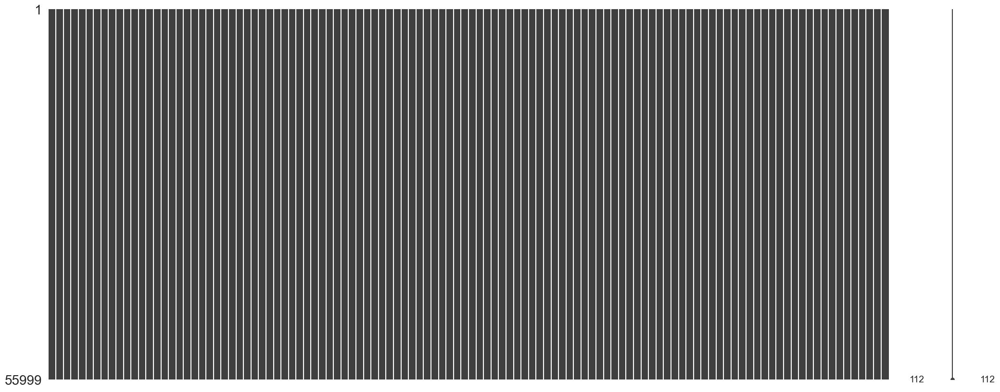

In [48]:
msno.matrix(X_train)

## STEP #4 - HANDLING OUTLIERS

In [49]:
# Function to cap outliers using the K-sigma method
def cap_outliers_k_sigma_method(series, k=3):
    mean = series.mean()
    std_dev = series.std()
    lower_bound = mean - k * std_dev
    upper_bound = mean + k * std_dev
    return series.apply(lambda x: lower_bound if x < lower_bound else (upper_bound if x > upper_bound else x))

In [50]:
# Handling Outliers
columns_to_handle = [i for i in list(X_train.columns) if X_train[i].nunique() > 50]

for col in columns_to_handle:
    X_train[col] = cap_outliers_k_sigma_method(X_train[col])

X_train.shape

(55999, 112)

## STEP #5 - EXPLORATORY DATA ANALYSIS

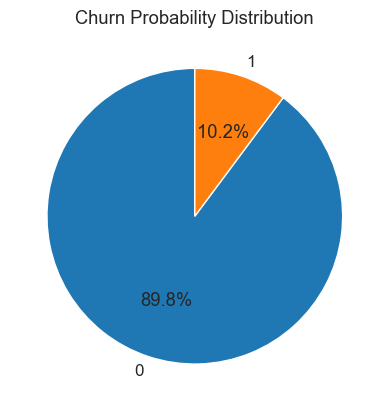

In [51]:
# Checking Balance of Target Variable
pd.Series(y_train).value_counts().plot.pie(autopct='%1.1f%%', startangle=90)
plt.ylabel('')
plt.title('Churn Probability Distribution')
plt.show()

#### OBSERVATION: The data is highly imbalanced

### 5.1 UNIVARIATE ANALYSIS

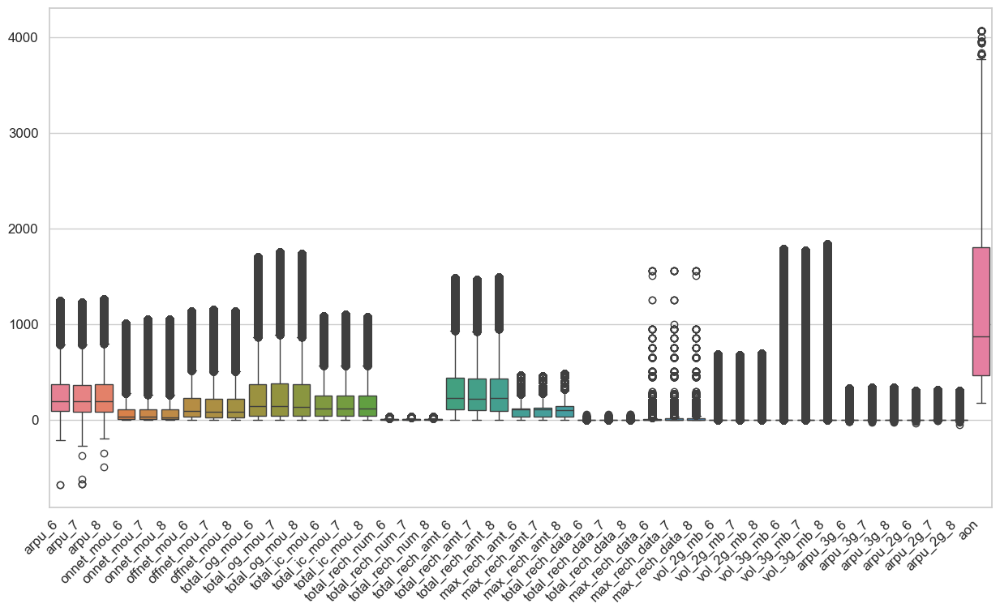

In [52]:
# Total Usage Metrics
columns = [i for i in list(X_train.columns) if re.search('arpu|offnet|onnet|total|max|vol|aon',i)]
plt.figure(figsize=(15,8))
plt.xticks(rotation=45, ha='right')
sns.boxplot(data = X_train[columns])
plt.show()

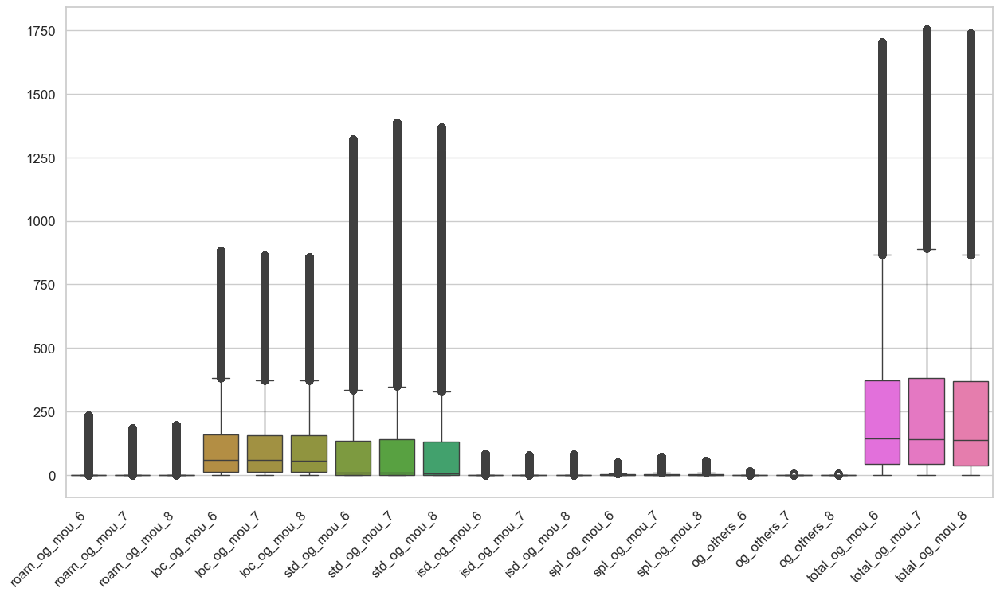

In [53]:
# Outgoing Usage Metrics
columns = [i for i in list(X_train.columns) if re.search('og',i)]
plt.figure(figsize=(15,8))
plt.xticks(rotation=45, ha='right')
sns.boxplot(data = X_train[columns])
plt.show()

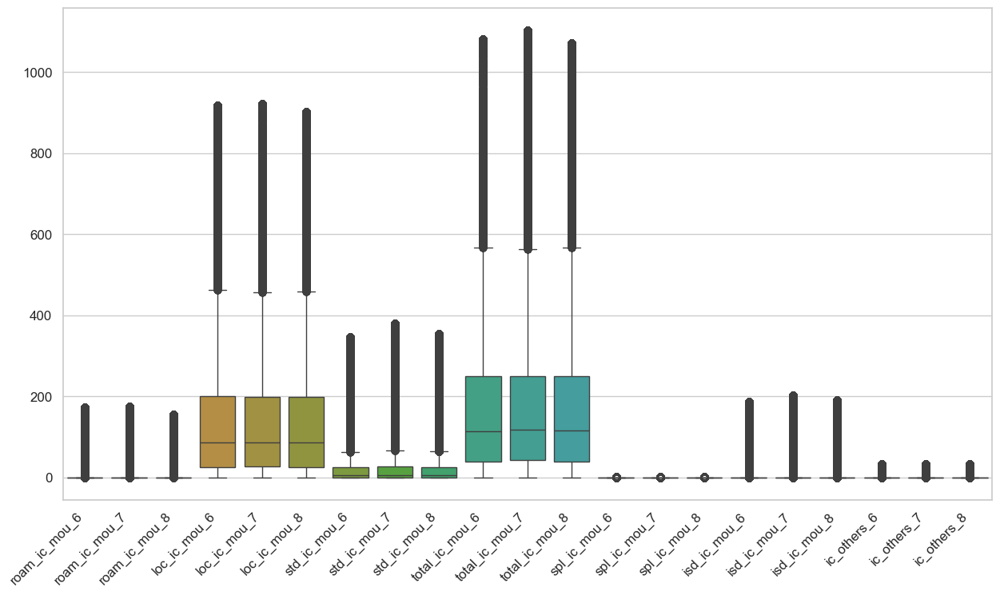

In [54]:
# Incoming Usage Metrics
columns = [i for i in list(X_train.columns) if re.search('ic',i)]
plt.figure(figsize=(15,8))
plt.xticks(rotation=45, ha='right')
sns.boxplot(data = X_train[columns])
plt.show()

##### Roaming, ISD, Special Package Data, and Others are highly skewed for both outgoing and incoming usages.

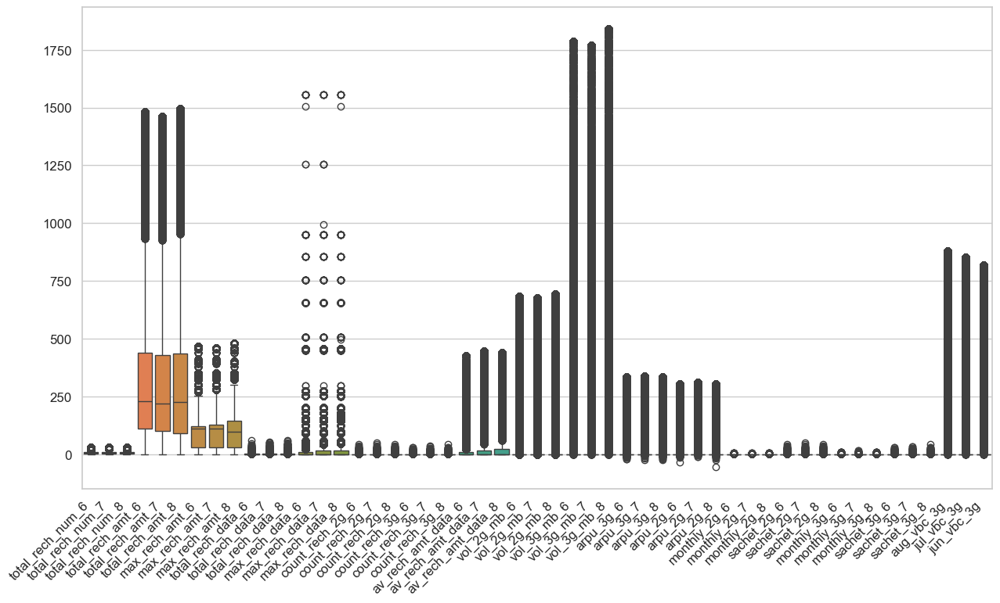

In [55]:
# Data Usage and Recharge Patterns
columns = [i for i in list(X_train.columns) if re.search('2g|3g|rech',i)]
plt.figure(figsize=(15,8))
plt.xticks(rotation=45, ha='right')
sns.boxplot(data = X_train[columns])
plt.show()

##### Most of the features are highly skewed and we need to perform Data transormation. Since they have a Positive Skew we should perform a Log Transformation

### 5.2 BIVARIATE ANALYSIS

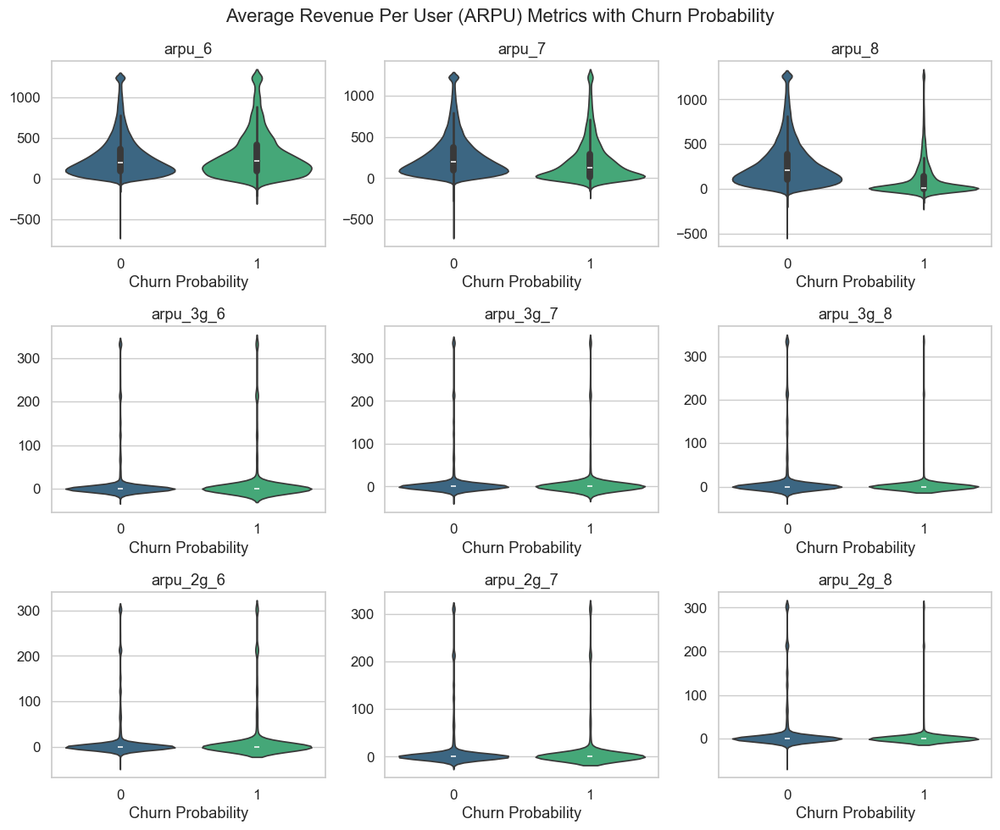

In [56]:
# Average Revenue Per User
columns = [col for col in X_train.columns if re.search('arpu', col)]
plt.figure(figsize=(12, 10))

for i, col in enumerate(columns):
    plt.subplot(3, 3, i + 1)
    sns.violinplot(x=pd.Series(y_train), y=X_train[col], palette="viridis")
    plt.title(f'{col}')
    plt.xlabel('Churn Probability')
    plt.ylabel('')

plt.suptitle('Average Revenue Per User (ARPU) Metrics with Churn Probability')
plt.tight_layout()
plt.show()

##### 1. Variance of ARPU significantly drops for users having a Churn Probability of 1

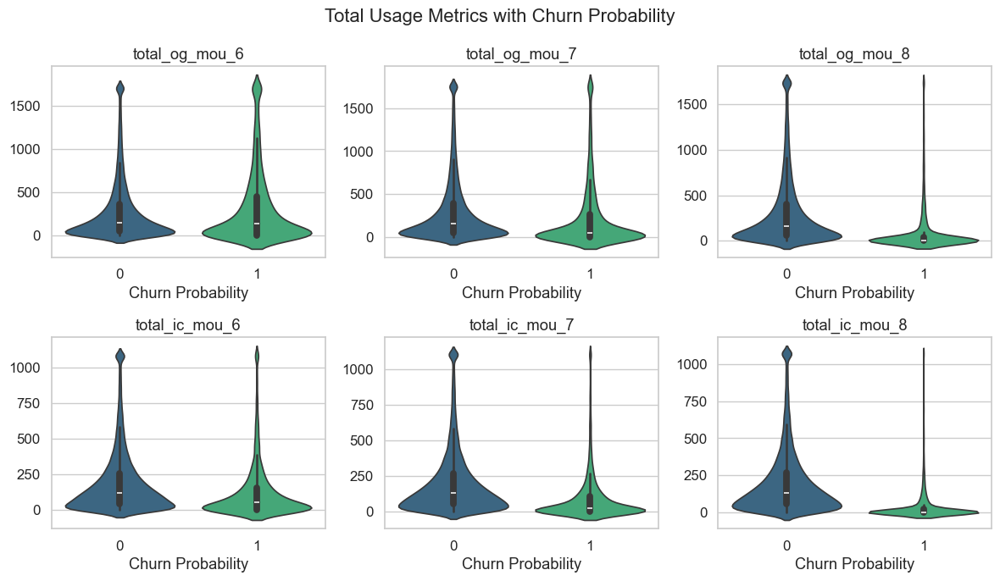

In [57]:
# Total Usage Metrics
columns = [i for i in list(X_train.columns) if re.search('total.+mou',i)]
plt.figure(figsize=(12, 7))

for i, col in enumerate(columns):
    plt.subplot(2, 3, i + 1)
    sns.violinplot(x=pd.Series(y_train), y=X_train[col], palette="viridis")
    plt.title(f'{col}')
    plt.xlabel('Churn Probability')
    plt.ylabel('')

plt.suptitle('Total Usage Metrics with Churn Probability')
plt.tight_layout()
plt.show()

##### 2. Outgoing Usage Decrease more drastically than Incoming Usage.

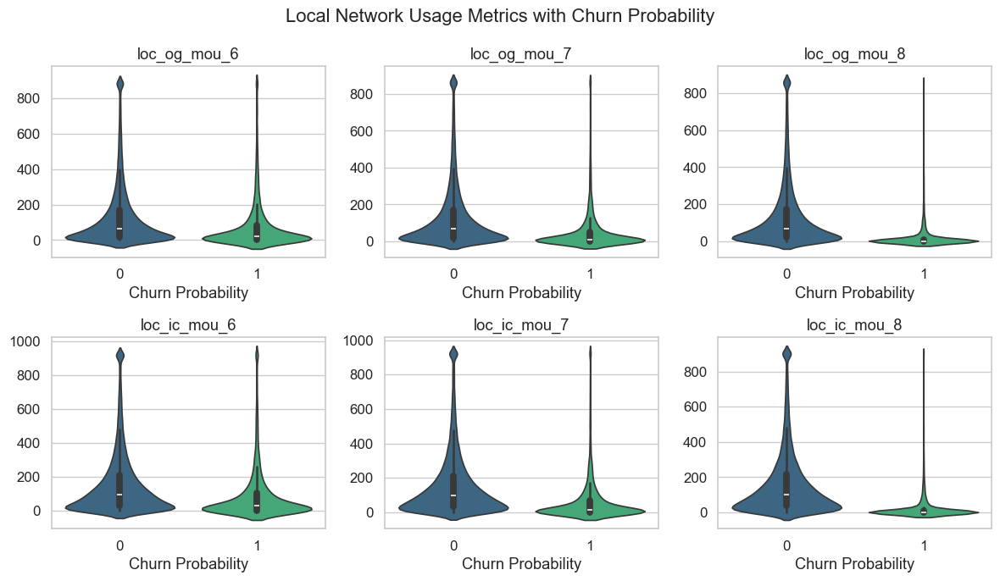

In [58]:
# Local Network Usage Metrics
columns = [i for i in list(X_train.columns) if re.search('loc_ic_mou|loc_og_mou',i)]
plt.figure(figsize=(12, 7))

for i, col in enumerate(columns):
    plt.subplot(2, 3, i + 1)
    sns.violinplot(x=pd.Series(y_train), y=X_train[col], palette="viridis")
    plt.title(f'{col}')
    plt.xlabel('Churn Probability')
    plt.ylabel('')

plt.suptitle('Local Network Usage Metrics with Churn Probability')
plt.tight_layout()
plt.show()

##### 3. Volume of Local Incoming decreased but variance increased for customers who churned

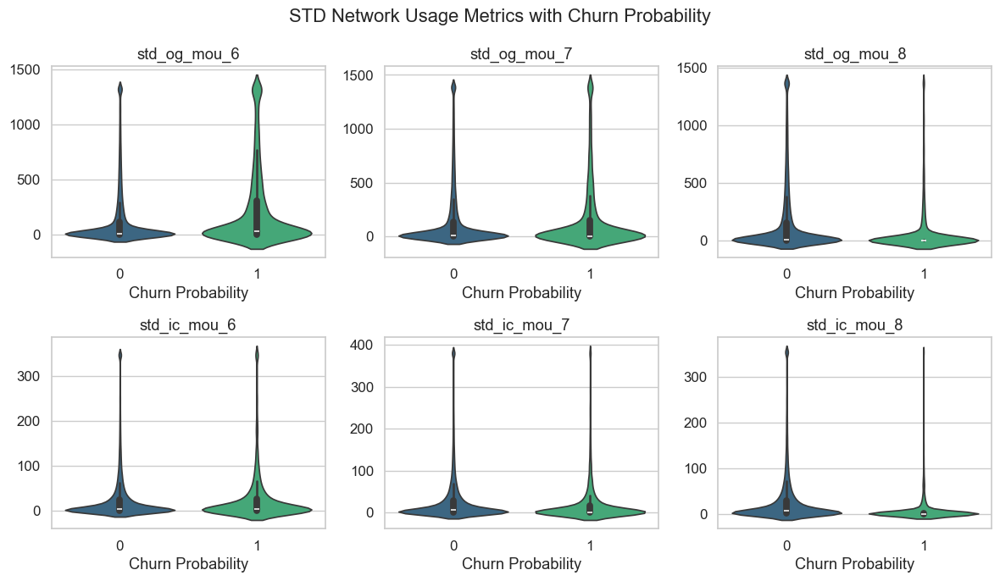

In [59]:
# STD Network Usage Metrics
columns = [i for i in list(X_train.columns) if re.search('std_ic_mou|std_og_mou',i)]
plt.figure(figsize=(12, 7))

for i, col in enumerate(columns):
    plt.subplot(2, 3, i + 1)
    sns.violinplot(x=pd.Series(y_train), y=X_train[col], palette="viridis")
    plt.title(f'{col}')
    plt.xlabel('Churn Probability')
    plt.ylabel('')

plt.suptitle('STD Network Usage Metrics with Churn Probability')
plt.tight_layout()
plt.show()

##### 4. STD Usage was higher in customers who churned as compared to customers who didn't churn in June and drastically decreased over the months. It appears that the customers who churn usually used the telecom services for STD rather than local.

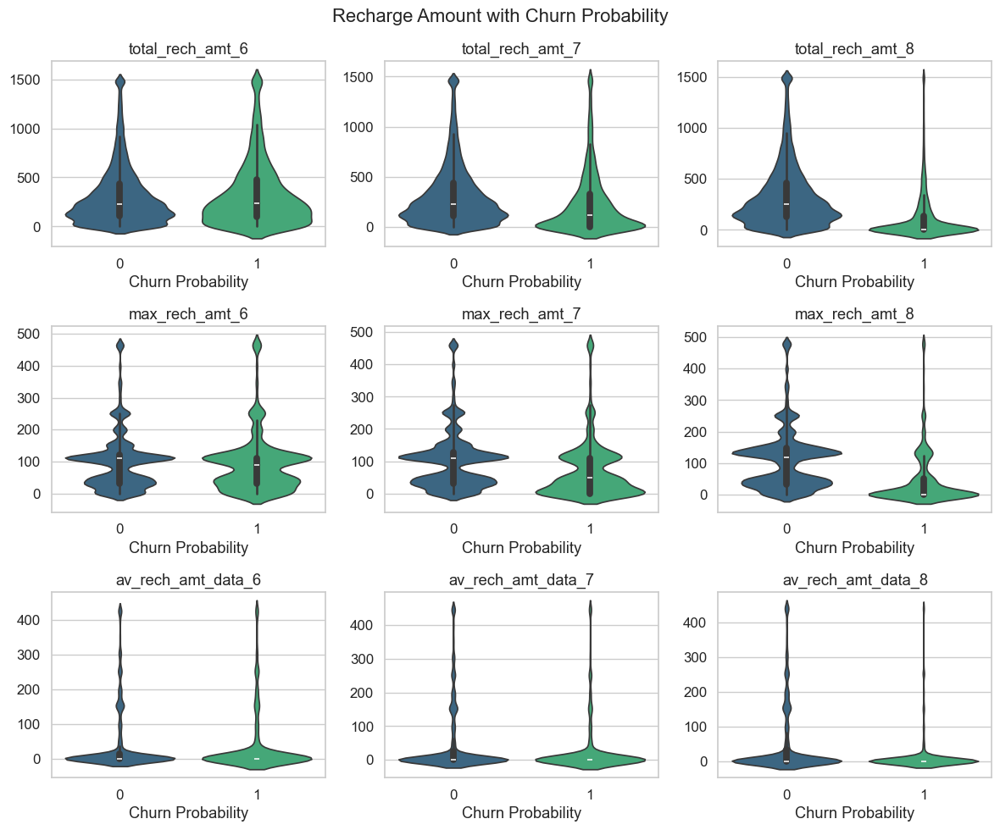

In [60]:
# Recharge Patterns
columns = [i for i in list(X_train.columns) if re.search('rech_amt',i)]
plt.figure(figsize=(12, 10))

for i, col in enumerate(columns):
    plt.subplot(3, 3, i + 1)
    sns.violinplot(x=pd.Series(y_train), y=X_train[col], palette="viridis")
    plt.title(f'{col}')
    plt.xlabel('Churn Probability')
    plt.ylabel('')

plt.suptitle('Recharge Amount with Churn Probability')
plt.tight_layout()
plt.show()

##### 5. Maximum Recharge Amount decreased from 100 to 50  and then to zero over the months.

## STEP #6 - FEATURE ENGINEERING

In [61]:
X_train.shape

(55999, 112)

In [62]:
features = X_train.columns

In [63]:
X_test[features].head()

,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,og_others_6,og_others_7,og_others_8,total_og_mou_6,total_og_mou_7,total_og_mou_8,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,ic_others_6,ic_others_7,ic_others_8,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,total_rech_data_6,total_rech_data_7,total_rech_data_8,max_rech_data_6,max_rech_data_7,max_rech_data_8,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_2g_6,arpu_2g_7,arpu_2g_8,night_pck_user_6,night_pck_user_7,night_pck_user_8,monthly_2g_6,monthly_2g_7,monthly_2g_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,fb_user_6,fb_user_7,fb_user_8,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g
id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
57621,1127.020,1363.096,421.153,365.19,402.24,165.88,216.56,168.61,57.63,0.0,0.00,0.0,0.0,0.00,0.0,386.98,382.71,156.33,107.19,60.54,55.19,87.58,128.98,3.01,0.00,0.68,9.29,1.78,0.0,0.0,583.54,572.93,223.84,146.16,164.71,153.13,38.68,38.09,52.53,258.03,263.19,279.93,0.00,0.0,0.0,73.18,60.38,74.26,0.00,0.00,0.0,25,26,14,1525,1805,465,110,120,70,30,30,30,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.0,0.00,0.0,0.0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,669,0.00,0.00,0.00
39559,517.241,407.339,426.689,112.28,126.01,99.61,226.66,358.43,423.01,0.0,0.00,0.0,0.0,0.00,0.0,185.33,195.09,156.84,151.46,274.98,357.73,0.00,0.00,0.00,2.15,14.36,8.05,0.00,0.0,0.0,338.94,484.44,522.63,83.63,58.56,133.66,29.69,6.64,22.94,113.73,65.59,156.61,0.39,0.0,0.0,0.00,0.00,0.00,0.00,0.38,0.0,9,12,11,640,489,501,154,154,154,65,0,0,5.0,8.0,6.0,154.0,154.0,154.0,5.0,8.0,6.0,0.0,0.0,0.0,377.0,315.0,269.0,193.77,128.26,7.73,1102.99,812.47,1181.12,-1.98,0.01,0.01,0.0,0.0,0.00,0.0,0.0,0.0,2,1,1,3,7,5,0,0,0,0,0,0,1.0,1.0,1.0,464,107.79,916.29,1235.71
41415,648.204,586.811,618.653,777.76,766.84,802.01,424.31,220.96,351.34,0.0,0.00,0.0,0.0,0.00,0.0,15.41,30.63,24.84,1186.66,957.01,1128.51,0.00,0.00,0.00,0.00,0.16,0.00,0.00,0.0,0.0,1202.08,987.81,1153.36,18.41,71.01,28.18,16.58,11.74,13.73,39.91,82.76,41.91,0.00,0.0,0.0,0.00,0.00,0.00,4.91,0.00,0.0,33,40,32,746,656,716,70,50,50,50,20,30,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.0,0.00,0.0,0.0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,405,0.00,0.00,0.00
47731,245.917,177.315,132.963,172.14,83.96,84.58,171.76,59.28,23.11,0.0,0.00,0.0,0.0,0.00,0.0,43.26,59.51,16.96,299.63,83.73,83.11,1.01,0.00,0.00,0.00,0.00,7.61,0.00,0.0,0.0,343.91,143.24,107.69,112.23,119.73,113.16,3.41,0.15,0.58,115.64,119.88,113.74,0.00,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.0,13,12,11,270,200,150,30,30,30,20,30,20,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.0,0.00,0.0,0.0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,1240,0.00,0.00,0.00
64801,891.619,765.631,920.688,475.13,419.36,650.71,867.71,615.79,610.68,0.0,35.04,0.0,0.0,116.76,0.0,303.99,245.63,335.33,1023.59,672.49,915.86,0.20,0.26,0.00,15.04,0.00,10.20,0.00,0.0,0.0,1342.84,918.39,1261.39,271.51,188.09,289.

In [64]:
unseen[features].head()

,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,og_others_6,og_others_7,og_others_8,total_og_mou_6,total_og_mou_7,total_og_mou_8,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,ic_others_6,ic_others_7,ic_others_8,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,total_rech_data_6,total_rech_data_7,total_rech_data_8,max_rech_data_6,max_rech_data_7,max_rech_data_8,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_2g_6,arpu_2g_7,arpu_2g_8,night_pck_user_6,night_pck_user_7,night_pck_user_8,monthly_2g_6,monthly_2g_7,monthly_2g_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,fb_user_6,fb_user_7,fb_user_8,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g
id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
69999,91.882,65.330,64.445,31.78,20.23,23.11,60.16,32.16,34.83,0.00,0.00,0.00,0.00,0.00,0.00,43.01,44.71,29.43,48.93,7.68,28.48,0.0,0.0,0.0,0.00,0.00,0.03,0.0,0.0,0.0,91.94,52.39,57.94,40.81,42.16,31.51,0.36,1.04,4.34,41.73,43.56,36.26,0.54,0.34,0.39,0.00,0.00,0.00,0.0,0.0,0.00,5,5,4,103,90,60,50,30,30,30,30,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,1692,0.00,0.00,0.00
70000,414.168,515.568,360.868,75.51,41.21,19.84,474.34,621.84,394.94,0.00,0.00,0.00,0.00,0.00,0.00,549.86,639.29,397.11,0.00,23.76,17.68,0.0,0.0,0.8,0.00,0.00,0.00,0.0,0.0,0.0,549.86,663.06,415.59,181.69,149.24,187.43,0.00,12.51,0.00,296.33,339.64,281.66,0.00,0.00,0.00,114.63,177.88,94.23,0.0,0.0,0.00,5,4,5,500,500,500,250,250,250,250,0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,2533,0.00,0.00,0.00
70001,329.844,434.884,746.239,7.54,7.86,8.40,16.98,45.81,45.04,22.81,103.38,26.08,24.53,53.68,54.44,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.0,0.0,0.00,0.00,0.00,0.0,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.0,0.00,6,9,5,500,1000,1000,300,500,500,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,277,525.61,758.41,241.84
70002,43.550,171.390,24.400,5.31,2.16,0.00,40.04,205.01,24.01,0.00,0.00,0.00,0.00,0.00,0.00,8.26,98.61,22.86,37.09,96.53,0.00,0.0,0.0,0.0,0.00,12.03,1.15,0.0,0.0,0.0,45.36,207.18,24.01,546.06,504.86,531.64,9.63,16.14,8.83,555.69,522.44,549.13,0.00,0.00,0.00,0.00,1.43,8.65,0.0,0.0,0.00,3,5,2,110,260,0,110,150,0,110,150,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,1244,0.00,0.00,0.00
70003,306.854,406.289,413.329,450.93,609.03,700.68,60.94,23.84,74.16,0.00,0.00,0.00,0.00,0.00,0.00,2.84,3.44,25.51,509.03,629.43,749.29,0.0,0.0,0.0,0.71,5.39,4.96,2.2,0.0,0.0,514.79,638.28,779.78,10.13,9.59,17.61,43.59,106.33,141.48,53.73,115.93,159.26,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.0,0.16,11,7,8,356,490,546,90,130,130,50,130,130,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,

### 6.1 DERIVING NEW FEATURES

In [65]:
# Ratio of total outgoing amount and age on network (average daily usage)
X_train['avg_daily_usage_ratio'] = X_train[['total_og_mou_6', 'total_og_mou_7', 'total_og_mou_8']].sum(axis=1) / X_train['aon']

X_test['avg_daily_usage_ratio'] = X_test[['total_og_mou_6', 'total_og_mou_7', 'total_og_mou_8']].sum(axis=1) / X_test['aon']

unseen['avg_daily_usage_ratio'] = unseen[['total_og_mou_6', 'total_og_mou_7', 'total_og_mou_8']].sum(axis=1) / unseen['aon']

In [66]:
# Standard deviation of ARPU over the three months
X_train['arpu_std_dev'] = X_train[['arpu_6', 'arpu_7', 'arpu_8']].std(axis=1)

X_test['arpu_std_dev'] = X_test[['arpu_6', 'arpu_7', 'arpu_8']].std(axis=1)

unseen['arpu_std_dev'] = unseen[['arpu_6', 'arpu_7', 'arpu_8']].std(axis=1)

In [67]:
X_train.head()

,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,og_others_6,og_others_7,og_others_8,total_og_mou_6,total_og_mou_7,total_og_mou_8,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,ic_others_6,ic_others_7,ic_others_8,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,total_rech_data_6,total_rech_data_7,total_rech_data_8,max_rech_data_6,max_rech_data_7,max_rech_data_8,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_2g_6,arpu_2g_7,arpu_2g_8,night_pck_user_6,night_pck_user_7,night_pck_user_8,monthly_2g_6,monthly_2g_7,monthly_2g_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,fb_user_6,fb_user_7,fb_user_8,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,avg_daily_usage_ratio,arpu_std_dev
id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
47338,172.250,149.720,244.222,20.71,13.16,48.34,152.38,129.73,268.23,0.0,0.0,0.0,0.0,0.0,0.0,173.09,141.23,316.58,0.00,0.00,0.00,0.0,0.0,0.0,0.00,1.66,0.00,0.00,0.0,0.0,173.09,142.89,316.58,69.48,86.76,196.46,0.00,0.00,0.00,166.04,121.78,205.19,0.0,0.0,0.0,96.56,35.01,8.73,0.00,0.00,0.0,6.0,4.0,2.0,0.0,0.0,398.0,0.0,0.0,398.0,0.0,0.0,367.448883,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,395.0,0.0,0.0,0.0,1.601418,49.359561
67455,155.610,53.934,47.532,11.84,7.54,5.33,107.69,44.76,28.31,0.0,0.0,0.0,0.0,0.0,0.0,98.51,38.81,33.64,0.00,11.13,0.00,0.0,0.0,0.0,21.26,2.88,2.18,0.00,0.0,0.0,119.78,52.83,35.83,645.04,366.28,220.53,0.00,33.14,0.00,645.04,399.43,220.53,0.0,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.0,12.0,4.0,3.0,174.0,57.0,70.0,30.0,30.0,30.0,10.0,7.0,30.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,515.0,0.0,0.0,0.0,0.404738,60.635315
12308,68.285,71.308,35.515,12.64,5.63,0.00,23.16,44.66,19.21,0.0,0.0,0.0,0.0,0.0,0.0,23.39,5.96,1.21,12.41,44.33,18.00,0.0,0.0,0.0,0.20,9.73,2.93,0.81,0.0,0.0,36.83,60.03,22.14,116.44,98.14,12.48,48.94,61.34,0.89,165.59,164.36,13.38,0.0,0.2,0.0,0.00,0.00,0.00,0.20,4.66,0.0,5.0,5.0,3.0,80.0,80.0,40.0,30.0,50.0,30.0,30.0,50.0,10.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,595.0,0.0,0.0,0.0,0.200000,19.850064
52334,139.165,205.666,172.807,68.78,207.41,57.04,172.33,187.66,239.06,0.0,0.0,0.0,0.0,0.0,0.0,1.71,0.00,1.54,239.39,394.73,294.56,0.0,0.0,0.0,0.00,0.35,0.00,0.00,0.0,0.0,241.11,395.08,296.11,9.43,6.16,2.51,12.11,27.38,16.99,21.54,33.54,19.51,0.0,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.0,7.0,10.0,5.0,226.0,236.0,136.0,110.0,110.0,50.0,10.0,110.0,36.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,656.0,0.0,0.0,0.0,1.421189,33.251268
664,475.536,137.251,0.000,25.26,11.58,0.00,574.48,148.59,0.00,0.0,0.0,0.0,0.0,0.0,0.0,599.74,160.18,0.00,0.00,0.00,0.00,0.0,0.0,0.0,0.00,0.00,0.00,0.00,0.0,0.0,599.74,160.18,0.00,297.2

In [68]:
X_train.shape

(55999, 114)

### 6.2 COMBINING EXISTING FEATURES

In [69]:
# Assuming that June and July were the relatively good months;
# And August is the bad month and September is the month when the customers churned.
# Combining the data for June and July is a reasonable option.
columns_to_combine = [i[:-2] for i in list(X_train.columns) if re.search('_6|_7', i)]
columns_to_combine = list(set(columns_to_combine))

for col in columns_to_combine:
    X_train[f'good_phase_{col}'] = (X_train[f'{col}_6'] + X_train[f'{col}_7']) / 2
    X_train.drop([f'{col}_6', f'{col}_7'], axis=1, inplace=True)
    
X_train['good_phase_vbc_3g'] = (X_train['jun_vbc_3g'] + X_train['jul_vbc_3g']) / 2
X_train.drop(['jun_vbc_3g', 'jul_vbc_3g'], axis=1, inplace=True)

In [70]:
# Applying the same thing to the test data in order to prevent errors
for col in columns_to_combine:
    X_test[f'good_phase_{col}'] = (X_test[f'{col}_6'] + X_test[f'{col}_7']) / 2
    X_test.drop([f'{col}_6', f'{col}_7'], axis=1, inplace=True)
    
X_test['good_phase_vbc_3g'] = (X_test['jun_vbc_3g'] + X_test['jul_vbc_3g']) / 2

In [71]:
# Applying the same thing to the unseen data in order to prevent errors
for col in columns_to_combine:
    unseen[f'good_phase_{col}'] = (unseen[f'{col}_6'] + unseen[f'{col}_7']) / 2
    unseen.drop([f'{col}_6', f'{col}_7'], axis=1, inplace=True)
    
unseen['good_phase_vbc_3g'] = (unseen['jun_vbc_3g'] + unseen['jul_vbc_3g']) / 2

In [72]:
X_train.head()

,arpu_8,onnet_mou_8,offnet_mou_8,roam_ic_mou_8,roam_og_mou_8,loc_og_mou_8,std_og_mou_8,isd_og_mou_8,spl_og_mou_8,og_others_8,total_og_mou_8,loc_ic_mou_8,std_ic_mou_8,total_ic_mou_8,spl_ic_mou_8,isd_ic_mou_8,ic_others_8,total_rech_num_8,total_rech_amt_8,max_rech_amt_8,last_day_rch_amt_8,total_rech_data_8,max_rech_data_8,count_rech_2g_8,count_rech_3g_8,av_rech_amt_data_8,vol_2g_mb_8,vol_3g_mb_8,arpu_3g_8,arpu_2g_8,night_pck_user_8,monthly_2g_8,sachet_2g_8,monthly_3g_8,sachet_3g_8,fb_user_8,aon,aug_vbc_3g,avg_daily_usage_ratio,arpu_std_dev,good_phase_loc_og_mou,good_phase_arpu,good_phase_arpu_3g,good_phase_offnet_mou,good_phase_std_og_mou,good_phase_monthly_2g,good_phase_fb_user,good_phase_total_rech_data,good_phase_sachet_3g,good_phase_spl_og_mou,good_phase_vol_2g_mb,good_phase_roam_ic_mou,good_phase_og_others,good_phase_sachet_2g,good_phase_monthly_3g,good_phase_av_rech_amt_data,good_phase_arpu_2g,good_phase_max_rech_data,good_phase_last_day_rch_amt,good_phase_ic_others,good_phase_count_rech_3g,good_phase_roam_og_mou,good_phase_isd_ic_mou,good_phase_std_ic_mou,good_phase_total_ic_mou,good_phase_spl_ic_mou,good_phase_count_rech_2g,good_phase_total_rech_amt,good_phase_isd_og_mou,good_phase_loc_ic_mou,good_phase_night_pck_user,good_phase_total_og_mou,good_phase_onnet_mou,good_phase_max_rech_amt,good_phase_vol_3g_mb,good_phase_total_rech_num,good_phase_vbc_3g
id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
47338,244.222,48.34,268.23,0.0,0.0,316.58,0.00,0.0,0.00,0.0,316.58,196.46,0.00,205.19,0.0,8.73,0.0,2.0,398.0,398.0,367.448883,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0,0,0.0,395.0,0.0,1.601418,49.359561,157.160,160.9850,0.0,141.055,0.000,0.0,0.0,0.0,0.0,0.830,0.0,0.0,0.000,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.0,65.785,0.000,143.910,0.0,0.0,0.0,0.0,78.120,0.0,157.990,16.935,0.0,0.0,5.0,0.0
67455,47.532,5.33,28.31,0.0,0.0,33.64,0.00,0.0,2.18,0.0,35.83,220.53,0.00,220.53,0.0,0.00,0.0,3.0,70.0,30.0,30.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0,0,0.0,515.0,0.0,0.404738,60.635315,68.660,104.7720,0.0,76.225,5.565,0.0,0.0,0.0,0.0,12.070,0.0,0.0,0.000,0.0,0.0,0.0,0.0,0.0,8.5,0.00,0.0,0.0,0.000,16.570,522.235,0.0,0.0,115.5,0.0,505.660,0.0,86.305,9.690,30.0,0.0,8.0,0.0
12308,35.515,0.00,19.21,0.0,0.0,1.21,18.00,0.0,2.93,0.0,22.14,12.48,0.89,13.38,0.0,0.00,0.0,3.0,40.0,30.0,10.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0,0,0.0,595.0,0.0,0.200000,19.850064,14.675,69.7965,0.0,33.910,28.370,0.0,0.0,0.0,0.0,4.965,0.0,0.0,0.405,0.0,0.0,0.0,0.0,0.0,40.0,2.43,0.0,0.0,0.000,55.140,164.975,0.1,0.0,80.0,0.0,107.290,0.0,48.430,9.135,40.0,0.0,5.0,0.0
52334,172.807,57.04,239.06,0.0,0.0,1.54,294.56,0.0,0.00,0.0,296.11,2.51,16.99,19.51,0.0,0.00,0.0,5.0,136.0,50.0,36.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0,0,0.0,656.0,0.0,1.421189,33.251268,0.855,172.4155,0.0,179.995,317.060,0.0,0.0,0.0,0.0,0.175,0.0,0.0,0.000,0.0,0.0,0.0,0.0,0.0,60.0,0.00,0.0,0.0,0.000,19.745,27.540,0.0,0.0,231.0,0.0,7.795,0.0,318.095,138.095,110.0,0.0,8.5,0.0
664,0.000,0.00,0.00,0.0,0.0,0.00,0.00,0.0,0.00,0.0,0.00,0.00,0.00,0.00,0.0,0.00,0.0,1.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0,0,0.0,499.0,0.0,1.522886,244.747852,379.960,306.3935,0.0,361.535,0.000,0.0,0.0,0.0,0.0,0.000,0.0,0.0,0.000,0.0,0.0,0.0,0.0,0.0,55.0,0.13,0.0,0.0,0.000,0.390,180.265,0.0,0.0,385.0,0.0,179.740,0.0,379.960,18.420,110.0,0.0,6.0,0.0


In [73]:
X_train.shape

(55999, 77)

### 6.3 CORRELATIONS

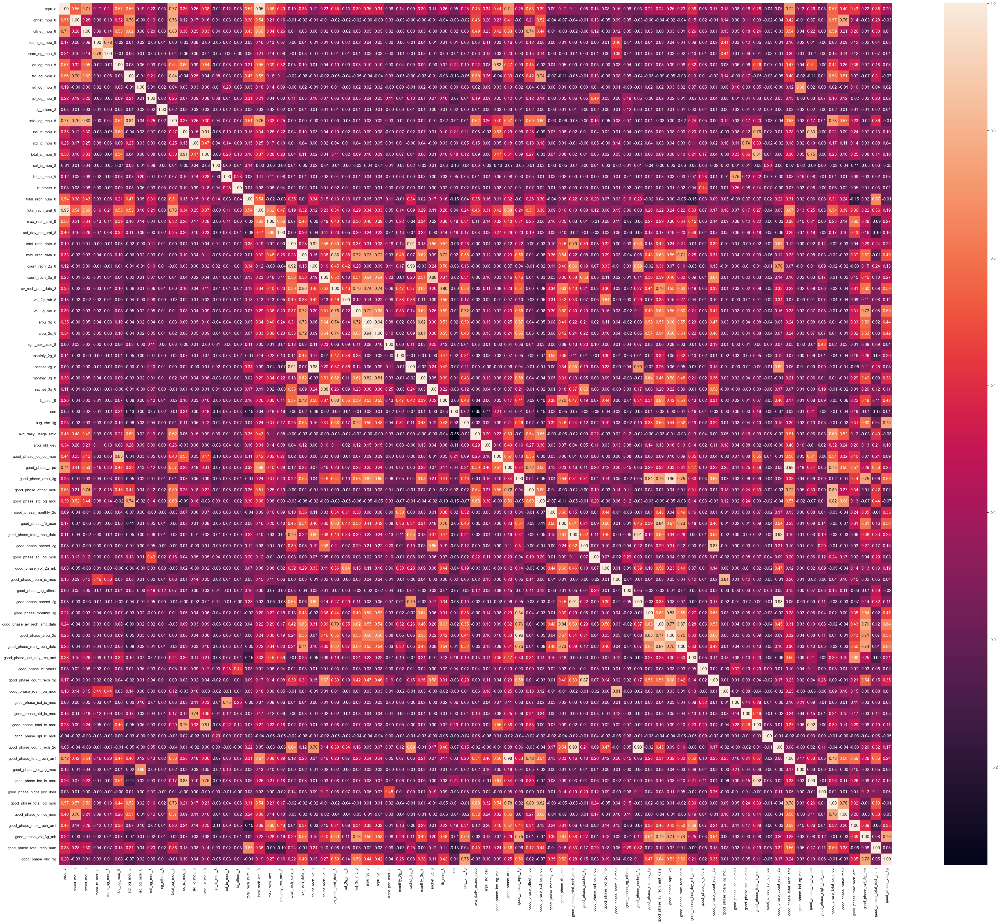

In [74]:
plt.figure(figsize=(60,50))

sns.heatmap(pd.DataFrame(X_train).corr(), annot=True, fmt=".2f")
plt.show()

##### Features containing `total` have very high correlations with other features that constitute it.

In [75]:
corr = X_train.corr()
corr.loc[:, :] = np.tril(corr, -1)
corr = corr.stack()

In [76]:
corr[(corr > 0.80) | (corr < -0.80)]

total_og_mou_8               std_og_mou_8                   0.838680
total_ic_mou_8               loc_ic_mou_8                   0.912107
total_rech_amt_8             arpu_8                         0.951370
count_rech_2g_8              total_rech_data_8              0.919176
av_rech_amt_data_8           max_rech_data_8                0.860095
arpu_2g_8                    arpu_3g_8                      0.941308
sachet_2g_8                  total_rech_data_8              0.907314
                             count_rech_2g_8                0.983629
monthly_3g_8                 arpu_3g_8                      0.820625
                             arpu_2g_8                      0.814279
sachet_3g_8                  count_rech_3g_8                0.881086
fb_user_8                    av_rech_amt_data_8             0.802609
good_phase_loc_og_mou        loc_og_mou_8                   0.833017
good_phase_sachet_2g         good_phase_total_rech_data     0.912063
good_phase_monthly_3g        good_

In [77]:
columns_having_very_high_correlations = [
    'total_ic_mou_8', 'good_phase_total_ic_mou', 
    'total_og_mou_8', 'good_phase_total_og_mou',
    'total_rech_amt_8', 'good_phase_total_rech_amt',
    'good_phase_count_rech_2g', 'good_phase_av_rech_amt_data'
]

##### Though these columns have high correlations but business logic says that these features are important so we will be conservative and and not remove them as of now.

In [78]:
final_vars = X_train.columns

### 6.4 FEATURE SCALING

In [79]:
from scipy.stats import skew

skewness = skew(X_train)
print(f"Skewness: {skewness}")

Skewness: [ 1.68700248  2.93779439  2.30114813  6.04341388  5.38275639  2.37925282
  2.60473224 15.535008    3.50485241 29.80674766  2.10111573  2.14188135
  3.72031867  2.07122674  3.2860851   6.05505121  8.00078083  1.66386257
  1.66051989  1.54835939  1.71877667  6.92299668  4.03852862  5.91278736
 14.17024456  2.35633646  3.92003249  3.58414006  3.75743276  3.60182855
 13.3284471   4.09963808  6.21618718  6.88558207 20.00658864  1.25784487
  0.94564692  3.56729385  3.93392352  2.24104271  2.35661898  1.70831201
  3.84399371  2.26558135  2.51296927  3.73601956  1.25718618  6.64710924
 19.80554072  3.68266929  3.67647429  5.27087691  5.91452251  6.46304269
  7.32438355  2.26450261  3.67327795  4.24221166  1.68436522  7.71116649
 13.21199504  4.58722461  6.23700077  3.71462076  2.07115411  2.46586762
  6.13639465  1.70615049 15.01735311  2.12789555 11.95457945  2.05539625
  2.7977129   1.75699703  3.5755682   1.71316855  3.56657243]


##### All the columns have high positive Skewness.

In [80]:
scaler = StandardScaler()

X_train_scaled = pd.DataFrame(scaler.fit_transform(X_train), columns=X_train.columns, index=X_train.index)
X_test_scaled = pd.DataFrame(scaler.transform(X_test[final_vars]), columns=X_test[final_vars].columns, index=X_test[final_vars].index)
unseen_scaled = pd.DataFrame(scaler.transform(unseen[final_vars]), columns=unseen[final_vars].columns, index=unseen[final_vars].index)

In [81]:
pd.DataFrame(X_train_scaled).head(2)

,arpu_8,onnet_mou_8,offnet_mou_8,roam_ic_mou_8,roam_og_mou_8,loc_og_mou_8,std_og_mou_8,isd_og_mou_8,spl_og_mou_8,og_others_8,total_og_mou_8,loc_ic_mou_8,std_ic_mou_8,total_ic_mou_8,spl_ic_mou_8,isd_ic_mou_8,ic_others_8,total_rech_num_8,total_rech_amt_8,max_rech_amt_8,last_day_rch_amt_8,total_rech_data_8,max_rech_data_8,count_rech_2g_8,count_rech_3g_8,av_rech_amt_data_8,vol_2g_mb_8,vol_3g_mb_8,arpu_3g_8,arpu_2g_8,night_pck_user_8,monthly_2g_8,sachet_2g_8,monthly_3g_8,sachet_3g_8,fb_user_8,aon,aug_vbc_3g,avg_daily_usage_ratio,arpu_std_dev,good_phase_loc_og_mou,good_phase_arpu,good_phase_arpu_3g,good_phase_offnet_mou,good_phase_std_og_mou,good_phase_monthly_2g,good_phase_fb_user,good_phase_total_rech_data,good_phase_sachet_3g,good_phase_spl_og_mou,good_phase_vol_2g_mb,good_phase_roam_ic_mou,good_phase_og_others,good_phase_sachet_2g,good_phase_monthly_3g,good_phase_av_rech_amt_data,good_phase_arpu_2g,good_phase_max_rech_data,good_phase_last_day_rch_amt,good_phase_ic_others,good_phase_count_rech_3g,good_phase_roam_og_mou,good_phase_isd_ic_mou,good_phase_std_ic_mou,good_phase_total_ic_mou,good_phase_spl_ic_mou,good_phase_count_rech_2g,good_phase_total_rech_amt,good_phase_isd_og_mou,good_phase_loc_ic_mou,good_phase_night_pck_user,good_phase_total_og_mou,good_phase_onnet_mou,good_phase_max_rech_amt,good_phase_vol_3g_mb,good_phase_total_rech_num,good_phase_vbc_3g
id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
47338,-0.096549,-0.303695,0.394726,-0.221949,-0.240252,1.098947,-0.495271,-0.086827,-0.437795,-0.042957,0.074836,0.252334,-0.467167,0.075332,-0.318327,0.141921,-0.197769,-0.813427,0.267150,3.095210,4.008633,-0.353792,-0.41817,-0.319411,-0.211766,-0.467703,-0.309166,-0.324952,-0.293113,-0.30762,-0.07461,-0.269515,-0.274874,-0.218631,-0.125926,-0.552409,-0.866661,-0.32063,0.102696,-0.569997,0.176247,-0.463319,-0.313046,-0.166091,-0.539002,-0.308701,-0.601035,-0.379648,-0.141345,-0.375273,-0.346705,-0.282839,-0.288934,-0.28558,-0.233729,-0.506653,-0.334718,-0.452302,-0.992698,-0.233411,-0.234753,-0.313318,2.757955,-0.506185,-0.216987,-0.459939,-0.336218,-1.105375,-0.099294,-0.407969,-0.093065,-0.377933,-0.495956,-1.268827,-0.339462,-0.447254,-0.330255
67455,-0.839643,-0.506709,-0.608513,-0.221949,-0.240252,-0.512215,-0.495271,-0.086827,-0.208943,-0.042957,-0.657551,0.382073,-0.467167,0.144250,-0.318327,-0.223219,-0.197769,-0.651288,-0.765704,-0.767126,-0.376560,-0.353792,-0.41817,-0.319411,-0.211766,-0.467703,-0.309166,-0.324952,-0.293113,-0.30762,-0.07461,-0.269515,-0.274874,-0.218631,-0.125926,-0.552409,-0.740366,-0.32063,-0.409070,-0.461804,-0.339961,-0.696982,-0.313046,-0.453313,-0.519129,-0.308701,-0.601035,-0.379648,-0.141345,1.057549,-0.346705,-0.282839,-0.288934,-0.28558,-0.233729,-0.506653,-0.334718,-0.452302,-0.847214,-0.233411,-0.234753,-0.313318,-0.233494,-0.199892,1.548882,-0.459939,-0.336218,-0.700393,-0.099294,1.970045,-0.093065,-0.579244,-0.532678,-0.887374,-0.339462,0.102039,-0.330255


### 6.5 DIMENSIONALITY REDUCTION WITH PCA

In [82]:
pca = PCA(random_state=42)
pca.fit(X_train_scaled)

PCA(random_state=42)

In [83]:
# Principal components
pd.DataFrame(pca.components_)

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76
0,1.752861e-01,6.199535e-02,9.422919e-02,2.878858e-02,2.929623e-02,1.015673e-01,4.877032e-02,2.198442e-02,3.939227e-02,7.275901e-03,9.485569e-02,8.234761e-02,4.829734e-02,8.938748e-02,-1.649962e-02,2.815385e-02,1.968603e-02,7.652360e-02,1.708281e-01,1.455942e-01,9.696777e-02,0.133556,1.865397e-01,0.089452,0.145187,2.045675e-01,8.945115e-02,1.866644e-01,1.858318e-01,1.844158e-01,3.477904e-02,0.076250,0.076838,0.155933,0.083008,1.751789e-01,7.441467e-03,1.576984e-01,6.285250e-02,7.466907e-02,9.880224e-02,1.744019e-01,1.886100e-01,9.312455e-02,4.627830e-02,0.084002,1.770214e-01,0.132580,0.085760,3.973360e-02,9.454904e-02,3.144923e-02,1.302508e-02,0.073008,0.157521,2.076160e-01,1.890236e-01,1.888645e-01,1.143228e-01,2.479446e-02,0.150241,2.959308e-02,2.679991e-02,4.692083e-02,8.528211e-02,-1.450396e-02,0.086856,1.731208e-01,2.367798e-02,7.864562e-02,3.586395e-02,9.402994e-02,6.042488e-02,1.532585e-01,1.867589e-01,8.568127e-02,1.586506e-01
1,1.806997e-01,1.912988e-01,2.143513e-01,3.855647e-02,5.240249e-02,1.571889e-01,2.011589e-01,2.595275e-02,5.539633e-02,8.331613e-03,2.497231e-01,1.025495e-01,8.808270e-02,1.180539e-01,3.550487e-03,3.270040e-02,2.973196e-02,1.098687e-01,1.766335e-01,6.251663e-02,6.136279e-02,-0.103288,-1.025049e-01,-0.079830,-0.089957,-1.243536e-01,-7.609969e-02,-1.062644e-01,-8.931193e-02,-9.153474e-02,-1.582433e-02,-0.053819,-0.071175,-0.070995,-0.065542,-1.222806e-01,1.182172e-02,-8.580016e-02,1.936228e-01,8.048375e-02,1.539713e-01,1.868065e-01,-9.387440e-02,2.177847e-01,2.040610e-01,-0.059194,-1.332521e-01,-0.114921,-0.066580,5.401860e-02,-8.509608e-02,4.635886e-02,4.178933e-02,-0.082643,-0.074752,-1.328468e-01,-9.713356e-02,-1.086716e-01,7.269895e-02,3.146420e-02,-0.093016,6.051851e-02,3.014790e-02,8.802668e-02,1.138415e-01,5.624764e-03,-0.091946,1.886548e-01,2.326200e-02,9.801273e-02,-2.276400e-02,2.542333e-01,1.931433e-01,5.820832e-02,-1.119236e-01,1.175581e-01,-9.064318e-02
2,1.344577e-02,6.671763e-02,2.635034e-02,-1.791050e-02,-8.329415e-03,-5.719299e-02,1.056459e-01,-2.215672e-02,9.153830e-02,1.579268e-03,6.256103e-02,-7.203252e-02,-1.319717e-02,-7.188149e-02,4.682086e-02,-3.331818e-02,-1.366774e-02,2.168611e-01,1.213683e-02,-1.399353e-01,-1.279756e-01,0.265345,-1.025128e-01,0.297690,0.036971,6.510853e-03,1.224346e-01,-7.096283e-02,-1.127575e-01,-9.663410e-02,7.174892e-02,-0.010712,0.304082,-0.139474,0.119816,6.961102e-02,-1.056183e-01,-7.105494e-02,9.292296e-02,1.461617e-02,-6.154462e-02,8.821606e-03,-1.217893e-01,2.211585e-02,1.048317e-01,-0.020251,6.589630e-02,0.261266,0.116134,9.493770e-02,1.217935e-01,-1.809023e-02,7.135281e-02,0.300386,-0.145333,-5.382854e-03,-1.059745e-01,-1.119982e-01,-1.401618e-01,-1.575043e-02,0.025236,-5.931563e-03,-3.689455e-02,-1.640205e-02,-7.672838e-02,1.670126e-02,0.292403,9.810374e-03,-2.510691e-02,-7.607565e-02,7.375506e-02,5.760771e-02,6.244490e-02,-1.593069e-01,-7.865117e-02,2.084466e-01,-7.940361e-02
3,-2.731234e-02,-1.145056e-01,-5.231865e-03,-6.709326e-02,-9.187187e-02,2.042896e-01,-2.059360e-01,3.123541e-02,-3.228688e-02,1.065952e-02,-6.874201e-02,3.272197e-01,5.772094e-02,3.206283e-01,-3.862792e-02,1.144319e-01,8.593328e-02,-3.798876e-02,-2.541990e-02,3.498760e-02,4.779303e-02,0.062715,-2.329785e-02,0.121848,-0.099190,4.454968e-03,8.336139e-02,-5.641128e-02,-1.067202e-01,-1.014943e-01,-3.239732e-02,0.092459,0.106751,-0.111151,-0.054167,5.562440e-02,1.513094e-01,-8.037206e-03,-1.381941e-01,-1.289266e-01,2.098145e-01,-3.010237e-02,-1.111972e-01,-2.638324e-03,-2.139054e-01,0.092448,5.754880e-02,0.068876,-0.053995,-2.926095e-02,9.080581e-02,-7.058245e-02,-6.243256e-03,0.112229,-0.119833,2.180298e-03,-1.053231e-01,-2.726536e-02,2.538000e-02,9.199335e-02,-0.104857,-1.052506e-01,1.181009e-01,6.086796e-02,3.254548e-01,1.945378e-02,0.127003,-3.221091e-02

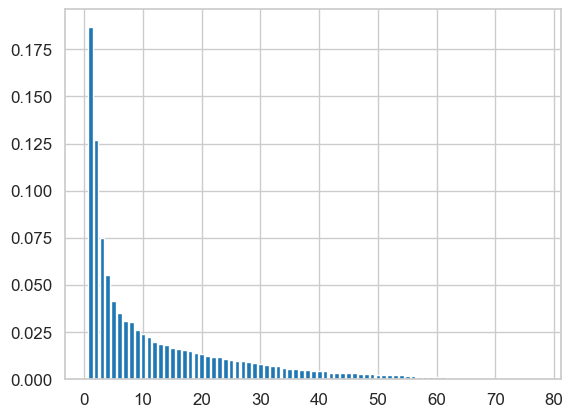

In [84]:
plt.bar(range(1,len(pca.explained_variance_ratio_)+1), pca.explained_variance_ratio_)
plt.show()

#### SCREE PLOT

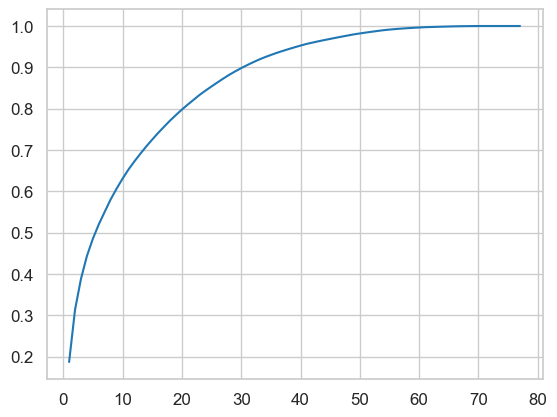

In [85]:
var_cumu = np.cumsum(pca.explained_variance_ratio_)
plt.plot(range(1,len(var_cumu)+1), var_cumu)
plt.show()

#### PCA WITH 60 COMPONENTS

In [86]:
pca_final = PCA(n_components=60, random_state=42)
X_train_pca = pca_final.fit_transform(X_train_scaled)
X_test_pca = pca_final.transform(X_test_scaled)
unseen_pca = pca_final.transform(unseen_scaled)

In [87]:
X_train_pca.shape, X_test_pca.shape, unseen_pca.shape

((55999, 60), (14000, 60), (30000, 60))

#### PLOTTING THE DATA

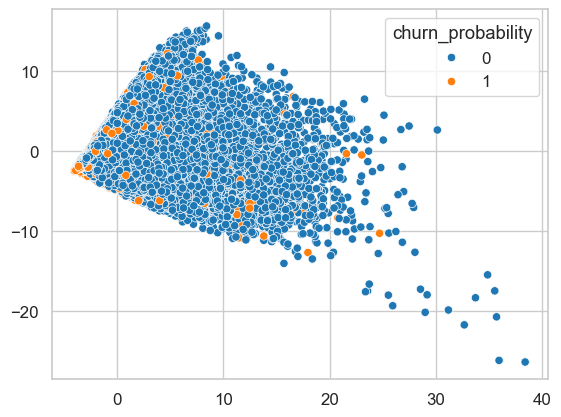

In [88]:
sns.scatterplot(x=X_train_pca[:,0], y=X_train_pca[:,1], hue=y_train)
plt.show()

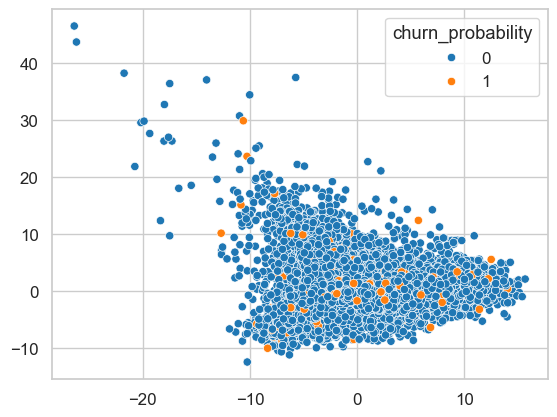

In [89]:
sns.scatterplot(x=X_train_pca[:,1], y=X_train_pca[:,2], hue=y_train)
plt.show()

#### FEATURE IMPORTANCE OF COMPONENTS

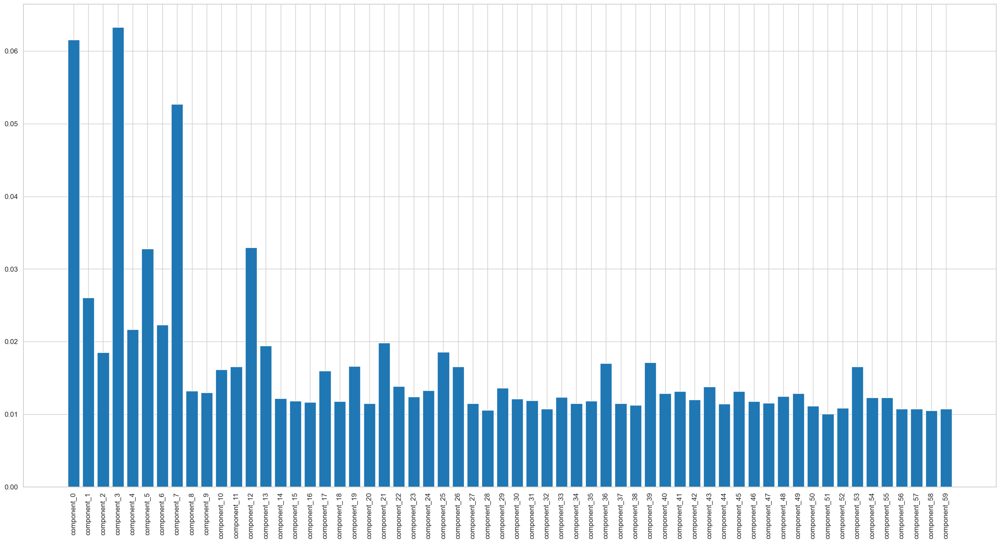

In [90]:
rf = RandomForestClassifier(n_estimators=100, n_jobs=-1)
rf.fit(X_train_pca, y_train)

feature_importances = pd.DataFrame({'col':['component_'+str(i) for i in range(60)], 
                                    'importance':rf.feature_importances_})

plt.figure(figsize=(30,15))
plt.xticks(rotation=90, ha='center')
plt.bar(feature_importances['col'], feature_importances['importance'])
plt.show()

# STEP #7 - MODEL SELECTION, MODEL BUILDING & MODEL EVALUATION

In [91]:
train_accuracies = []
test_accuracies = []

## 7.1 LOGISTIC REGRESSION

### 7.1.1 LOGISTIC REGRESSION WITHOUT PCA

For logistic regression we will be using `X_train_scaled` so that we can use RFE for feature selection instead of PCA.

#### BUILDING THE FIRST MODEL USING STATSMODELS

In [92]:
import statsmodels.api as sm

In [93]:
X_train_sm = sm.add_constant(X_train_scaled)
logm1 = sm.GLM(y_train, X_train_sm, family=sm.families.Binomial())
result = logm1.fit()

In [94]:
result.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:      churn_probability   No. Observations:                55999
Model:                            GLM   Df Residuals:                    55927
Model Family:                Binomial   Df Model:                           71
Link Function:                  Logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -11771.
Date:                Wed, 20 Nov 2024   Deviance:                       23543.
Time:                        09:37:25   Pearson chi2:                 8.07e+06
No. Iterations:                   100   Pseudo R-squ. (CS):             0.2121
Covariance Type:            nonrobust                                         
===============================================================================================
                                  coef    std err          z      P>|z|      [0.025      0.975]
-----------------------------------------------------------------------------------------------
const                          -4.0619      0.047    -87.202      0.000      -4.153      -3.971
arpu_8                          0.0766      0.076      1.005      0.315      -0.073       0.226
onnet_mou_8                    -0.4613      0.090     -5.150      0.000      -0.637      -0.286
offnet_mou_8                   -0.4979      0.099     -5.010      0.000      -0.693      -0.303
roam_ic_mou_8                   0.0159      0.022      0.708      0.479      -0.028       0.060
roam_og_mou_8                   0.2545      0.025     10.123      0.000       0.205       0.304
loc_og_mou_8                    0.0214      0.161      0.133      0.894      -0.294       0.336
std_og_mou_8                    0.5373      0.270      1.986      0.047       0.007       1.067
isd_og_mou_8                    0.0194      0.025      0.761      0.447      -0.031       0.069
spl_og_mou_8                   -0.0880      0.031     -2.809      0.005      -0.149      -0.027
og_others_8                    -0.1094      0.093     -1.174      0.240      -0.292       0.073
total_og_mou_8                 -0.1748      0.283     -0.617      0.537      -0.730       0.380
loc_ic_mou_8                   -2.0609      0.164    -12.602      0.000      -2.381      -1.740
std_ic_mou_8                   -0.3923      0.066     -5.943      0.000      -0.522      -0.263
total_ic_mou_8                  0.0637      0.168      0.380      0.704      -0.265       0.393
spl_ic_mou_8                   -0.7647      0.050    -15.259      0.000      -0.863      -0.666
isd_ic_mou_8                   -0.0386      0.043     -0.889      0.374      -0.124       0.047
ic_others_8                    -0.0732      0.033     -2.219      0.026      -0.138      -0.009
total_rech_num_8               -0.8282      0.045    -18.400      0.000      -0.916      -0.740
total_rech_amt_8                0.4690      0.086      5.435      0.000       0.300       0.638
max_rech_amt_8                 -0.3753      0.040     -9.424      0.000      -0.453      -0.297
last_day_rch_amt_8             -0.5326      0.035    -15.258      0.000      -0.601      -0.464
total_rech_data_8              -0.0087      0.021     -0.405      0.686      -0.051       0.033
max_rech_data_8                 0.0860      0.063      1.373      0.170      -0.037       0.209
count_rech_2g_8                 0.0096      0.023      0.411      0.681      -0.036       0.056
count_rech_3g_8                -0.0418      0.031     -1.355      0.175      -0.102       0.019
av_rech_amt_data_8             -0.2920      0.114     -2.569      0.010      -0.515      -0.069
vol_2g_mb_8                    -0.1682      0.045     -3.733      0.000      -0.256      -0.080
vol_3g_mb_8                    -0.0916      0.060     -1.531      0.126      -0.209       0.026
arpu_3g_8  

##### Some features like `loc_og_mou_8`, `isd_og_mou_8`, `isd_ic_mou_8`, `avg_daily_usage_ratio`, `good_phase_std_ic_mou` etc. have very high p-values implying that these features are not significant. We will be performing Feature Selection using RFE and then perform Coarse Tuning using manual feature elimination (i.e. based on the p-values and VIFs).

#### AUTOMATIC FEATURE SELECTION USING RFE

In [95]:
logreg = LogisticRegression(random_state=42)

In [96]:
%%time
rfe = RFE(logreg, n_features_to_select=25)
rfe = rfe.fit(X_train_scaled, y_train)

CPU times: total: 1min 6s
Wall time: 25.9 s


In [97]:
pd.DataFrame({
    'Feature': pd.DataFrame(X_train_scaled).columns,
    'Selected': rfe.support_,
    'Ranking': rfe.ranking_
}).sort_values(by='Ranking')

,Feature,Selected,Ranking
20,last_day_rch_amt_8,True,1
39,arpu_std_dev,True,1
37,aug_vbc_3g,True,1
36,aon,True,1
35,fb_user_8,True,1
43,good_phase_offnet_mou,True,1
28,arpu_3g_8,True,1
25,av_rech_amt_data_8,True,1
64,good_phase_total_ic_mou,True,1
67,good_phase_total_rech_amt,True,1


In [98]:
selected_features = pd.DataFrame(X_train_scaled).columns[rfe.support_]
selected_features

Index(['onnet_mou_8', 'offnet_mou_8', 'roam_og_mou_8', 'std_og_mou_8',
       'loc_ic_mou_8', 'std_ic_mou_8', 'spl_ic_mou_8', 'total_rech_num_8',
       'total_rech_amt_8', 'max_rech_amt_8', 'last_day_rch_amt_8',
       'av_rech_amt_data_8', 'arpu_3g_8', 'fb_user_8', 'aon', 'aug_vbc_3g',
       'arpu_std_dev', 'good_phase_loc_og_mou', 'good_phase_arpu',
       'good_phase_offnet_mou', 'good_phase_total_ic_mou',
       'good_phase_total_rech_amt', 'good_phase_total_og_mou',
       'good_phase_onnet_mou', 'good_phase_max_rech_amt'],
      dtype='object')

#### BUILDING MODEL WITH FEATURES SELECTED BY RFE

In [99]:
X_train_sm = sm.add_constant(X_train_scaled[selected_features])
logm2 = sm.GLM(y_train, X_train_sm, family=sm.families.Binomial())
result = logm2.fit()

In [100]:
result.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:      churn_probability   No. Observations:                55999
Model:                            GLM   Df Residuals:                    55973
Model Family:                Binomial   Df Model:                           25
Link Function:                  Logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -11848.
Date:                Wed, 20 Nov 2024   Deviance:                       23696.
Time:                        09:37:53   Pearson chi2:                 1.18e+07
No. Iterations:                     8   Pseudo R-squ. (CS):             0.2099
Covariance Type:            nonrobust                                         
=============================================================================================
                                coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------------------
const                        -4.0581      0.046    -88.505      0.000      -4.148      -3.968
onnet_mou_8                  -0.5035      0.069     -7.274      0.000      -0.639      -0.368
offnet_mou_8                 -0.5451      0.073     -7.457      0.000      -0.688      -0.402
roam_og_mou_8                 0.2876      0.017     16.576      0.000       0.254       0.322
std_og_mou_8                  0.4581      0.085      5.373      0.000       0.291       0.625
loc_ic_mou_8                 -2.0559      0.077    -26.606      0.000      -2.207      -1.904
std_ic_mou_8                 -0.3852      0.036    -10.607      0.000      -0.456      -0.314
spl_ic_mou_8                 -0.7948      0.051    -15.640      0.000      -0.894      -0.695
total_rech_num_8             -0.8422      0.040    -20.866      0.000      -0.921      -0.763
total_rech_amt_8              0.5056      0.063      8.009      0.000       0.382       0.629
max_rech_amt_8               -0.3642      0.038     -9.708      0.000      -0.438      -0.291
last_day_rch_amt_8           -0.5515      0.035    -15.876      0.000      -0.620      -0.483
av_rech_amt_data_8           -0.3164      0.064     -4.910      0.000      -0.443      -0.190
arpu_3g_8                     0.2836      0.044      6.386      0.000       0.197       0.371
fb_user_8                    -0.2625      0.040     -6.538      0.000      -0.341      -0.184
aon                          -0.3310      0.022    -15.081      0.000      -0.374      -0.288
aug_vbc_3g                   -0.1680      0.035     -4.771      0.000      -0.237      -0.099
arpu_std_dev                  0.4146      0.020     20.534      0.000       0.375       0.454
good_phase_loc_og_mou        -0.2016      0.042     -4.839      0.000      -0.283      -0.120
good_phase_arpu               0.2857      0.091      3.145      0.002       0.108       0.464
good_phase_offnet_mou         0.2619      0.063      4.164      0.000       0.139       0.385
good_phase_total_ic_mou       0.3296      0.034      9.720      0.000       0.263       0.396
good_phase_total_rech_amt    -0.1534      0.093     -1.652      0.099      -0.335       0.029
good_phase_total_og_mou      -0.4254      0.083     -5.114      0.000      -0.588      -0.262
good_phase_onnet_mou          0.2496      0.056      4.486      0.000       0.141       0.359
good_phase_max_rech_amt      -0.1634      0.030     -5.478      0.000      -0.222      -0.105
=============================================================================================
"""

##### Some Features have a very high p-value and hence are not significant.  

In [101]:
# Getting Predictions on the train set
y_train_pred = result.predict(X_train_sm).values.reshape(-1)
y_train_pred_final = pd.DataFrame({'Actual_Churn':y_train.values, 'Predicted_Churn_Prob':y_train_pred})
y_train_pred_final['Predicted_Churn'] = y_train_pred_final.Predicted_Churn_Prob.map(lambda x: 1 if x > 0.5 else 0)
y_train_pred_final.head()

,Actual_Churn,Predicted_Churn_Prob,Predicted_Churn
0,0,0.001393,0
1,0,0.073980,0
2,0,0.311013,0
3,0,0.161090,0
4,1,0.562342,1


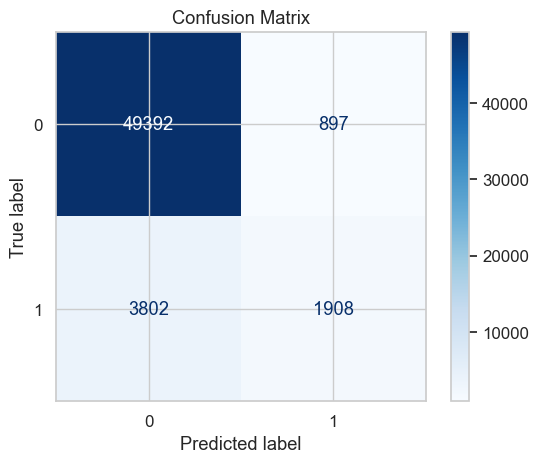


Accuracy : 0.9160877872819158


In [102]:
# Confusion matrix 
confusion = confusion_matrix(y_train_pred_final.Actual_Churn, y_train_pred_final.Predicted_Churn )

# Plot confusion matrix
disp = ConfusionMatrixDisplay(confusion_matrix=confusion)
disp.plot(cmap='Blues')
plt.title("Confusion Matrix")
plt.show()

print()
# Overall accuracy.
print(f'Accuracy : {accuracy_score(y_train_pred_final.Actual_Churn, y_train_pred_final.Predicted_Churn)}')

In [103]:
# Classification report
print(classification_report(y_train_pred_final.Actual_Churn, y_train_pred_final.Predicted_Churn))

              precision    recall  f1-score   support

           0       0.93      0.98      0.95     50289
           1       0.68      0.33      0.45      5710

    accuracy                           0.92     55999
   macro avg       0.80      0.66      0.70     55999
weighted avg       0.90      0.92      0.90     55999



In [104]:
p_values = result.pvalues
selected_features = selected_features.drop([feature for feature in selected_features if p_values.get(feature, 1) > 0.05])
selected_features

Index(['onnet_mou_8', 'offnet_mou_8', 'roam_og_mou_8', 'std_og_mou_8',
       'loc_ic_mou_8', 'std_ic_mou_8', 'spl_ic_mou_8', 'total_rech_num_8',
       'total_rech_amt_8', 'max_rech_amt_8', 'last_day_rch_amt_8',
       'av_rech_amt_data_8', 'arpu_3g_8', 'fb_user_8', 'aon', 'aug_vbc_3g',
       'arpu_std_dev', 'good_phase_loc_og_mou', 'good_phase_arpu',
       'good_phase_offnet_mou', 'good_phase_total_ic_mou',
       'good_phase_total_og_mou', 'good_phase_onnet_mou',
       'good_phase_max_rech_amt'],
      dtype='object')

#### BUILDING MODEL AFTER ELIMINATING FEATURES WITH P-VALUES GREATER THAN 0.05

In [105]:
X_train_sm = sm.add_constant(X_train_scaled[selected_features])
logm3 = sm.GLM(y_train, X_train_sm, family=sm.families.Binomial())
result = logm3.fit()

In [106]:
result.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:      churn_probability   No. Observations:                55999
Model:                            GLM   Df Residuals:                    55974
Model Family:                Binomial   Df Model:                           24
Link Function:                  Logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -11849.
Date:                Wed, 20 Nov 2024   Deviance:                       23699.
Time:                        09:37:54   Pearson chi2:                 1.22e+07
No. Iterations:                     8   Pseudo R-squ. (CS):             0.2099
Covariance Type:            nonrobust                                         
===========================================================================================
                              coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------------------
const                      -4.0622      0.046    -88.627      0.000      -4.152      -3.972
onnet_mou_8                -0.5095      0.069     -7.364      0.000      -0.645      -0.374
offnet_mou_8               -0.5522      0.073     -7.559      0.000      -0.695      -0.409
roam_og_mou_8               0.2860      0.017     16.504      0.000       0.252       0.320
std_og_mou_8                0.4646      0.085      5.449      0.000       0.297       0.632
loc_ic_mou_8               -2.0604      0.077    -26.656      0.000      -2.212      -1.909
std_ic_mou_8               -0.3839      0.036    -10.578      0.000      -0.455      -0.313
spl_ic_mou_8               -0.7955      0.051    -15.648      0.000      -0.895      -0.696
total_rech_num_8           -0.8476      0.040    -21.045      0.000      -0.927      -0.769
total_rech_amt_8            0.5054      0.063      8.009      0.000       0.382       0.629
max_rech_amt_8             -0.3572      0.037     -9.583      0.000      -0.430      -0.284
last_day_rch_amt_8         -0.5531      0.035    -15.911      0.000      -0.621      -0.485
av_rech_amt_data_8         -0.3178      0.065     -4.927      0.000      -0.444      -0.191
arpu_3g_8                   0.2835      0.044      6.380      0.000       0.196       0.371
fb_user_8                  -0.2639      0.040     -6.574      0.000      -0.343      -0.185
aon                        -0.3286      0.022    -15.012      0.000      -0.371      -0.286
aug_vbc_3g                 -0.1667      0.035     -4.739      0.000      -0.236      -0.098
arpu_std_dev                0.4136      0.020     20.529      0.000       0.374       0.453
good_phase_loc_og_mou      -0.1998      0.042     -4.794      0.000      -0.282      -0.118
good_phase_arpu             0.1587      0.048      3.289      0.001       0.064       0.253
good_phase_offnet_mou       0.2583      0.063      4.111      0.000       0.135       0.382
good_phase_total_ic_mou     0.3287      0.034      9.692      0.000       0.262       0.395
good_phase_total_og_mou    -0.4332      0.083     -5.215      0.000      -0.596      -0.270
good_phase_onnet_mou        0.2464      0.056      4.431      0.000       0.137       0.355
good_phase_max_rech_amt    -0.1813      0.028     -6.525      0.000      -0.236      -0.127
===========================================================================================
"""

##### Now, the p-values of all the features is less than 0.05 and hence the above features are significant.

In [107]:
# Getting Predictions on the train set
y_train_pred = result.predict(X_train_sm).values.reshape(-1)
y_train_pred_final = pd.DataFrame({'Actual_Churn':y_train.values, 'Predicted_Churn_Prob':y_train_pred})
y_train_pred_final['Predicted_Churn'] = y_train_pred_final.Predicted_Churn_Prob.map(lambda x: 1 if x > 0.5 else 0)
y_train_pred_final.head()

,Actual_Churn,Predicted_Churn_Prob,Predicted_Churn
0,0,0.001296,0
1,0,0.073973,0
2,0,0.312381,0
3,0,0.161782,0
4,1,0.566922,1


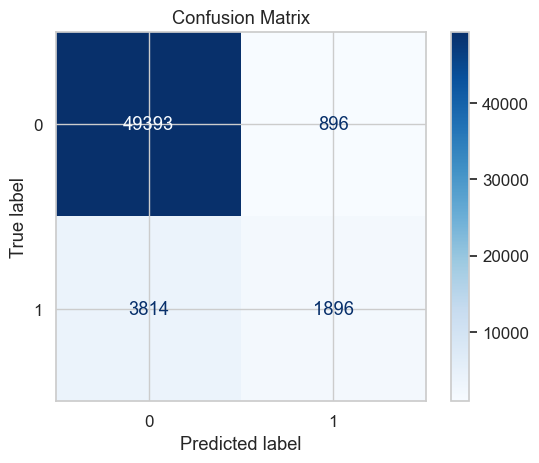


Accuracy : 0.9158913552027714


In [108]:
# Confusion matrix 
confusion = confusion_matrix(y_train_pred_final.Actual_Churn, y_train_pred_final.Predicted_Churn )

# Plot confusion matrix
disp = ConfusionMatrixDisplay(confusion_matrix=confusion)
disp.plot(cmap='Blues')
plt.title("Confusion Matrix")
plt.show()

print()
# Overall accuracy.
print(f'Accuracy : {accuracy_score(y_train_pred_final.Actual_Churn, y_train_pred_final.Predicted_Churn)}')

In [109]:
# Classification report
print(classification_report(y_train_pred_final.Actual_Churn, y_train_pred_final.Predicted_Churn))

              precision    recall  f1-score   support

           0       0.93      0.98      0.95     50289
           1       0.68      0.33      0.45      5710

    accuracy                           0.92     55999
   macro avg       0.80      0.66      0.70     55999
weighted avg       0.90      0.92      0.90     55999



##### Checking for the Mulitcollinearity in the features using VIFs.

In [110]:
from statsmodels.stats.outliers_influence import variance_inflation_factor

vif = pd.DataFrame()
vif['Features'] = X_train_scaled[selected_features].columns
vif['VIF'] = [variance_inflation_factor(X_train_scaled[selected_features].values, i) for i in range(X_train_scaled[selected_features].shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
21,good_phase_total_og_mou,24.25
19,good_phase_offnet_mou,14.32
22,good_phase_onnet_mou,11.53
3,std_og_mou_8,8.97
8,total_rech_amt_8,8.66
1,offnet_mou_8,7.16
18,good_phase_arpu,6.94
0,onnet_mou_8,6.53
11,av_rech_amt_data_8,5.09
17,good_phase_loc_og_mou,4.53


In [111]:
# Dropping the feature that has VIF more than 5
selected_features = selected_features.drop(vif[vif['VIF'] >= 10]['Features'].tolist())
features_with_vif_over_5 = vif[(vif['VIF'] < 10)&(vif['VIF'] > 5)]['Features'].tolist()
if features_with_vif_over_5:
    selected_features = selected_features.drop(features_with_vif_over_5[0])
selected_features

Index(['onnet_mou_8', 'offnet_mou_8', 'roam_og_mou_8', 'loc_ic_mou_8',
       'std_ic_mou_8', 'spl_ic_mou_8', 'total_rech_num_8', 'total_rech_amt_8',
       'max_rech_amt_8', 'last_day_rch_amt_8', 'av_rech_amt_data_8',
       'arpu_3g_8', 'fb_user_8', 'aon', 'aug_vbc_3g', 'arpu_std_dev',
       'good_phase_loc_og_mou', 'good_phase_arpu', 'good_phase_total_ic_mou',
       'good_phase_max_rech_amt'],
      dtype='object')

#### BUILDING MODEL AFTER ELIMINATING A FEATURE WITH VIF GREATER THAN 5

In [112]:
X_train_sm = sm.add_constant(X_train_scaled[selected_features])
logm4 = sm.GLM(y_train, X_train_sm, family=sm.families.Binomial())
result = logm4.fit()

In [113]:
result.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:      churn_probability   No. Observations:                55999
Model:                            GLM   Df Residuals:                    55978
Model Family:                Binomial   Df Model:                           20
Link Function:                  Logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -11873.
Date:                Wed, 20 Nov 2024   Deviance:                       23745.
Time:                        09:37:58   Pearson chi2:                 1.17e+07
No. Iterations:                     8   Pseudo R-squ. (CS):             0.2092
Covariance Type:            nonrobust                                         
===========================================================================================
                              coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------------------
const                      -4.0381      0.045    -89.014      0.000      -4.127      -3.949
onnet_mou_8                -0.1939      0.032     -6.137      0.000      -0.256      -0.132
offnet_mou_8               -0.2414      0.037     -6.473      0.000      -0.315      -0.168
roam_og_mou_8               0.2535      0.014     18.331      0.000       0.226       0.281
loc_ic_mou_8               -2.1715      0.075    -29.027      0.000      -2.318      -2.025
std_ic_mou_8               -0.3763      0.036    -10.453      0.000      -0.447      -0.306
spl_ic_mou_8               -0.7959      0.051    -15.654      0.000      -0.895      -0.696
total_rech_num_8           -0.8476      0.040    -21.039      0.000      -0.927      -0.769
total_rech_amt_8            0.5001      0.060      8.300      0.000       0.382       0.618
max_rech_amt_8             -0.3680      0.037     -9.950      0.000      -0.441      -0.296
last_day_rch_amt_8         -0.5573      0.035    -16.033      0.000      -0.625      -0.489
av_rech_amt_data_8         -0.3102      0.064     -4.822      0.000      -0.436      -0.184
arpu_3g_8                   0.2828      0.044      6.380      0.000       0.196       0.370
fb_user_8                  -0.2694      0.040     -6.731      0.000      -0.348      -0.191
aon                        -0.3295      0.022    -15.120      0.000      -0.372      -0.287
aug_vbc_3g                 -0.1672      0.035     -4.779      0.000      -0.236      -0.099
arpu_std_dev                0.4120      0.020     20.507      0.000       0.373       0.451
good_phase_loc_og_mou      -0.2837      0.038     -7.485      0.000      -0.358      -0.209
good_phase_arpu             0.1565      0.035      4.514      0.000       0.089       0.224
good_phase_total_ic_mou     0.3422      0.033     10.228      0.000       0.277       0.408
good_phase_max_rech_amt    -0.1754      0.027     -6.569      0.000      -0.228      -0.123
===========================================================================================
"""

##### All features have significant p-values. Checking for the Multicollinearity in the features using VIFs.

In [114]:
# Getting Predictions on the train set
y_train_pred = result.predict(X_train_sm).values.reshape(-1)
y_train_pred_final = pd.DataFrame({'Actual_Churn':y_train.values, 'Predicted_Churn_Prob':y_train_pred})
y_train_pred_final['Predicted_Churn'] = y_train_pred_final.Predicted_Churn_Prob.map(lambda x: 1 if x > 0.5 else 0)
y_train_pred_final.head()

,Actual_Churn,Predicted_Churn_Prob,Predicted_Churn
0,0,0.001557,0
1,0,0.069031,0
2,0,0.315197,0
3,0,0.156911,0
4,1,0.533820,1


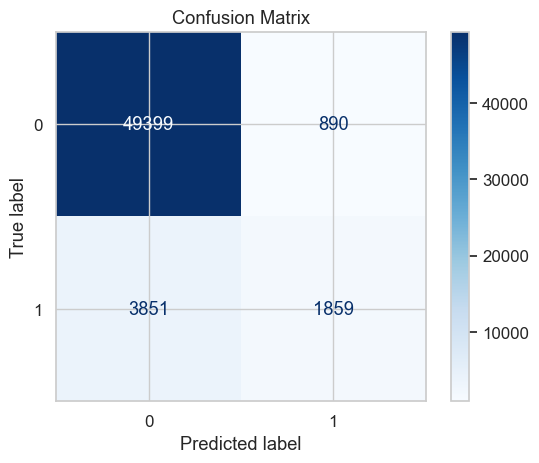


Accuracy : 0.9153377738888194


In [115]:
# Confusion matrix 
confusion = confusion_matrix(y_train_pred_final.Actual_Churn, y_train_pred_final.Predicted_Churn)

# Plot confusion matrix
disp = ConfusionMatrixDisplay(confusion_matrix=confusion)
disp.plot(cmap='Blues')
plt.title("Confusion Matrix")
plt.show()

print()
# Overall accuracy.
print(f'Accuracy : {accuracy_score(y_train_pred_final.Actual_Churn, y_train_pred_final.Predicted_Churn)}')

In [116]:
# Classification report
print(classification_report(y_train_pred_final.Actual_Churn, y_train_pred_final.Predicted_Churn))

              precision    recall  f1-score   support

           0       0.93      0.98      0.95     50289
           1       0.68      0.33      0.44      5710

    accuracy                           0.92     55999
   macro avg       0.80      0.65      0.70     55999
weighted avg       0.90      0.92      0.90     55999



In [117]:
vif = pd.DataFrame()
vif['Features'] = X_train_scaled[selected_features].columns
vif['VIF'] = [variance_inflation_factor(X_train_scaled[selected_features].values, i) for i in range(X_train_scaled[selected_features].shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
7,total_rech_amt_8,7.63
10,av_rech_amt_data_8,5.09
17,good_phase_arpu,3.55
8,max_rech_amt_8,3.46
18,good_phase_total_ic_mou,3.26
12,fb_user_8,2.97
3,loc_ic_mou_8,2.93
1,offnet_mou_8,2.52
19,good_phase_max_rech_amt,2.51
6,total_rech_num_8,2.47


In [118]:
# Dropping the feature that has VIF more than 5
features_with_vif_over_5 = vif[vif['VIF'] > 5]['Features'].tolist()
if features_with_vif_over_5:
    selected_features = selected_features.drop(features_with_vif_over_5[0])
selected_features

Index(['onnet_mou_8', 'offnet_mou_8', 'roam_og_mou_8', 'loc_ic_mou_8',
       'std_ic_mou_8', 'spl_ic_mou_8', 'total_rech_num_8', 'max_rech_amt_8',
       'last_day_rch_amt_8', 'av_rech_amt_data_8', 'arpu_3g_8', 'fb_user_8',
       'aon', 'aug_vbc_3g', 'arpu_std_dev', 'good_phase_loc_og_mou',
       'good_phase_arpu', 'good_phase_total_ic_mou',
       'good_phase_max_rech_amt'],
      dtype='object')

#### BUILDING MODEL AFTER ELIMINATING A FEATURE WITH VIF GREATER THAN 5

In [119]:
X_train_sm = sm.add_constant(X_train_scaled[selected_features])
logm5 = sm.GLM(y_train, X_train_sm, family=sm.families.Binomial())
result = logm5.fit()

In [120]:
result.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:      churn_probability   No. Observations:                55999
Model:                            GLM   Df Residuals:                    55979
Model Family:                Binomial   Df Model:                           19
Link Function:                  Logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -11905.
Date:                Wed, 20 Nov 2024   Deviance:                       23810.
Time:                        09:38:02   Pearson chi2:                 1.34e+07
No. Iterations:                     8   Pseudo R-squ. (CS):             0.2083
Covariance Type:            nonrobust                                         
===========================================================================================
                              coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------------------
const                      -4.0326      0.045    -88.752      0.000      -4.122      -3.944
onnet_mou_8                -0.0887      0.029     -3.015      0.003      -0.146      -0.031
offnet_mou_8               -0.1121      0.034     -3.285      0.001      -0.179      -0.045
roam_og_mou_8               0.2751      0.014     19.962      0.000       0.248       0.302
loc_ic_mou_8               -2.1417      0.075    -28.704      0.000      -2.288      -1.995
std_ic_mou_8               -0.3777      0.036    -10.460      0.000      -0.448      -0.307
spl_ic_mou_8               -0.8006      0.051    -15.759      0.000      -0.900      -0.701
total_rech_num_8           -0.7012      0.036    -19.628      0.000      -0.771      -0.631
max_rech_amt_8             -0.2051      0.031     -6.524      0.000      -0.267      -0.143
last_day_rch_amt_8         -0.4958      0.034    -14.755      0.000      -0.562      -0.430
av_rech_amt_data_8         -0.2810      0.065     -4.342      0.000      -0.408      -0.154
arpu_3g_8                   0.3170      0.045      7.122      0.000       0.230       0.404
fb_user_8                  -0.2832      0.040     -7.055      0.000      -0.362      -0.205
aon                        -0.3262      0.022    -14.983      0.000      -0.369      -0.284
aug_vbc_3g                 -0.1593      0.035     -4.566      0.000      -0.228      -0.091
arpu_std_dev                0.4314      0.021     20.703      0.000       0.391       0.472
good_phase_loc_og_mou      -0.2974      0.038     -7.832      0.000      -0.372      -0.223
good_phase_arpu             0.1744      0.036      4.873      0.000       0.104       0.245
good_phase_total_ic_mou     0.3453      0.034     10.303      0.000       0.280       0.411
good_phase_max_rech_amt    -0.1922      0.027     -7.212      0.000      -0.244      -0.140
===========================================================================================
"""

##### All features have significant p-values. Checking for the Multicollinearity in the features using VIFs.

In [121]:
# Getting Predictions on the train set
y_train_pred = result.predict(X_train_sm).values.reshape(-1)
y_train_pred_final = pd.DataFrame({'Actual_Churn':y_train.values, 'Predicted_Churn_Prob':y_train_pred})
y_train_pred_final['Predicted_Churn'] = y_train_pred_final.Predicted_Churn_Prob.map(lambda x: 1 if x > 0.5 else 0)
y_train_pred_final.head()

,Actual_Churn,Predicted_Churn_Prob,Predicted_Churn
0,0,0.002577,0
1,0,0.069231,0
2,0,0.310977,0
3,0,0.166589,0
4,1,0.518736,1


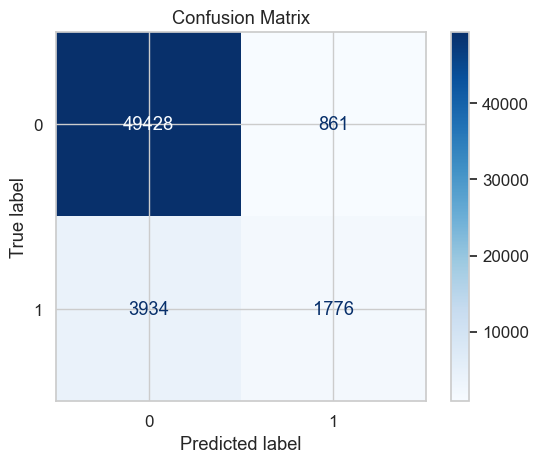


Accuracy : 0.9143734709548385


In [122]:
# Confusion matrix 
confusion = confusion_matrix(y_train_pred_final.Actual_Churn, y_train_pred_final.Predicted_Churn)

# Plot confusion matrix
disp = ConfusionMatrixDisplay(confusion_matrix=confusion)
disp.plot(cmap='Blues')
plt.title("Confusion Matrix")
plt.show()

print()
# Overall accuracy.
print(f'Accuracy : {accuracy_score(y_train_pred_final.Actual_Churn, y_train_pred_final.Predicted_Churn)}')

In [123]:
# Classification report
print(classification_report(y_train_pred_final.Actual_Churn, y_train_pred_final.Predicted_Churn))

              precision    recall  f1-score   support

           0       0.93      0.98      0.95     50289
           1       0.67      0.31      0.43      5710

    accuracy                           0.91     55999
   macro avg       0.80      0.65      0.69     55999
weighted avg       0.90      0.91      0.90     55999



In [124]:
vif = pd.DataFrame()
vif['Features'] = X_train_scaled[selected_features].columns
vif['VIF'] = [variance_inflation_factor(X_train_scaled[selected_features].values, i) for i in range(X_train_scaled[selected_features].shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
9,av_rech_amt_data_8,5.04
17,good_phase_total_ic_mou,3.25
16,good_phase_arpu,3.15
11,fb_user_8,2.97
3,loc_ic_mou_8,2.89
7,max_rech_amt_8,2.67
18,good_phase_max_rech_amt,2.43
10,arpu_3g_8,2.42
15,good_phase_loc_og_mou,2.21
1,offnet_mou_8,1.97


In [125]:
# Dropping the feature that has VIF more than 5
features_with_vif_over_5 = vif[vif['VIF'] > 5]['Features'].tolist()
if features_with_vif_over_5:
    selected_features = selected_features.drop(features_with_vif_over_5[0])
selected_features

Index(['onnet_mou_8', 'offnet_mou_8', 'roam_og_mou_8', 'loc_ic_mou_8',
       'std_ic_mou_8', 'spl_ic_mou_8', 'total_rech_num_8', 'max_rech_amt_8',
       'last_day_rch_amt_8', 'arpu_3g_8', 'fb_user_8', 'aon', 'aug_vbc_3g',
       'arpu_std_dev', 'good_phase_loc_og_mou', 'good_phase_arpu',
       'good_phase_total_ic_mou', 'good_phase_max_rech_amt'],
      dtype='object')

#### BUILDING MODEL AFTER ELIMINATING A FEATURE WITH VIF GREATER THAN 5

In [126]:
X_train_sm = sm.add_constant(X_train_scaled[selected_features])
logm6 = sm.GLM(y_train, X_train_sm, family=sm.families.Binomial())
lr_rfe = result = logm6.fit()

In [127]:
result.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:      churn_probability   No. Observations:                55999
Model:                            GLM   Df Residuals:                    55980
Model Family:                Binomial   Df Model:                           18
Link Function:                  Logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -11915.
Date:                Wed, 20 Nov 2024   Deviance:                       23830.
Time:                        09:38:05   Pearson chi2:                 1.33e+07
No. Iterations:                     8   Pseudo R-squ. (CS):             0.2080
Covariance Type:            nonrobust                                         
===========================================================================================
                              coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------------------
const                      -4.0179      0.045    -89.043      0.000      -4.106      -3.929
onnet_mou_8                -0.0827      0.029     -2.819      0.005      -0.140      -0.025
offnet_mou_8               -0.1052      0.034     -3.091      0.002      -0.172      -0.038
roam_og_mou_8               0.2762      0.014     20.082      0.000       0.249       0.303
loc_ic_mou_8               -2.1356      0.075    -28.656      0.000      -2.282      -1.990
std_ic_mou_8               -0.3761      0.036    -10.418      0.000      -0.447      -0.305
spl_ic_mou_8               -0.8001      0.051    -15.750      0.000      -0.900      -0.701
total_rech_num_8           -0.7100      0.036    -19.928      0.000      -0.780      -0.640
max_rech_amt_8             -0.2213      0.031     -7.086      0.000      -0.283      -0.160
last_day_rch_amt_8         -0.4982      0.034    -14.869      0.000      -0.564      -0.433
arpu_3g_8                   0.1879      0.033      5.780      0.000       0.124       0.252
fb_user_8                  -0.3978      0.032    -12.578      0.000      -0.460      -0.336
aon                        -0.3254      0.022    -14.949      0.000      -0.368      -0.283
aug_vbc_3g                 -0.1799      0.034     -5.236      0.000      -0.247      -0.113
arpu_std_dev                0.4311      0.021     20.713      0.000       0.390       0.472
good_phase_loc_og_mou      -0.2973      0.038     -7.827      0.000      -0.372      -0.223
good_phase_arpu             0.1762      0.036      4.925      0.000       0.106       0.246
good_phase_total_ic_mou     0.3457      0.033     10.321      0.000       0.280       0.411
good_phase_max_rech_amt    -0.1962      0.027     -7.367      0.000      -0.248      -0.144
===========================================================================================
"""

##### All features have significant p-values. Checking for the Multicollinearity in the features using VIFs.

In [128]:
# Getting Predictions on the train set
y_train_pred = result.predict(X_train_sm).values.reshape(-1)
y_train_pred_final = pd.DataFrame({'Actual_Churn':y_train.values, 'Predicted_Churn_Prob':y_train_pred})
y_train_pred_final['Predicted_Churn'] = y_train_pred_final.Predicted_Churn_Prob.map(lambda x: 1 if x > 0.5 else 0)
y_train_pred_final.head()

,Actual_Churn,Predicted_Churn_Prob,Predicted_Churn
0,0,0.002436,0
1,0,0.069652,0
2,0,0.310677,0
3,0,0.166105,0
4,1,0.519645,1


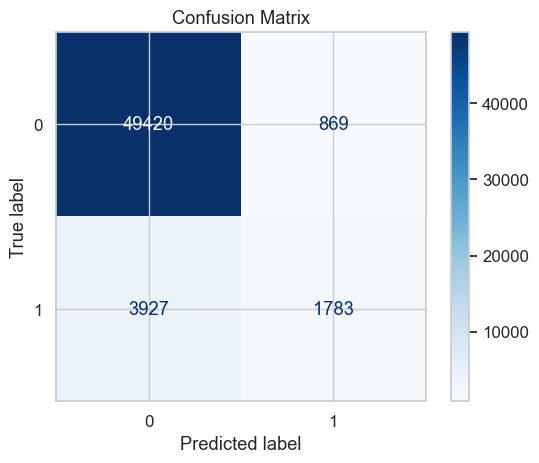


Accuracy : 0.9143556134930981


In [129]:
# Confusion matrix 
confusion = confusion_matrix(y_train_pred_final.Actual_Churn, y_train_pred_final.Predicted_Churn)

# Plot confusion matrix
disp = ConfusionMatrixDisplay(confusion_matrix=confusion)
disp.plot(cmap='Blues')
plt.title("Confusion Matrix")
plt.show()

print()
# Overall accuracy.
print(f'Accuracy : {accuracy_score(y_train_pred_final.Actual_Churn, y_train_pred_final.Predicted_Churn)}')

In [130]:
# Classification report
print(classification_report(y_train_pred_final.Actual_Churn, y_train_pred_final.Predicted_Churn))

              precision    recall  f1-score   support

           0       0.93      0.98      0.95     50289
           1       0.67      0.31      0.43      5710

    accuracy                           0.91     55999
   macro avg       0.80      0.65      0.69     55999
weighted avg       0.90      0.91      0.90     55999



In [131]:
vif = pd.DataFrame()
vif['Features'] = X_train_scaled[selected_features].columns
vif['VIF'] = [variance_inflation_factor(X_train_scaled[selected_features].values, i) for i in range(X_train_scaled[selected_features].shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
16,good_phase_total_ic_mou,3.25
15,good_phase_arpu,3.15
3,loc_ic_mou_8,2.89
7,max_rech_amt_8,2.65
17,good_phase_max_rech_amt,2.43
14,good_phase_loc_og_mou,2.21
1,offnet_mou_8,1.97
6,total_rech_num_8,1.94
8,last_day_rch_amt_8,1.82
9,arpu_3g_8,1.72


##### Now, VIFs are less than 5 for all the features hence there is no multicollinearity between all the features.

#### PERFORMANCE METRICS OF THE FINAL MODEL

In [132]:
TP = confusion[1,1] # true positive 
TN = confusion[0,0] # true negatives
FP = confusion[0,1] # false positives
FN = confusion[1,0] # false negatives

In [133]:
# Sensitivity, Specificity, False Positive Rate, Positive Predictive Rate, Negative Predictive Rate
print("Performance Metrics:")
print("---------------------")
print(f"{'Sensitivity (True Positive Rate):':<40} {TP / float(TP+FN)}")
print(f"{'Specificity (True Negative Rate):':<40} {TN / float(TN+FP)}")
print(f"{'False Positive Rate (FPR):':<40} {FP/ float(TN+FP)}")
print(f"{'Positive Predictive Rate (Precision):':<40} {TP/ float(TP+FP)}")
print(f"{'Negative Predictive Rate (NPV):':<40} {TN / float(TN+ FN)}")

Performance Metrics:
---------------------
Sensitivity (True Positive Rate):        0.31225919439579686
Specificity (True Negative Rate):        0.9827198790988089
False Positive Rate (FPR):               0.017280120901191114
Positive Predictive Rate (Precision):    0.6723227752639518
Negative Predictive Rate (NPV):          0.9263876131741241


#### ROC CURVE

In [134]:
def draw_roc( actual, probs ):
    fpr, tpr, thresholds = roc_curve( actual, probs,
                                              drop_intermediate = False)
    auc_score = roc_auc_score( actual, probs )
    plt.figure(figsize=(5, 5))
    plt.plot( fpr, tpr, label='ROC curve (area = %0.2f)' % auc_score )
    plt.plot([0, 1], [0, 1], 'k--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate or [1 - True Negative Rate]')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver operating characteristic example')
    plt.legend(loc="lower right")
    plt.show()

    return None

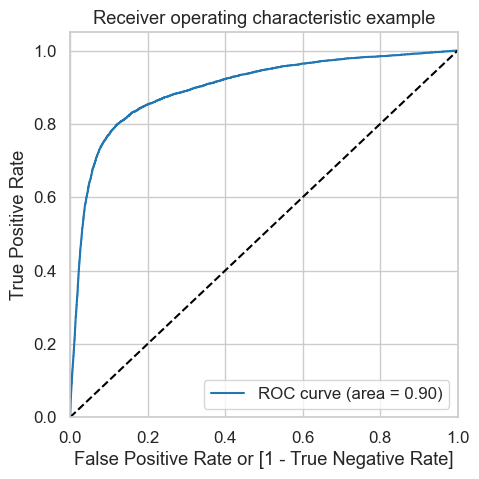

In [135]:
draw_roc(y_train_pred_final.Actual_Churn, y_train_pred_final.Predicted_Churn_Prob)

#### OPTIMAL THRESHOLD

In [136]:
# Create columns with different probability cutoffs 
numbers = [float(x)/10 for x in range(10)]
for i in numbers:
    y_train_pred_final[i]= y_train_pred_final.Predicted_Churn_Prob.map(lambda x: 1 if x > i else 0)
y_train_pred_final.head()

,Actual_Churn,Predicted_Churn_Prob,Predicted_Churn,0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9
0,0,0.002436,0,1,0,0,0,0,0,0,0,0,0
1,0,0.069652,0,1,0,0,0,0,0,0,0,0,0
2,0,0.310677,0,1,1,1,1,0,0,0,0,0,0
3,0,0.166105,0,1,1,0,0,0,0,0,0,0,0
4,1,0.519645,1,1,1,1,1,1,1,0,0,0,0


In [137]:
# Accuracy, Sensitivity and Specificity for various probability cutoffs.
cutoff_df = pd.DataFrame( columns = ['prob','accuracy','sensi','speci'])

num = [0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9]
for i in num:
    cm1 = confusion_matrix(y_train_pred_final.Actual_Churn, y_train_pred_final[i] )
    total1=sum(sum(cm1))
    accuracy = (cm1[0,0]+cm1[1,1])/total1
    
    speci = cm1[0,0]/(cm1[0,0]+cm1[0,1])
    sensi = cm1[1,1]/(cm1[1,0]+cm1[1,1])
    cutoff_df.loc[i] =[ i, accuracy, sensi, speci]

cutoff_df

,prob,accuracy,sensi,speci
0.0,0.0,0.101966,1.000000,0.000000
0.1,0.1,0.803925,0.854116,0.798226
0.2,0.2,0.888159,0.769527,0.901629
0.3,0.3,0.915373,0.669002,0.943347
0.4,0.4,0.922213,0.528546,0.966911
0.5,0.5,0.914356,0.312259,0.982720
0.6,0.6,0.907838,0.178459,0.990654
0.7,0.7,0.904141,0.098599,0.995605
0.8,0.8,0.901498,0.049737,0.998210
0.9,0.9,0.899230,0.015762,0.999543


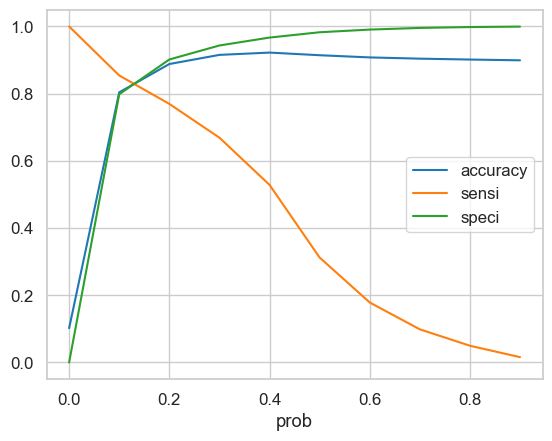

In [138]:
# Plotting accuracy sensitivity and specificity for various probabilities.
cutoff_df.plot.line(x='prob', y=['accuracy', 'sensi', 'speci'])
plt.show()

##### From the above graph, 0.125 is the Optimum Threshold for the cutoff.

In [139]:
y_train_pred_final['Final_Predicted_Churn'] = y_train_pred_final.Predicted_Churn_Prob.map(lambda x: 1 if x > 0.4 else 0)
y_train_pred_final.head()

,Actual_Churn,Predicted_Churn_Prob,Predicted_Churn,0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,Final_Predicted_Churn
0,0,0.002436,0,1,0,0,0,0,0,0,0,0,0,0
1,0,0.069652,0,1,0,0,0,0,0,0,0,0,0,0
2,0,0.310677,0,1,1,1,1,0,0,0,0,0,0,0
3,0,0.166105,0,1,1,0,0,0,0,0,0,0,0,0
4,1,0.519645,1,1,1,1,1,1,1,0,0,0,0,1


In [140]:
# Final Accuracy.
print(f'Accuracy : {accuracy_score(y_train_pred_final.Actual_Churn, y_train_pred_final.Final_Predicted_Churn)}')

Accuracy : 0.922212896658869


#### PRECISION - RECALL TRADEOFF

In [141]:
print(f"{'Precision Score:':<20} {precision_score(y_train_pred_final.Actual_Churn, y_train_pred_final.Final_Predicted_Churn)}")
print(f"{'Recall Score:':<20} {recall_score(y_train_pred_final.Actual_Churn, y_train_pred_final.Final_Predicted_Churn)}")

Precision Score:     0.644596326356258
Recall Score:        0.5285464098073556


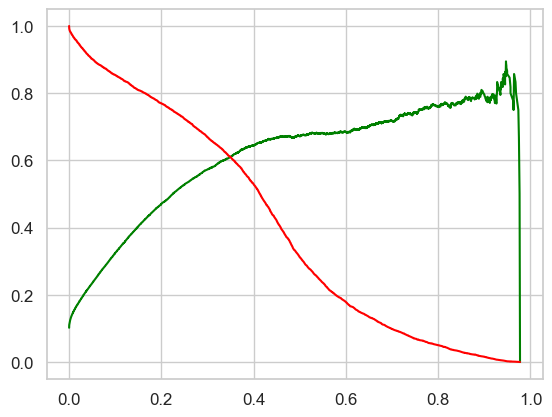

In [142]:
p, r, thresholds = precision_recall_curve(y_train_pred_final.Actual_Churn, y_train_pred_final.Predicted_Churn_Prob)

plt.plot(thresholds, p[:-1], 'g-')
plt.plot(thresholds, r[:-1], 'r-')
plt.show()

##### Optimum Point is around ~0.35

#### MAKING PREDICTIONS ON THE TEST SET

In [143]:
selected_features.shape

(18,)

In [144]:
X_test_sm = sm.add_constant(X_test_scaled[selected_features])

# Predict on test data

y_test_pred = result.predict(X_test_sm)
y_test_pred_final = pd.DataFrame({'Actual_Churn':y_test.values, 'Predicted_Churn_Prob':y_test_pred})
y_test_pred_final['Predicted_Churn'] = y_test_pred_final.Predicted_Churn_Prob.map(lambda x: 1 if x > 0.4 else 0)
y_test_pred_final.head()

,Actual_Churn,Predicted_Churn_Prob,Predicted_Churn
id,,,
57621,0,0.098334,0
39559,0,0.006932,0
41415,0,0.008533,0
47731,0,0.045088,0
64801,0,0.000118,0


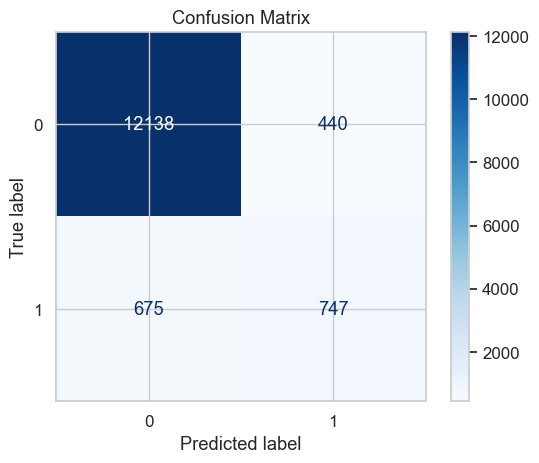


Accuracy Score:      0.9203571428571429
Precision Score:     0.6293176074136478
Recall Score:        0.5253164556962026


In [145]:
# Confusion matrix 
confusion = confusion_matrix(y_test_pred_final.Actual_Churn, y_test_pred_final.Predicted_Churn)

# Plot confusion matrix
disp = ConfusionMatrixDisplay(confusion_matrix=confusion)
disp.plot(cmap='Blues')
plt.title("Confusion Matrix")
plt.show()

print()
# Overall accuracy.
print(f"{'Accuracy Score:':<20} {accuracy_score(y_test_pred_final.Actual_Churn, y_test_pred_final.Predicted_Churn)}")
print(f"{'Precision Score:':<20} {precision_score(y_test_pred_final.Actual_Churn, y_test_pred_final.Predicted_Churn)}")
print(f"{'Recall Score:':<20} {recall_score(y_test_pred_final.Actual_Churn, y_test_pred_final.Predicted_Churn)}")

In [146]:
# Classification report
print(classification_report(y_test_pred_final.Actual_Churn, y_test_pred_final.Predicted_Churn))

              precision    recall  f1-score   support

           0       0.95      0.97      0.96     12578
           1       0.63      0.53      0.57      1422

    accuracy                           0.92     14000
   macro avg       0.79      0.75      0.76     14000
weighted avg       0.92      0.92      0.92     14000



In [147]:
TP = confusion[1,1] # true positive 
TN = confusion[0,0] # true negatives
FP = confusion[0,1] # false positives
FN = confusion[1,0] # false negatives

In [148]:
# Sensitivity, Specificity, False Positive Rate, Positive Predictive Rate, Negative Predictive Rate
print("Performance Metrics:")
print("---------------------")
print(f"{'Sensitivity (True Positive Rate):':<40} {TP / float(TP+FN)}")
print(f"{'Specificity (True Negative Rate):':<40} {TN / float(TN+FP)}")
print(f"{'False Positive Rate (FPR):':<40} {FP/ float(TN+FP)}")
print(f"{'Positive Predictive Rate (Precision):':<40} {TP/ float(TP+FP)}")
print(f"{'Negative Predictive Rate (NPV):':<40} {TN / float(TN+ FN)}")

Performance Metrics:
---------------------
Sensitivity (True Positive Rate):        0.5253164556962026
Specificity (True Negative Rate):        0.9650182858960089
False Positive Rate (FPR):               0.0349817141039911
Positive Predictive Rate (Precision):    0.6293176074136478
Negative Predictive Rate (NPV):          0.9473191290095996


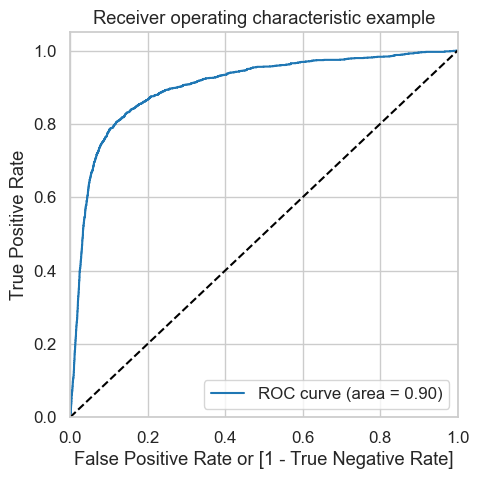

In [149]:
# ROC Curve
draw_roc(y_test_pred_final.Actual_Churn, y_test_pred_final.Predicted_Churn_Prob)

#### SUMMARY

In [150]:
train_accuracies.append(accuracy_score(y_train_pred_final.Actual_Churn, y_train_pred_final.Final_Predicted_Churn))
test_accuracies.append(accuracy_score(y_test_pred_final.Actual_Churn, y_test_pred_final.Predicted_Churn))
print(f"{'Accuracy Score for Train Set:':<40} {accuracy_score(y_train_pred_final.Actual_Churn, y_train_pred_final.Final_Predicted_Churn)}")
print(f"{'Accuracy Score for Test Set:':<40} {accuracy_score(y_test_pred_final.Actual_Churn, y_test_pred_final.Predicted_Churn)}")

Accuracy Score for Train Set:            0.922212896658869
Accuracy Score for Test Set:             0.9203571428571429


In [151]:
print('Important Predictors of Churn:')
print('--------------------------------------')
print(abs(result.params).sort_values(ascending=False))

Important Predictors of Churn:
--------------------------------------
const                      4.017936
loc_ic_mou_8               2.135641
spl_ic_mou_8               0.800097
total_rech_num_8           0.710034
last_day_rch_amt_8         0.498172
arpu_std_dev               0.431106
fb_user_8                  0.397807
std_ic_mou_8               0.376112
good_phase_total_ic_mou    0.345742
aon                        0.325400
good_phase_loc_og_mou      0.297290
roam_og_mou_8              0.276180
max_rech_amt_8             0.221326
good_phase_max_rech_amt    0.196249
arpu_3g_8                  0.187940
aug_vbc_3g                 0.179861
good_phase_arpu            0.176170
offnet_mou_8               0.105151
onnet_mou_8                0.082703
dtype: float64


##### We got an accuracy of ~92.2% for the train set and ~92.0% for the test set, which implies that the model is neither overfitted nor underfitted and is good at predicting unseen data.

### 7.1.2 LOGISTIC REGRESSION WITH PCA

In [152]:
lr = LogisticRegression(random_state=42)
lr.fit(X_train_pca, y_train)

LogisticRegression(random_state=42)

In [153]:
lr.score(X_train_pca, y_train)

0.9163735066697619

In [154]:
lr.score(X_test_pca, y_test)

0.9126428571428571

In [155]:
%%time
# Creating KFold object with 4 splits
folds = KFold(n_splits=4, shuffle=True, random_state=42)

# Specify params
params = {"C": [0.01, 0.1, 1, 10, 100, 1000]}

# Specifing score as recall as we are more focused on acheiving the higher sensitivity than the accuracy
lr_cv = GridSearchCV(estimator = LogisticRegression(),
                        param_grid = params, 
                        scoring= 'accuracy', 
                        cv = folds, 
                        n_jobs=-1,
                        verbose = 3,
                        return_train_score=True) 

# Fit the model
lr_cv.fit(X_train_pca, y_train)

Fitting 4 folds for each of 6 candidates, totalling 24 fits
CPU times: total: 2.19 s
Wall time: 10.6 s


GridSearchCV(cv=KFold(n_splits=4, random_state=42, shuffle=True),
             estimator=LogisticRegression(), n_jobs=-1,
             param_grid={'C': [0.01, 0.1, 1, 10, 100, 1000]},
             return_train_score=True, scoring='accuracy', verbose=3)

In [156]:
pd.DataFrame(lr_cv.cv_results_)

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_C,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,mean_train_score,std_train_score
0,0.766494,0.055725,0.018063,0.003479,0.01,{'C': 0.01},0.913500,0.915286,0.910071,0.914994,0.913463,0.002072,6,0.913403,0.913879,0.915093,0.913500,0.913969,0.000673
1,0.922496,0.032700,0.012287,0.002838,0.10,{'C': 0.1},0.915714,0.917143,0.912643,0.917208,0.915677,0.001851,5,0.915212,0.916569,0.917569,0.914810,0.916040,0.001098
2,0.930793,0.108951,0.019879,0.002160,1.00,{'C': 1},0.915571,0.917143,0.912643,0.917637,0.915749,0.001949,4,0.915617,0.916903,0.918022,0.915071,0.916403,0.001147
3,1.002226,0.108547,0.020104,0.002097,10.00,{'C': 10},0.915500,0.917143,0.912786,0.917708,0.915784,0.001912,1,0.915593,0.916903,0.918141,0.915214,0.916463,0.001154
4,0.981451,0.073384,0.014594,0.004252,100.00,{'C': 100},0.915500,0.917143,0.912786,0.917708,0.915784,0.001912,1,0.915593,0.916903,0.918141,0.915214,0.916463,0.001154
5,0.879438,0.017477,0.010427,0.007314,1000.00,{'C': 1000},0.915500,0.917143,0.912786,0.917708,0.915784,0.001912,1,0.915593,0.916903,0.918141,0.915214,0.916463,0.001154


In [157]:
print("Best parameters found: ", lr_cv.best_params_)
print("Best cross-validation accuracy: {:.2f}".format(lr_cv.best_score_))

# Get the best model
lr_pca = lr_cv.best_estimator_
print("Best Model:", lr_pca)

Best parameters found:  {'C': 10}
Best cross-validation accuracy: 0.92
Best Model: LogisticRegression(C=10)


In [158]:
# Accuracy for the Train Set
y_train_pred = lr_pca.predict(X_train_pca)
print(f'Train accuracy : {accuracy_score(y_train, y_train_pred)}')

print()
# Print the report on train data
print(classification_report(y_train, y_train_pred))

Train accuracy : 0.9163913641315024

              precision    recall  f1-score   support

           0       0.93      0.98      0.95     50289
           1       0.68      0.34      0.45      5710

    accuracy                           0.92     55999
   macro avg       0.80      0.66      0.70     55999
weighted avg       0.90      0.92      0.90     55999



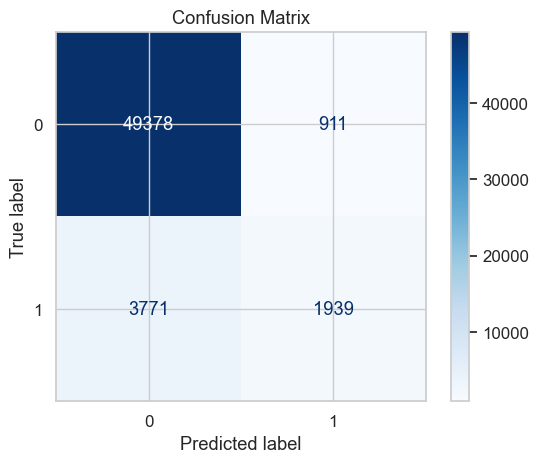

In [159]:
# Confusion matrix 
confusion = confusion_matrix(y_train, y_train_pred)

# Plot confusion matrix
disp = ConfusionMatrixDisplay(confusion_matrix=confusion)
disp.plot(cmap='Blues')
plt.title("Confusion Matrix")
plt.show()

#### MAKING PREDICTIONS ON THE TEST SET

In [160]:
# Accuracy for the Test Set
y_test_pred = lr_pca.predict(X_test_pca)
print(f'Test accuracy : {accuracy_score(y_test, y_test_pred)}')

print()
# Print the report on test data
print(classification_report(y_test, y_test_pred))

Test accuracy : 0.9126428571428571

              precision    recall  f1-score   support

           0       0.93      0.98      0.95     12578
           1       0.63      0.34      0.44      1422

    accuracy                           0.91     14000
   macro avg       0.78      0.66      0.70     14000
weighted avg       0.90      0.91      0.90     14000



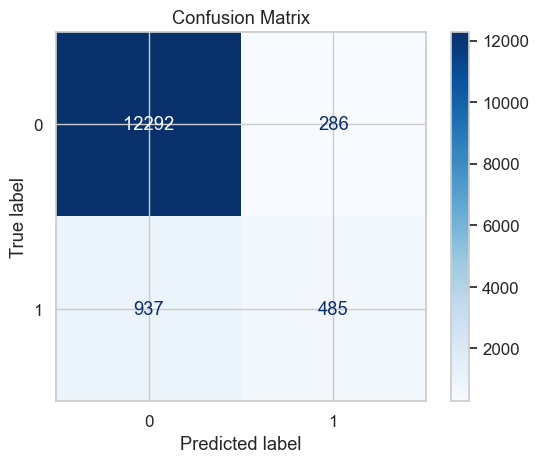

In [161]:
# Confusion matrix 
confusion = confusion_matrix(y_test, y_test_pred)

# Plot confusion matrix
disp = ConfusionMatrixDisplay(confusion_matrix=confusion)
disp.plot(cmap='Blues')
plt.title("Confusion Matrix")
plt.show()

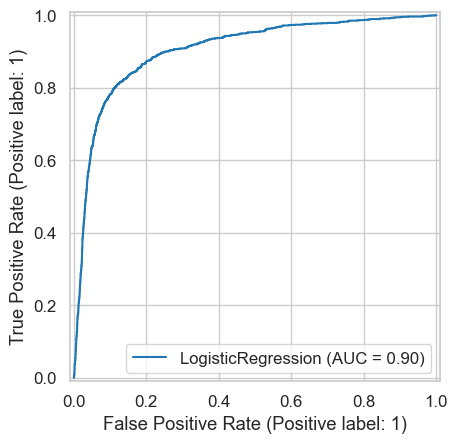

In [162]:
RocCurveDisplay.from_estimator(lr_pca, X_test_pca, y_test)
plt.show()

In [163]:
print(f"{'Precision Score:':<20} {precision_score(y_test, y_test_pred)}")
print(f"{'Recall Score:':<20} {recall_score(y_test, y_test_pred)}")

Precision Score:     0.62905317769131
Recall Score:        0.3410689170182841


In [164]:
TP = confusion[1,1] # true positive 
TN = confusion[0,0] # true negatives
FP = confusion[0,1] # false positives
FN = confusion[1,0] # false negatives

In [165]:
# Sensitivity, Specificity, False Positive Rate, Positive Predictive Rate, Negative Predictive Rate
print("Performance Metrics:")
print("---------------------")
print(f"{'Sensitivity (True Positive Rate):':<40} {TP / float(TP+FN)}")
print(f"{'Specificity (True Negative Rate):':<40} {TN / float(TN+FP)}")
print(f"{'False Positive Rate (FPR):':<40} {FP/ float(TN+FP)}")
print(f"{'Positive Predictive Rate (Precision):':<40} {TP/ float(TP+FP)}")
print(f"{'Negative Predictive Rate (NPV):':<40} {TN / float(TN+ FN)}")

Performance Metrics:
---------------------
Sensitivity (True Positive Rate):        0.3410689170182841
Specificity (True Negative Rate):        0.9772618858324058
False Positive Rate (FPR):               0.022738114167594213
Positive Predictive Rate (Precision):    0.62905317769131
Negative Predictive Rate (NPV):          0.9291707612064404


#### SUMMARY

In [166]:
train_accuracies.append(accuracy_score(y_train, y_train_pred))
test_accuracies.append(accuracy_score(y_test, y_test_pred))
print(f"{'Accuracy Score for Train Set:':<40} {accuracy_score(y_train, y_train_pred)}")
print(f"{'Accuracy Score for Test Set:':<40} {accuracy_score(y_test, y_test_pred)}")

Accuracy Score for Train Set:            0.9163913641315024
Accuracy Score for Test Set:             0.9126428571428571


##### We got an accuracy of ~91.6% for the train set and ~91.3% for the test set, which implies that the model is neither overfitted nor underfitted and is good at predicting unseen data.

## 7.2 DECISION TREE

### 7.2.1 DECISION TREE WITH PCA

#### BUILDING THE FIRST MODEL

In [167]:
# Initial Decision Tree classifier
dt1 = DecisionTreeClassifier(random_state=42, max_depth=10)
dt1.fit(X_train_pca, y_train)

DecisionTreeClassifier(max_depth=10, random_state=42)

In [168]:
# # Visualize the tree
# plt.figure(figsize=(24, 16))
# plot_tree(dt1, feature_names=pd.DataFrame(X_train_pca).columns, 
#           class_names=['Not Churned', 'Churned'], 
#           filled=True, rounded=True)
# plt.title("Decision Tree Visualization")
# plt.show()

In [169]:
# Accuracy for the Train Set
y_train_pred = dt1.predict(X_train_pca)
print(f'Train accuracy : {accuracy_score(y_train, y_train_pred)}')

print()
# Print the report on train data
print(classification_report(y_train, y_train_pred))

Train accuracy : 0.9381953249165164

              precision    recall  f1-score   support

           0       0.96      0.97      0.97     50289
           1       0.72      0.64      0.68      5710

    accuracy                           0.94     55999
   macro avg       0.84      0.81      0.82     55999
weighted avg       0.94      0.94      0.94     55999



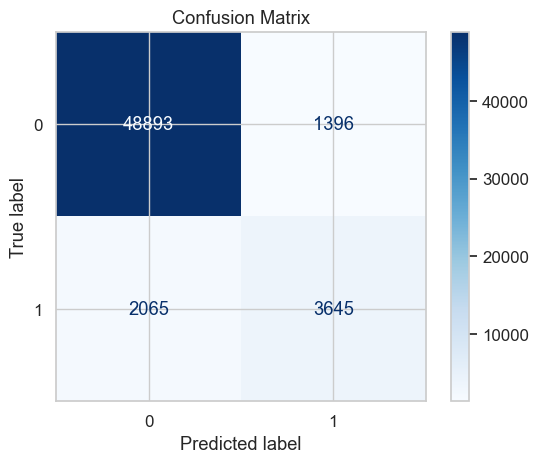

In [170]:
# Confusion matrix 
confusion = confusion_matrix(y_train, y_train_pred)
 
# Plot confusion matrix
disp = ConfusionMatrixDisplay(confusion_matrix=confusion)
disp.plot(cmap='Blues')
plt.title("Confusion Matrix")
plt.show()

#### MAKING PREDICTIONS ON THE TEST SET

In [171]:
# Accuracy for the Test Set
y_test_pred = dt1.predict(X_test_pca)
print(f'Test accuracy : {accuracy_score(y_test, y_test_pred)}')

print()
# Print the report on test data
print(classification_report(y_test, y_test_pred))

Test accuracy : 0.8952142857142857

              precision    recall  f1-score   support

           0       0.94      0.94      0.94     12578
           1       0.48      0.49      0.49      1422

    accuracy                           0.90     14000
   macro avg       0.71      0.71      0.71     14000
weighted avg       0.90      0.90      0.90     14000



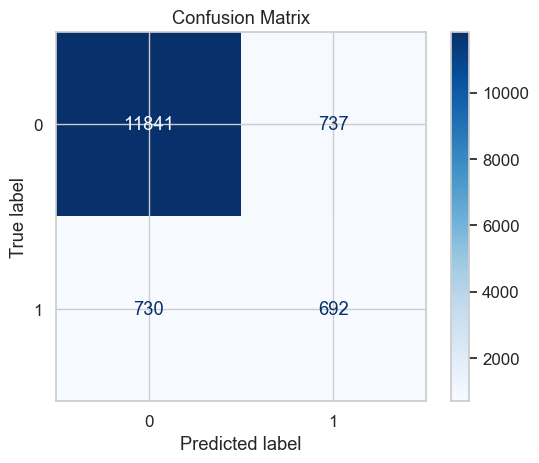

In [172]:
# Confusion matrix 
confusion = confusion_matrix(y_test, y_test_pred)

# Plot confusion matrix
disp = ConfusionMatrixDisplay(confusion_matrix=confusion)
disp.plot(cmap='Blues')
plt.title("Confusion Matrix")
plt.show()

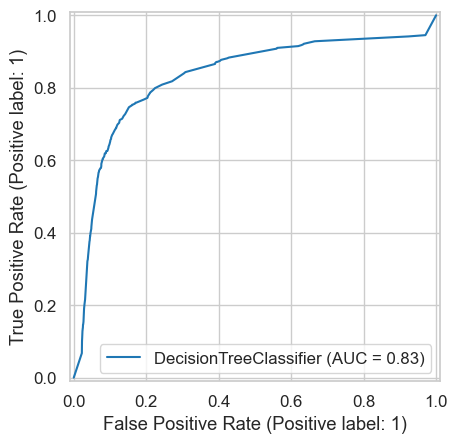

In [173]:
# ROC
RocCurveDisplay.from_estimator(dt1, X_test_pca, y_test)
plt.show()

#### HYPERPARAMETER TUNING USING GRIDSEARCHCV

In [174]:
%%time
dt2 = DecisionTreeClassifier(random_state=42)

# Define hyperparameters and ranges to search
params = {
    'max_depth': [5, 10, 20, 30, 40],
    'min_samples_leaf': [10, 25, 50, 100, 250],
}

folds = KFold(n_splits=4, shuffle=True, random_state=42)

grid_search_dt = GridSearchCV(estimator=dt2,
                           param_grid=params,
                           cv=folds,
                           n_jobs=-1, verbose=3, scoring="accuracy")

# Perform gridsearch
grid_search_dt.fit(X_train_pca, y_train)

Fitting 4 folds for each of 25 candidates, totalling 100 fits
CPU times: total: 7.36 s
Wall time: 2min 7s


GridSearchCV(cv=KFold(n_splits=4, random_state=42, shuffle=True),
             estimator=DecisionTreeClassifier(random_state=42), n_jobs=-1,
             param_grid={'max_depth': [5, 10, 20, 30, 40],
                         'min_samples_leaf': [10, 25, 50, 100, 250]},
             scoring='accuracy', verbose=3)

In [175]:
print("Best parameters found: ", grid_search_dt.best_params_)
print("Best cross-validation accuracy: {:.2f}".format(grid_search_dt.best_score_))

dt_clf_pca = grid_search_dt.best_estimator_
print("Best Model:", dt_clf_pca)

Best parameters found:  {'max_depth': 10, 'min_samples_leaf': 50}
Best cross-validation accuracy: 0.91
Best Model: DecisionTreeClassifier(max_depth=10, min_samples_leaf=50, random_state=42)


In [176]:
# Accuracy for the Train Set
y_train_pred = dt_clf_pca.predict(X_train_pca)
print(f'Train accuracy : {accuracy_score(y_train, y_train_pred)}')

print()
# Print the report on train data
print(classification_report(y_train, y_train_pred))

Train accuracy : 0.9224450436614939

              precision    recall  f1-score   support

           0       0.95      0.97      0.96     50289
           1       0.65      0.53      0.58      5710

    accuracy                           0.92     55999
   macro avg       0.80      0.75      0.77     55999
weighted avg       0.92      0.92      0.92     55999



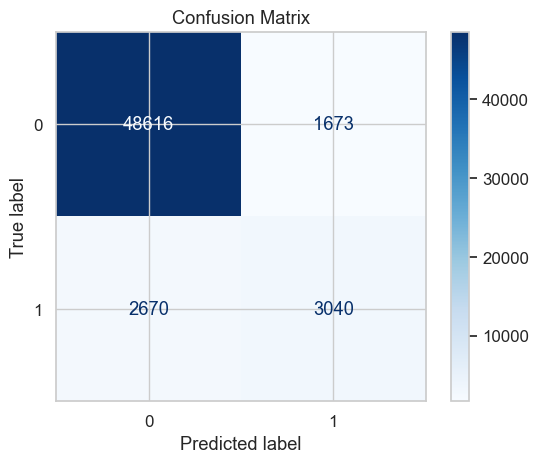

In [177]:
# Confusion matrix 
confusion = confusion_matrix(y_train, y_train_pred)

# Plot confusion matrix
disp = ConfusionMatrixDisplay(confusion_matrix=confusion)
disp.plot(cmap='Blues')
plt.title("Confusion Matrix")
plt.show()

#### MAKING PREDICTIONS ON THE TEST SET

In [178]:
# Accuracy for the Test Set
y_test_pred = dt_clf_pca.predict(X_test_pca)
print(f'Test accuracy : {accuracy_score(y_test, y_test_pred)}')

print()
# Print the report on test data
print(classification_report(y_test, y_test_pred))

Test accuracy : 0.9102142857142858

              precision    recall  f1-score   support

           0       0.94      0.96      0.95     12578
           1       0.57      0.46      0.51      1422

    accuracy                           0.91     14000
   macro avg       0.76      0.71      0.73     14000
weighted avg       0.90      0.91      0.91     14000



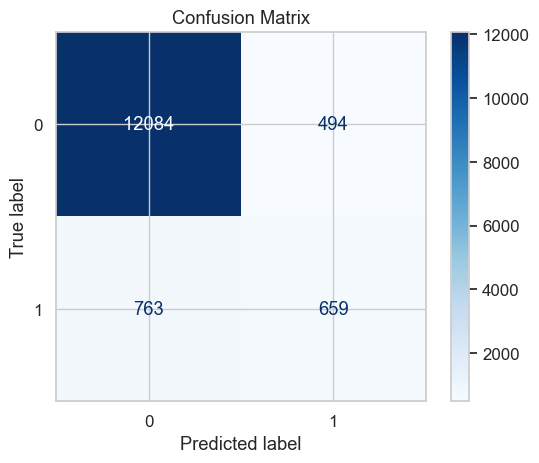

In [179]:
# Confusion matrix 
confusion = confusion_matrix(y_test, y_test_pred)

# Plot confusion matrix
disp = ConfusionMatrixDisplay(confusion_matrix=confusion)
disp.plot(cmap='Blues')
plt.title("Confusion Matrix")
plt.show()

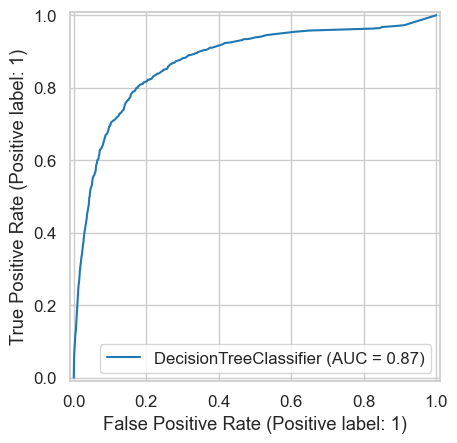

In [180]:
# ROC
RocCurveDisplay.from_estimator(dt_clf_pca, X_test_pca, y_test)
plt.show()

In [181]:
print(f"{'Precision Score:':<20} {precision_score(y_test, y_test_pred)}")
print(f"{'Recall Score:':<20} {recall_score(y_test, y_test_pred)}")

Precision Score:     0.5715524718126627
Recall Score:        0.46343178621659636


In [182]:
TP = confusion[1,1] # true positive 
TN = confusion[0,0] # true negatives
FP = confusion[0,1] # false positives
FN = confusion[1,0] # false negatives

In [183]:
# Sensitivity, Specificity, False Positive Rate, Positive Predictive Rate, Negative Predictive Rate
print("Performance Metrics:")
print("---------------------")
print(f"{'Sensitivity (True Positive Rate):':<40} {TP / float(TP+FN)}")
print(f"{'Specificity (True Negative Rate):':<40} {TN / float(TN+FP)}")
print(f"{'False Positive Rate (FPR):':<40} {FP/ float(TN+FP)}")
print(f"{'Positive Predictive Rate (Precision):':<40} {TP/ float(TP+FP)}")
print(f"{'Negative Predictive Rate (NPV):':<40} {TN / float(TN+ FN)}")

Performance Metrics:
---------------------
Sensitivity (True Positive Rate):        0.46343178621659636
Specificity (True Negative Rate):        0.9607250755287009
False Positive Rate (FPR):               0.03927492447129909
Positive Predictive Rate (Precision):    0.5715524718126627
Negative Predictive Rate (NPV):          0.9406087024207986


#### SUMMARY

In [184]:
train_accuracies.append(accuracy_score(y_train, y_train_pred))
test_accuracies.append(accuracy_score(y_test, y_test_pred))
print(f"{'Accuracy Score for Train Set:':<40} {accuracy_score(y_train, y_train_pred)}")
print(f"{'Accuracy Score for Test Set:':<40} {accuracy_score(y_test, y_test_pred)}")

Accuracy Score for Train Set:            0.9224450436614939
Accuracy Score for Test Set:             0.9102142857142858


##### We got an accuracy of ~92.2% for the train set and ~91.0% for the test set, which implies that the model is neither overfitted nor underfitted and is good at predicting unseen data.

### 7.2.2 DECISION TREE WITHOUT PCA

#### BUILDING THE FIRST MODEL

In [185]:
# Initial Decision Tree classifier
dt3 = DecisionTreeClassifier(random_state=42, max_depth=10)
dt3.fit(X_train_scaled, y_train)

DecisionTreeClassifier(max_depth=10, random_state=42)

In [186]:
# # Visualize the tree
# plt.figure(figsize=(24, 16))
# plot_tree(dt3, feature_names=pd.DataFrame(X_train_scaled).columns, 
#           class_names=['Not Churned', 'Churned'], 
#           filled=True, rounded=True)
# plt.title("Decision Tree Visualization")
# plt.show()

In [187]:
# Accuracy for the Train Set
y_train_pred = dt3.predict(X_train_scaled)
print(f'Train accuracy : {accuracy_score(y_train, y_train_pred)}')

print()
# Print the report on train data
print(classification_report(y_train, y_train_pred))

Train accuracy : 0.9560349291951642

              precision    recall  f1-score   support

           0       0.97      0.98      0.98     50289
           1       0.83      0.71      0.77      5710

    accuracy                           0.96     55999
   macro avg       0.90      0.85      0.87     55999
weighted avg       0.95      0.96      0.95     55999



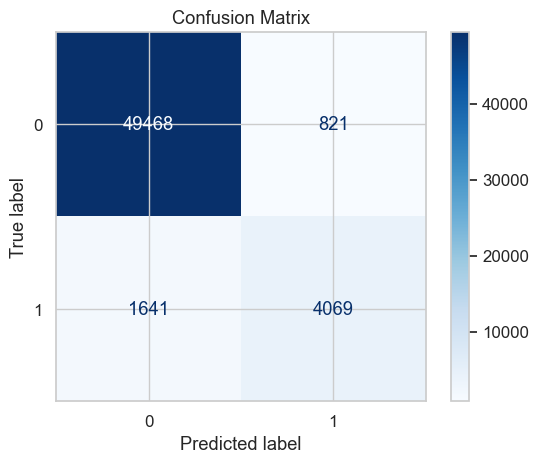

In [188]:
# Confusion matrix 
confusion = confusion_matrix(y_train, y_train_pred)
 
# Plot confusion matrix
disp = ConfusionMatrixDisplay(confusion_matrix=confusion)
disp.plot(cmap='Blues')
plt.title("Confusion Matrix")
plt.show()

#### MAKING PREDICTIONS ON THE TEST SET

In [189]:
# Accuracy for the Test Set
y_test_pred = dt3.predict(X_test_scaled)
print(f'Test accuracy : {accuracy_score(y_test, y_test_pred)}')

print()
# Print the report on test data
print(classification_report(y_test, y_test_pred))

Test accuracy : 0.9305

              precision    recall  f1-score   support

           0       0.96      0.97      0.96     12578
           1       0.67      0.62      0.65      1422

    accuracy                           0.93     14000
   macro avg       0.81      0.79      0.80     14000
weighted avg       0.93      0.93      0.93     14000



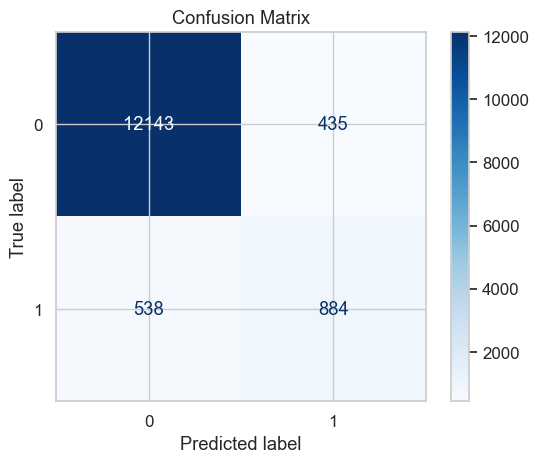

In [190]:
# Confusion matrix 
confusion = confusion_matrix(y_test, y_test_pred)

# Plot confusion matrix
disp = ConfusionMatrixDisplay(confusion_matrix=confusion)
disp.plot(cmap='Blues')
plt.title("Confusion Matrix")
plt.show()

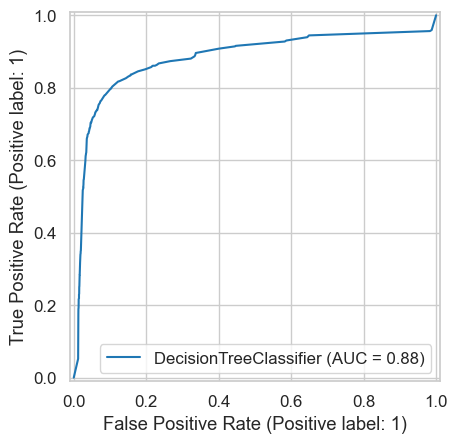

In [191]:
# ROC
RocCurveDisplay.from_estimator(dt3, X_test_scaled, y_test)
plt.show()

#### HYPERPARAMETER TUNING USING GRIDSEARCHCV

In [192]:
%%time
dt4 = DecisionTreeClassifier(random_state=42)

# Define hyperparameters and ranges to search
params = {
    "max_depth": [5, 10, 20, 30, 40],
    "min_samples_leaf": [10, 25, 50, 100, 250]
}

folds = KFold(n_splits=4, shuffle=True, random_state=42)

grid_search_dt_1 = GridSearchCV(estimator=dt4,
                           param_grid=params,
                           cv=folds,
                           n_jobs=-1, verbose=3, scoring="accuracy")

# Perform gridsearch
grid_search_dt_1.fit(X_train_scaled, y_train)

Fitting 4 folds for each of 25 candidates, totalling 100 fits
CPU times: total: 2.62 s
Wall time: 59.3 s


GridSearchCV(cv=KFold(n_splits=4, random_state=42, shuffle=True),
             estimator=DecisionTreeClassifier(random_state=42), n_jobs=-1,
             param_grid={'max_depth': [5, 10, 20, 30, 40],
                         'min_samples_leaf': [10, 25, 50, 100, 250]},
             scoring='accuracy', verbose=3)

In [193]:
print("Best parameters found: ", grid_search_dt_1.best_params_)
print("Best cross-validation accuracy: {:.2f}".format(grid_search_dt_1.best_score_))

dt_clf = grid_search_dt_1.best_estimator_
print("Best Model:", dt_clf)

Best parameters found:  {'max_depth': 5, 'min_samples_leaf': 50}
Best cross-validation accuracy: 0.94
Best Model: DecisionTreeClassifier(max_depth=5, min_samples_leaf=50, random_state=42)


In [194]:
# Accuracy for the Train Set
y_train_pred = dt_clf.predict(X_train_scaled)
print(f'Train accuracy : {accuracy_score(y_train, y_train_pred)}')

print()
# Print the report on train data
print(classification_report(y_train, y_train_pred))

Train accuracy : 0.9414096680297862

              precision    recall  f1-score   support

           0       0.96      0.98      0.97     50289
           1       0.77      0.60      0.68      5710

    accuracy                           0.94     55999
   macro avg       0.86      0.79      0.82     55999
weighted avg       0.94      0.94      0.94     55999



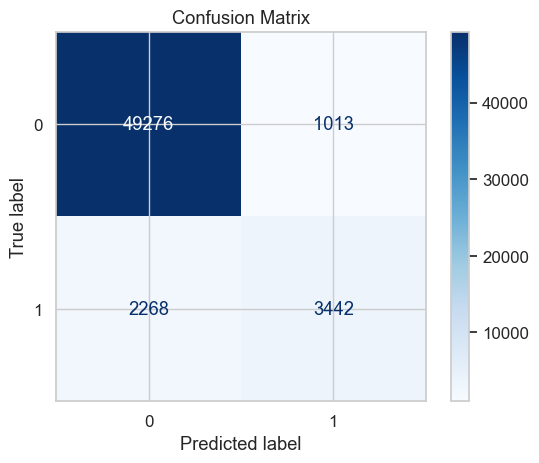

In [ ]:
# Confusion matrix 
confusion = confusion_matrix(y_train, y_train_pred)
# Plot confusion matrix
disp = ConfusionMatrixDisplay(confusion_matrix=confusion)
disp.plot(cmap='Blues')
plt.title("Confusion Matrix")
plt.show()

#### MAKING PREDICTIONS ON THE TEST SET

In [196]:
# Accuracy for the Test Set
y_test_pred = dt_clf.predict(X_test_scaled)
print(f'Test accuracy : {accuracy_score(y_test, y_test_pred)}')

print()
# Print the report on test data
print(classification_report(y_test, y_test_pred))

Test accuracy : 0.9434285714285714

              precision    recall  f1-score   support

           0       0.96      0.98      0.97     12578
           1       0.77      0.63      0.69      1422

    accuracy                           0.94     14000
   macro avg       0.86      0.80      0.83     14000
weighted avg       0.94      0.94      0.94     14000



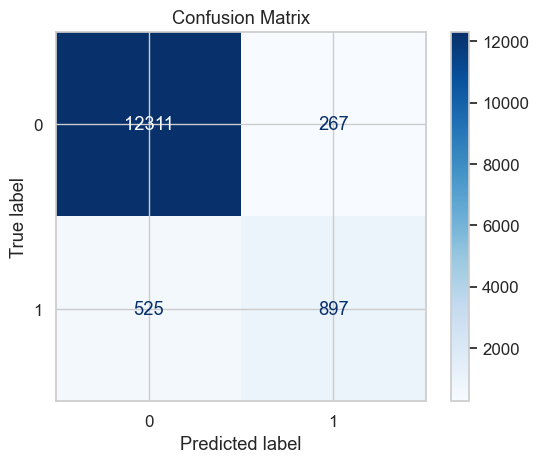

In [197]:
# Confusion matrix 
confusion = confusion_matrix(y_test, y_test_pred)

# Plot confusion matrix
disp = ConfusionMatrixDisplay(confusion_matrix=confusion)
disp.plot(cmap='Blues')
plt.title("Confusion Matrix")
plt.show()

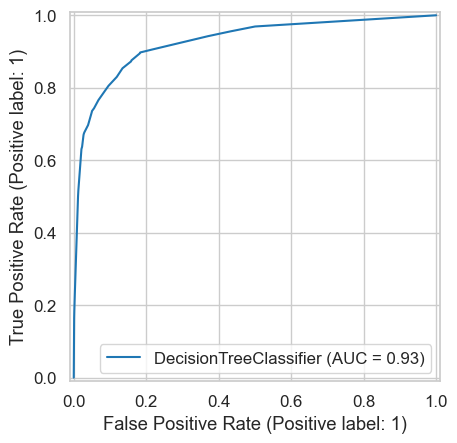

In [198]:
# ROC
RocCurveDisplay.from_estimator(dt_clf, X_test_scaled, y_test)
plt.show()

In [199]:
print(f"{'Precision Score:':<20} {precision_score(y_test, y_test_pred)}")
print(f"{'Recall Score:':<20} {recall_score(y_test, y_test_pred)}")

Precision Score:     0.770618556701031
Recall Score:        0.630801687763713


In [200]:
TP = confusion[1,1] # true positive 
TN = confusion[0,0] # true negatives
FP = confusion[0,1] # false positives
FN = confusion[1,0] # false negatives

In [201]:
# Sensitivity, Specificity, False Positive Rate, Positive Predictive Rate, Negative Predictive Rate
print("Performance Metrics:")
print("---------------------")
print(f"{'Sensitivity (True Positive Rate):':<40} {TP / float(TP+FN)}")
print(f"{'Specificity (True Negative Rate):':<40} {TN / float(TN+FP)}")
print(f"{'False Positive Rate (FPR):':<40} {FP/ float(TN+FP)}")
print(f"{'Positive Predictive Rate (Precision):':<40} {TP/ float(TP+FP)}")
print(f"{'Negative Predictive Rate (NPV):':<40} {TN / float(TN+ FN)}")

Performance Metrics:
---------------------
Sensitivity (True Positive Rate):        0.630801687763713
Specificity (True Negative Rate):        0.9787724598505326
False Positive Rate (FPR):               0.021227540149467324
Positive Predictive Rate (Precision):    0.770618556701031
Negative Predictive Rate (NPV):          0.9590994079152384


#### SUMMARY

In [202]:
train_accuracies.append(accuracy_score(y_train, y_train_pred))
test_accuracies.append(accuracy_score(y_test, y_test_pred))
print(f"{'Accuracy Score for Train Set:':<40} {accuracy_score(y_train, y_train_pred)}")
print(f"{'Accuracy Score for Test Set:':<40} {accuracy_score(y_test, y_test_pred)}")

Accuracy Score for Train Set:            0.9414096680297862
Accuracy Score for Test Set:             0.9434285714285714


##### We got an accuracy of ~94.1% for the train set and ~94.3% for the test set, which implies that the model is neither overfitted nor underfitted and is good at predicting unseen data.

## 7.3 RANDOM FOREST

### 7.3.1 RANDOM FOREST WITH PCA

In [203]:
# Initial Random Forest Classifier
rf1 = RandomForestClassifier(n_estimators=15, max_depth=10, max_features=10, oob_score=True, random_state=42)
rf1.fit(X_train_pca, y_train)

RandomForestClassifier(max_depth=10, max_features=10, n_estimators=15,
                       oob_score=True, random_state=42)

In [204]:
# Accuracy for the Train Set
y_train_pred = rf1.predict(X_train_pca)
print(f'Train accuracy : {accuracy_score(y_train, y_train_pred)}')

print()
# Print the report on train data
print(classification_report(y_train, y_train_pred))

Train accuracy : 0.9382488973017375

              precision    recall  f1-score   support

           0       0.94      0.99      0.97     50289
           1       0.86      0.47      0.61      5710

    accuracy                           0.94     55999
   macro avg       0.90      0.73      0.79     55999
weighted avg       0.93      0.94      0.93     55999



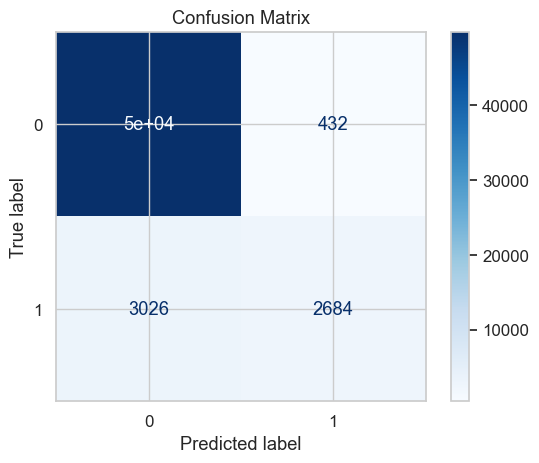

In [205]:
# Confusion matrix 
confusion = confusion_matrix(y_train, y_train_pred)
 
# Plot confusion matrix
disp = ConfusionMatrixDisplay(confusion_matrix=confusion)
disp.plot(cmap='Blues')
plt.title("Confusion Matrix")
plt.show()

In [206]:
# Get the OOB score
print("OOB Score:", rf1.oob_score_)

OOB Score: 0.9145877604957231


#### MAKING PREDICTIONS ON THE TEST SET

In [207]:
# Accuracy for the Test Set
y_test_pred = rf1.predict(X_test_pca)
print(f'Test accuracy : {accuracy_score(y_test, y_test_pred)}')

print()
# Print the report on test data
print(classification_report(y_test, y_test_pred))

Test accuracy : 0.9167142857142857

              precision    recall  f1-score   support

           0       0.93      0.98      0.96     12578
           1       0.69      0.32      0.44      1422

    accuracy                           0.92     14000
   macro avg       0.81      0.65      0.70     14000
weighted avg       0.90      0.92      0.90     14000



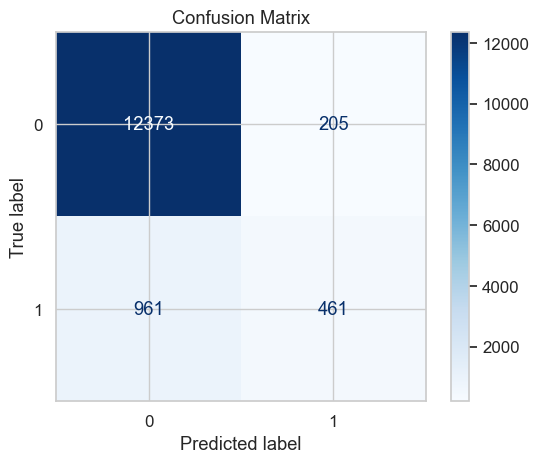

In [208]:
# Confusion matrix 
confusion = confusion_matrix(y_test, y_test_pred)

# Plot confusion matrix
disp = ConfusionMatrixDisplay(confusion_matrix=confusion)
disp.plot(cmap='Blues')
plt.title("Confusion Matrix")
plt.show()

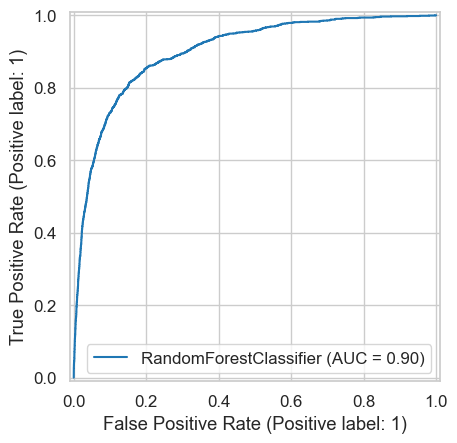

In [209]:
# ROC
RocCurveDisplay.from_estimator(rf1, X_test_pca, y_test)
plt.show()

#### HYPERPARAMETER TUNING USING GRIDSEARCHCV

In [210]:
%%time
rf2 = RandomForestClassifier(random_state=42, oob_score=True)

# Define hyperparameters and ranges to search
params = {
    "max_depth": [2, 5, 10],
    "min_samples_leaf": [5, 10, 50],
    'n_estimators': [25, 50, 100]
}

folds = KFold(n_splits=4, shuffle=True, random_state=42)

grid_search_rf = GridSearchCV(estimator=rf2,
                           param_grid=params,
                           cv=folds, n_jobs=-1,
                           verbose=3, scoring="accuracy", return_train_score=True)

# Perform gridsearch
grid_search_rf.fit(X_train_pca, y_train)

Fitting 4 folds for each of 27 candidates, totalling 108 fits
CPU times: total: 56.1 s
Wall time: 7min 34s


GridSearchCV(cv=KFold(n_splits=4, random_state=42, shuffle=True),
             estimator=RandomForestClassifier(oob_score=True, random_state=42),
             n_jobs=-1,
             param_grid={'max_depth': [2, 5, 10],
                         'min_samples_leaf': [5, 10, 50],
                         'n_estimators': [25, 50, 100]},
             return_train_score=True, scoring='accuracy', verbose=3)

In [211]:
print("Best parameters found: ", grid_search_rf.best_params_)
print("Best cross-validation accuracy: {:.2f}".format(grid_search_rf.best_score_))

rf_clf_pca = grid_search_rf.best_estimator_
print("Best Model:", rf_clf_pca)

Best parameters found:  {'max_depth': 10, 'min_samples_leaf': 5, 'n_estimators': 100}
Best cross-validation accuracy: 0.91
Best Model: RandomForestClassifier(max_depth=10, min_samples_leaf=5, oob_score=True,
                       random_state=42)


In [212]:
# Get the OOB score
print("OOB Score:", rf_clf_pca.oob_score_)

OOB Score: 0.9141948963374346


In [213]:
# Accuracy for the Train Set
y_train_pred = rf_clf_pca.predict(X_train_pca)
print(f'Train accuracy : {accuracy_score(y_train, y_train_pred)}')

print()
# Print the report on train data
print(classification_report(y_train, y_train_pred))

Train accuracy : 0.9284094358827836

              precision    recall  f1-score   support

           0       0.93      0.99      0.96     50289
           1       0.85      0.36      0.51      5710

    accuracy                           0.93     55999
   macro avg       0.89      0.68      0.73     55999
weighted avg       0.92      0.93      0.92     55999



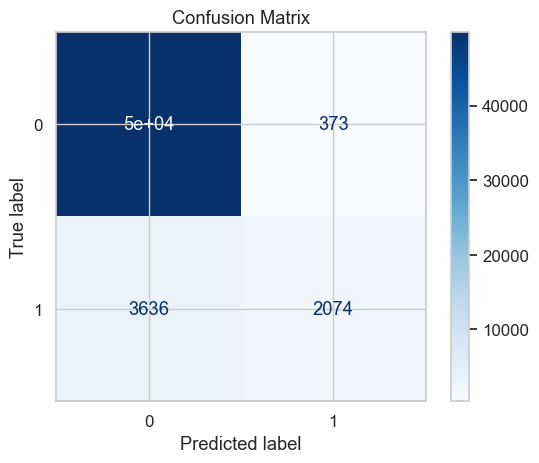

In [214]:
# Confusion matrix 
confusion = confusion_matrix(y_train, y_train_pred)

# Plot confusion matrix
disp = ConfusionMatrixDisplay(confusion_matrix=confusion)
disp.plot(cmap='Blues')
plt.title("Confusion Matrix")
plt.show()

#### MAKING PREDICTIONS ON THE TEST SET

In [215]:
# Accuracy for the Test Set
y_test_pred = rf_clf_pca.predict(X_test_pca)
print(f'Test accuracy : {accuracy_score(y_test, y_test_pred)}')

print()
# Print the report on test data
print(classification_report(y_test, y_test_pred))

Test accuracy : 0.9147142857142857

              precision    recall  f1-score   support

           0       0.92      0.99      0.95     12578
           1       0.73      0.25      0.38      1422

    accuracy                           0.91     14000
   macro avg       0.83      0.62      0.66     14000
weighted avg       0.90      0.91      0.90     14000



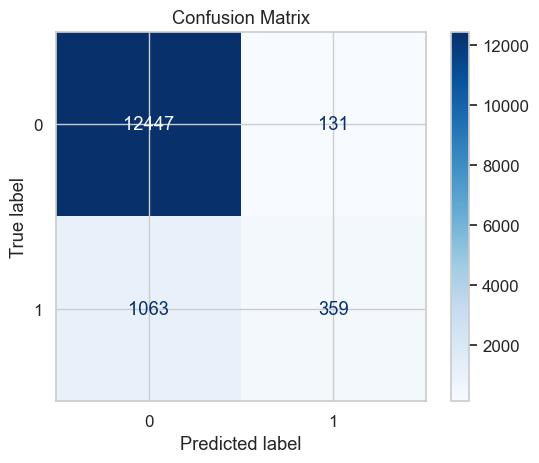

In [216]:
# Confusion matrix 
confusion = confusion_matrix(y_test, y_test_pred)

# Plot confusion matrix
disp = ConfusionMatrixDisplay(confusion_matrix=confusion)
disp.plot(cmap='Blues')
plt.title("Confusion Matrix")
plt.show()

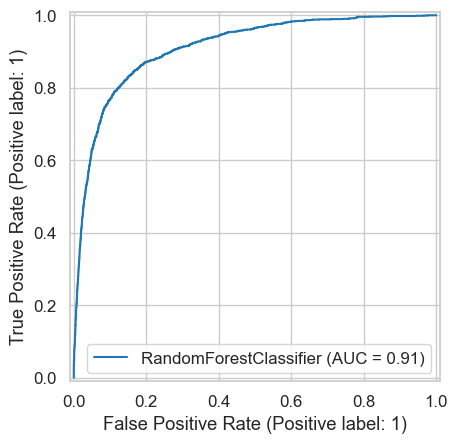

In [217]:
# ROC
RocCurveDisplay.from_estimator(rf_clf_pca, X_test_pca, y_test)
plt.show()

In [218]:
print(f"{'Precision Score:':<20} {precision_score(y_test, y_test_pred)}")
print(f"{'Recall Score:':<20} {recall_score(y_test, y_test_pred)}")

Precision Score:     0.7326530612244898
Recall Score:        0.25246132208157523


In [219]:
TP = confusion[1,1] # true positive 
TN = confusion[0,0] # true negatives
FP = confusion[0,1] # false positives
FN = confusion[1,0] # false negatives

In [220]:
# Sensitivity, Specificity, False Positive Rate, Positive Predictive Rate, Negative Predictive Rate
print("Performance Metrics:")
print("---------------------")
print(f"{'Sensitivity (True Positive Rate):':<40} {TP / float(TP+FN)}")
print(f"{'Specificity (True Negative Rate):':<40} {TN / float(TN+FP)}")
print(f"{'False Positive Rate (FPR):':<40} {FP/ float(TN+FP)}")
print(f"{'Positive Predictive Rate (Precision):':<40} {TP/ float(TP+FP)}")
print(f"{'Negative Predictive Rate (NPV):':<40} {TN / float(TN+ FN)}")

Performance Metrics:
---------------------
Sensitivity (True Positive Rate):        0.25246132208157523
Specificity (True Negative Rate):        0.9895849896644936
False Positive Rate (FPR):               0.01041501033550644
Positive Predictive Rate (Precision):    0.7326530612244898
Negative Predictive Rate (NPV):          0.9213175425610659


#### SUMMARY

In [221]:
train_accuracies.append(accuracy_score(y_train, y_train_pred))
test_accuracies.append(accuracy_score(y_test, y_test_pred))
print(f"{'Accuracy Score for Train Set:':<40} {accuracy_score(y_train, y_train_pred)}")
print(f"{'Accuracy Score for Test Set:':<40} {accuracy_score(y_test, y_test_pred)}")

Accuracy Score for Train Set:            0.9284094358827836
Accuracy Score for Test Set:             0.9147142857142857


##### We got an accuracy of ~92.8% for the train set and ~91.5% for the test set, which implies that the model is neither overfitted nor underfitted, but the model is not perfect at predicting unseen data.

### 7.3.2 RANDOM FOREST WITHOUT PCA

In [222]:
# Initial Random Forest Classifier
rf3 = RandomForestClassifier(n_estimators=15, max_depth=10, max_features=10, oob_score=True, random_state=42)
rf3.fit(X_train_scaled, y_train)

RandomForestClassifier(max_depth=10, max_features=10, n_estimators=15,
                       oob_score=True, random_state=42)

In [223]:
# Accuracy for the Train Set
y_train_pred = rf3.predict(X_train_scaled)
print(f'Train accuracy : {accuracy_score(y_train, y_train_pred)}')

print()
# Print the report on train data
print(classification_report(y_train, y_train_pred))

Train accuracy : 0.9496598153538456

              precision    recall  f1-score   support

           0       0.96      0.98      0.97     50289
           1       0.82      0.65      0.73      5710

    accuracy                           0.95     55999
   macro avg       0.89      0.82      0.85     55999
weighted avg       0.95      0.95      0.95     55999



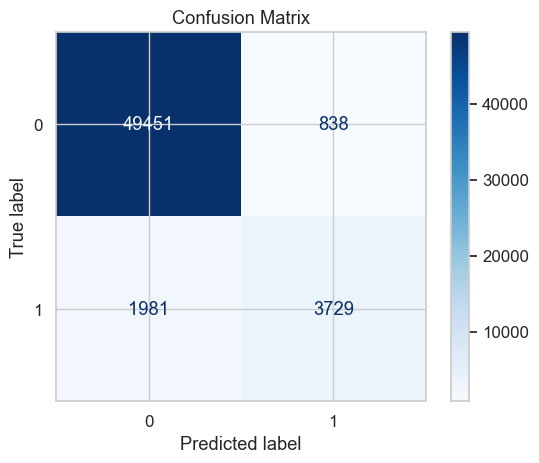

In [224]:
# Confusion matrix 
confusion = confusion_matrix(y_train, y_train_pred)
 
# Plot confusion matrix
disp = ConfusionMatrixDisplay(confusion_matrix=confusion)
disp.plot(cmap='Blues')
plt.title("Confusion Matrix")
plt.show()

#### MAKING PREDICTIONS ON THE TEST SET

In [225]:
# Accuracy for the Test Set
y_test_pred = rf3.predict(X_test_scaled)
print(f'Test accuracy : {accuracy_score(y_test, y_test_pred)}')

print()
# Print the report on test data
print(classification_report(y_test, y_test_pred))

Test accuracy : 0.9433571428571429

              precision    recall  f1-score   support

           0       0.96      0.98      0.97     12578
           1       0.77      0.63      0.69      1422

    accuracy                           0.94     14000
   macro avg       0.86      0.80      0.83     14000
weighted avg       0.94      0.94      0.94     14000



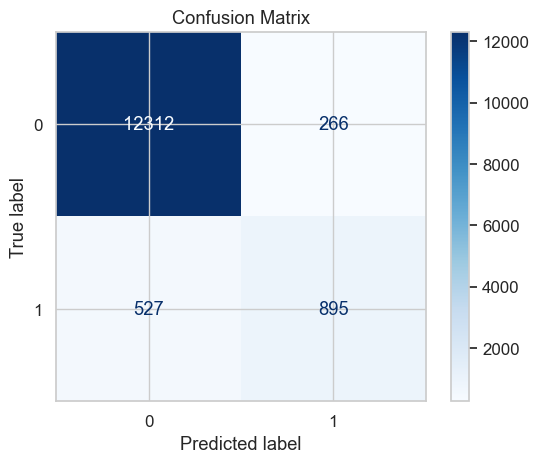

In [226]:
# Confusion matrix 
confusion = confusion_matrix(y_test, y_test_pred)

# Plot confusion matrix
disp = ConfusionMatrixDisplay(confusion_matrix=confusion)
disp.plot(cmap='Blues')
plt.title("Confusion Matrix")
plt.show()

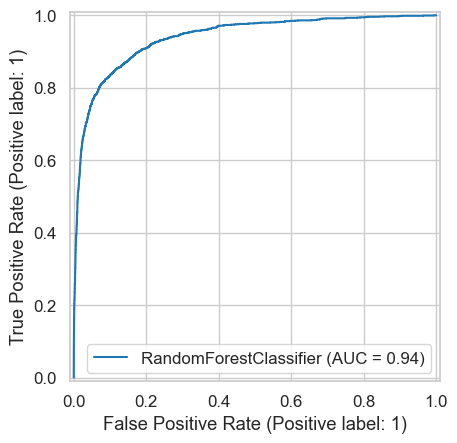

In [227]:
# ROC
RocCurveDisplay.from_estimator(rf3, X_test_scaled, y_test)
plt.show()

#### HYPERPARAMETER TUNING USING GRIDSEARCHCV

In [228]:
%%time
rf4 = RandomForestClassifier(random_state=42, oob_score=True)

# Define hyperparameters and ranges to search
params = {
    "max_depth": [2, 5, 10],
    "min_samples_leaf": [5, 10, 20],
    'n_estimators': [50, 100, 200]
}

folds = KFold(n_splits=4, shuffle=True, random_state=42)

grid_search_rf_1 = GridSearchCV(estimator=rf4,
                           param_grid=params,
                           cv=folds, n_jobs=-1,
                           verbose=3, scoring="accuracy", return_train_score=True)

# Perform gridsearch
grid_search_rf_1.fit(X_train_scaled, y_train)

Fitting 4 folds for each of 27 candidates, totalling 108 fits
CPU times: total: 25.9 s
Wall time: 6min 51s


GridSearchCV(cv=KFold(n_splits=4, random_state=42, shuffle=True),
             estimator=RandomForestClassifier(oob_score=True, random_state=42),
             n_jobs=-1,
             param_grid={'max_depth': [2, 5, 10],
                         'min_samples_leaf': [5, 10, 20],
                         'n_estimators': [50, 100, 200]},
             return_train_score=True, scoring='accuracy', verbose=3)

In [229]:
print("Best parameters found: ", grid_search_rf_1.best_params_)
print("Best cross-validation accuracy: {:.2f}".format(grid_search_rf_1.best_score_))

rf_clf = grid_search_rf_1.best_estimator_
print("Best Model:", rf_clf) 

Best parameters found:  {'max_depth': 10, 'min_samples_leaf': 10, 'n_estimators': 100}
Best cross-validation accuracy: 0.94
Best Model: RandomForestClassifier(max_depth=10, min_samples_leaf=10, oob_score=True,
                       random_state=42)


In [230]:
# Get the OOB score
print("OOB Score:", rf_clf.oob_score_)

OOB Score: 0.9418203896498152


In [231]:
# Accuracy for the Train Set
y_train_pred = rf_clf.predict(X_train_scaled)
print(f'Train accuracy : {accuracy_score(y_train, y_train_pred)}')

print()
# Print the report on train data
print(classification_report(y_train, y_train_pred))

Train accuracy : 0.9443918641404311

              precision    recall  f1-score   support

           0       0.96      0.98      0.97     50289
           1       0.79      0.61      0.69      5710

    accuracy                           0.94     55999
   macro avg       0.88      0.80      0.83     55999
weighted avg       0.94      0.94      0.94     55999



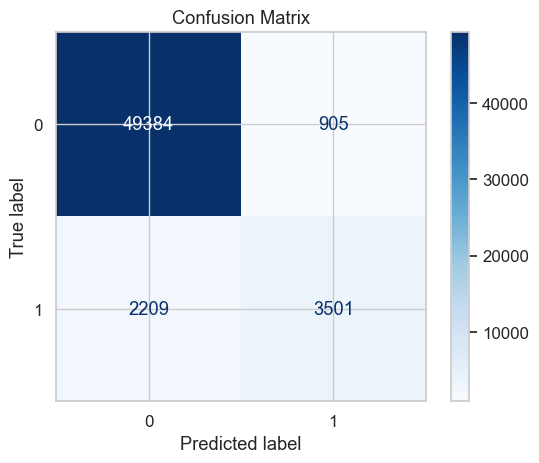

In [232]:
# Confusion matrix 
confusion = confusion_matrix(y_train, y_train_pred)

# Plot confusion matrix
disp = ConfusionMatrixDisplay(confusion_matrix=confusion)
disp.plot(cmap='Blues')
plt.title("Confusion Matrix")
plt.show()

#### MAKING PREDICTIONS ON THE TEST SET

In [233]:
# Accuracy for the Test Set
y_test_pred = rf_clf.predict(X_test_scaled)
print(f'Test accuracy : {accuracy_score(y_test, y_test_pred)}')

print()
# Print the report on test data
print(classification_report(y_test, y_test_pred))

Test accuracy : 0.9429285714285714

              precision    recall  f1-score   support

           0       0.96      0.98      0.97     12578
           1       0.77      0.62      0.69      1422

    accuracy                           0.94     14000
   macro avg       0.86      0.80      0.83     14000
weighted avg       0.94      0.94      0.94     14000



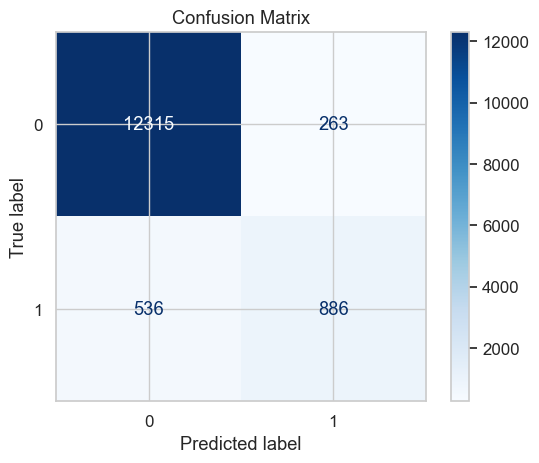

In [234]:
# Confusion matrix 
confusion = confusion_matrix(y_test, y_test_pred)

# Plot confusion matrix
disp = ConfusionMatrixDisplay(confusion_matrix=confusion)
disp.plot(cmap='Blues')
plt.title("Confusion Matrix")
plt.show()

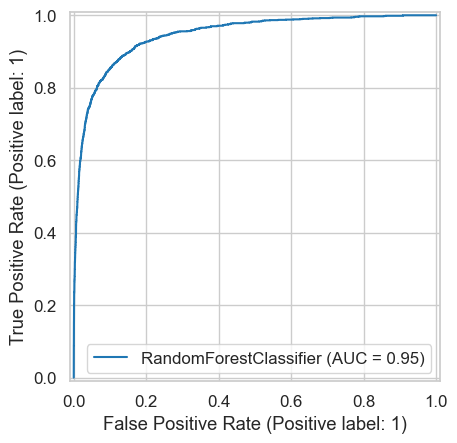

In [235]:
# ROC
RocCurveDisplay.from_estimator(rf_clf, X_test_scaled, y_test)
plt.show()

In [236]:
print(f"{'Precision Score:':<20} {precision_score(y_test, y_test_pred)}")
print(f"{'Recall Score:':<20} {recall_score(y_test, y_test_pred)}")

Precision Score:     0.7711053089643168
Recall Score:        0.6230661040787623


In [237]:
TP = confusion[1,1] # true positive 
TN = confusion[0,0] # true negatives
FP = confusion[0,1] # false positives
FN = confusion[1,0] # false negatives

In [238]:
# Sensitivity, Specificity, False Positive Rate, Positive Predictive Rate, Negative Predictive Rate
print("Performance Metrics:")
print("---------------------")
print(f"{'Sensitivity (True Positive Rate):':<40} {TP / float(TP+FN)}")
print(f"{'Specificity (True Negative Rate):':<40} {TN / float(TN+FP)}")
print(f"{'False Positive Rate (FPR):':<40} {FP/ float(TN+FP)}")
print(f"{'Positive Predictive Rate (Precision):':<40} {TP/ float(TP+FP)}")
print(f"{'Negative Predictive Rate (NPV):':<40} {TN / float(TN+ FN)}")

Performance Metrics:
---------------------
Sensitivity (True Positive Rate):        0.6230661040787623
Specificity (True Negative Rate):        0.9790904754332962
False Positive Rate (FPR):               0.02090952456670377
Positive Predictive Rate (Precision):    0.7711053089643168
Negative Predictive Rate (NPV):          0.9582911835654813


#### PREDICTING FEATURE IMPORTANCES

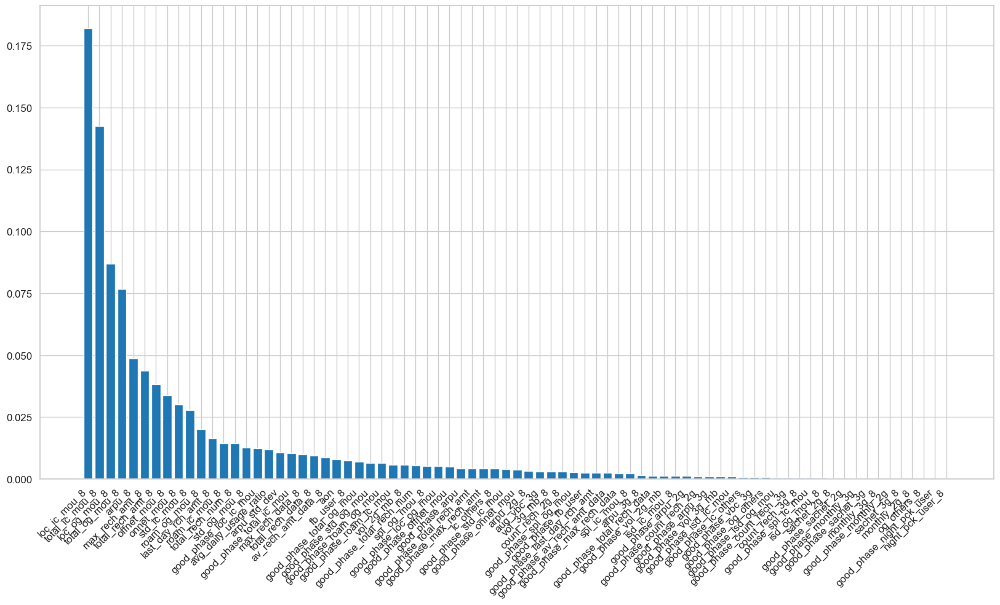

In [239]:
feature_importances = pd.DataFrame({'col':final_vars, 'importance':rf_clf.feature_importances_})

feature_importances.sort_values(by='importance', ascending=False, inplace=True)

plt.figure(figsize=(20,10))
plt.xticks(rotation=45, ha='right')
plt.bar(feature_importances['col'], feature_importances['importance'])
plt.show()

In [240]:
print('Top 10 features:')
print('-----------------------------------')
print(feature_importances[:10])

Top 10 features:
-----------------------------------
                 col  importance
11      loc_ic_mou_8    0.181991
13    total_ic_mou_8    0.142559
5       loc_og_mou_8    0.086925
10    total_og_mou_8    0.076635
0             arpu_8    0.048752
19    max_rech_amt_8    0.043654
18  total_rech_amt_8    0.038191
2       offnet_mou_8    0.033888
1        onnet_mou_8    0.029988
12      std_ic_mou_8    0.027819


#### SUMMARY

In [241]:
train_accuracies.append(accuracy_score(y_train, y_train_pred))
test_accuracies.append(accuracy_score(y_test, y_test_pred))
print(f"{'Accuracy Score for Train Set:':<40 } {accuracy_score(y_train, y_train_pred)}")
print(f"{'Accuracy Score for Test Set:':<40} {accuracy_score(y_test, y_test_pred)}")

Accuracy Score for Train Set:            0.9443918641404311
Accuracy Score for Test Set:             0.9429285714285714


##### We got an accuracy of ~94.4% for the train set and ~94.3% for the test set, which implies that the model is neither overfitted nor underfitted and is good at predicting unseen data. This Model is better than the one built with PCA.

## 7.4 ADABOOST

### 7.4.1 ADABOOST WITH PCA

In [242]:
%%time
adaboost_pca = AdaBoostClassifier(
    estimator=DecisionTreeClassifier(max_depth=2),
    n_estimators=200,
    learning_rate=0.05,
    random_state=42
)

adaboost_pca.fit(X_train_pca, y_train)

CPU times: total: 5min 55s
Wall time: 6min 11s


AdaBoostClassifier(estimator=DecisionTreeClassifier(max_depth=2),
                   learning_rate=0.05, n_estimators=200, random_state=42)

In [243]:
# Accuracy for the Train Set
y_train_pred = adaboost_pca.predict(X_train_pca)
print(f'Train accuracy : {accuracy_score(y_train, y_train_pred)}')

print()
# Print the report on train data
print(classification_report(y_train, y_train_pred))

Train accuracy : 0.9156949231236272

              precision    recall  f1-score   support

           0       0.93      0.99      0.95     50289
           1       0.70      0.30      0.42      5710

    accuracy                           0.92     55999
   macro avg       0.81      0.64      0.69     55999
weighted avg       0.90      0.92      0.90     55999



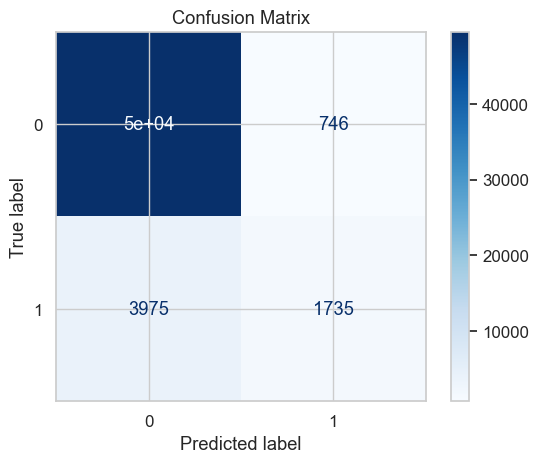

In [244]:
# Confusion matrix 
confusion = confusion_matrix(y_train, y_train_pred)
 
# Plot confusion matrix
disp = ConfusionMatrixDisplay(confusion_matrix=confusion)
disp.plot(cmap='Blues')
plt.title("Confusion Matrix")
plt.show()

#### MAKING PREDICTIONS ON THE TEST SET

In [245]:
# Accuracy for the Test Set
y_test_pred = adaboost_pca.predict(X_test_pca)
print(f'Test accuracy : {accuracy_score(y_test, y_test_pred)}')

print()
# Print the report on test data
print(classification_report(y_test, y_test_pred))

Test accuracy : 0.9132857142857143

              precision    recall  f1-score   support

           0       0.92      0.99      0.95     12578
           1       0.68      0.27      0.39      1422

    accuracy                           0.91     14000
   macro avg       0.80      0.63      0.67     14000
weighted avg       0.90      0.91      0.90     14000



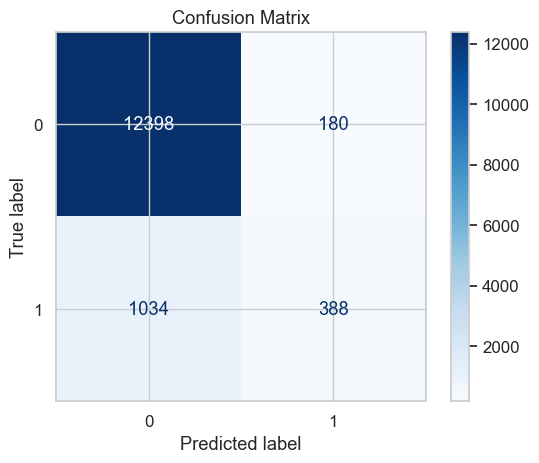

In [246]:
# Confusion matrix 
confusion = confusion_matrix(y_test, y_test_pred)

# Plot confusion matrix
disp = ConfusionMatrixDisplay(confusion_matrix=confusion)
disp.plot(cmap='Blues')
plt.title("Confusion Matrix")
plt.show()

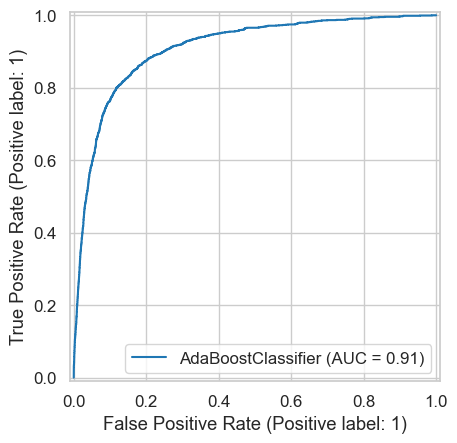

In [247]:
# ROC
RocCurveDisplay.from_estimator(adaboost_pca, X_test_pca, y_test)
plt.show()

In [248]:
print(f"{'Precision Score:':<20} {precision_score(y_test, y_test_pred)}")
print(f"{'Recall Score:':<20} {recall_score(y_test, y_test_pred)}")

Precision Score:     0.6830985915492958
Recall Score:        0.27285513361462727


In [249]:
TP = confusion[1,1] # true positive 
TN = confusion[0,0] # true negatives
FP = confusion[0,1] # false positives
FN = confusion[1,0] # false negatives

In [250]:
# Sensitivity, Specificity, False Positive Rate, Positive Predictive Rate, Negative Predictive Rate
print("Performance Metrics:")
print("---------------------")
print(f"{'Sensitivity (True Positive Rate):':<40} {TP / float(TP+FN)}")
print(f"{'Specificity (True Negative Rate):':<40} {TN / float(TN+FP)}")
print(f"{'False Positive Rate (FPR):':<40} {FP/ float(TN+FP)}")
print(f"{'Positive Predictive Rate (Precision):':<40} {TP/ float(TP+FP)}")
print(f"{'Negative Predictive Rate (NPV):':<40} {TN / float(TN+ FN)}")

Performance Metrics:
---------------------
Sensitivity (True Positive Rate):        0.27285513361462727
Specificity (True Negative Rate):        0.98568929877564
False Positive Rate (FPR):               0.014310701224359994
Positive Predictive Rate (Precision):    0.6830985915492958
Negative Predictive Rate (NPV):          0.9230196545562835


#### SUMMARY

In [251]:
train_accuracies.append(accuracy_score(y_train, y_train_pred))
test_accuracies.append(accuracy_score(y_test, y_test_pred))
print(f"{'Accuracy Score for Train Set:':<40} {accuracy_score(y_train, y_train_pred)}")
print(f"{'Accuracy Score for Test Set:':<40} {accuracy_score(y_test, y_test_pred)}")

Accuracy Score for Train Set:            0.9156949231236272
Accuracy Score for Test Set:             0.9132857142857143


##### We got an accuracy of ~91.6% for the train set and ~91.3% for the test set, which implies that the model is neither overfitted nor underfitted, but the model is good at predicting unseen data.

### 7.4.2 ADABOOST WITHOUT PCA

In [252]:
%%time
adaboost = AdaBoostClassifier(
    estimator=DecisionTreeClassifier(max_depth=2),
    n_estimators=200,
    learning_rate=0.05,
    algorithm="SAMME.R",
    random_state=42
)

adaboost.fit(X_train_scaled, y_train)

CPU times: total: 2min 13s
Wall time: 2min 21s


AdaBoostClassifier(estimator=DecisionTreeClassifier(max_depth=2),
                   learning_rate=0.05, n_estimators=200, random_state=42)

In [253]:
# Accuracy for the Train Set
y_train_pred = adaboost.predict(X_train_scaled)
print(f'Train accuracy : {accuracy_score(y_train, y_train_pred)}')

print()
# Print the report on train data
print(classification_report(y_train, y_train_pred))

Train accuracy : 0.9408382292540938

              precision    recall  f1-score   support

           0       0.96      0.98      0.97     50289
           1       0.76      0.61      0.68      5710

    accuracy                           0.94     55999
   macro avg       0.86      0.79      0.82     55999
weighted avg       0.94      0.94      0.94     55999



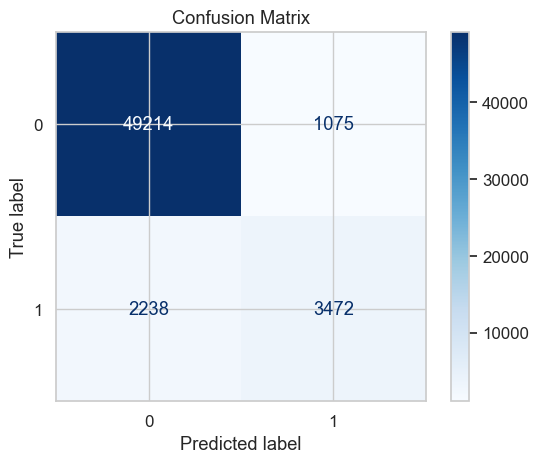

In [254]:
# Confusion matrix 
confusion = confusion_matrix(y_train, y_train_pred)
 
# Plot confusion matrix
disp = ConfusionMatrixDisplay(confusion_matrix=confusion)
disp.plot(cmap='Blues')
plt.title("Confusion Matrix")
plt.show()

#### MAKING PREDICTIONS ON THE TEST SET

In [255]:
# Accuracy for the Test Set
y_test_pred = adaboost.predict(X_test_scaled)
print(f'Test accuracy : {accuracy_score(y_test, y_test_pred)}')

print()
# Print the report on test data
print(classification_report(y_test, y_test_pred))

Test accuracy : 0.9415714285714286

              precision    recall  f1-score   support

           0       0.96      0.98      0.97     12578
           1       0.76      0.63      0.69      1422

    accuracy                           0.94     14000
   macro avg       0.86      0.80      0.83     14000
weighted avg       0.94      0.94      0.94     14000



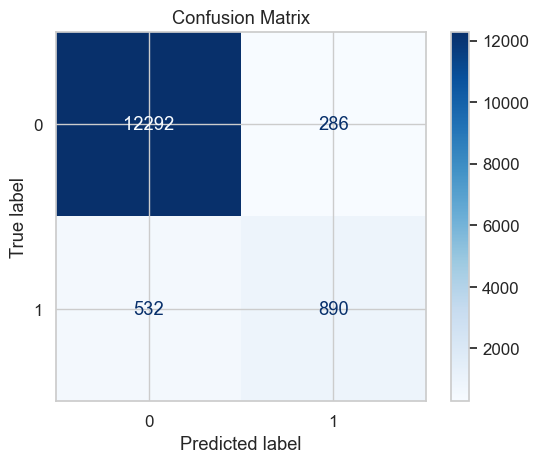

In [256]:
# Confusion matrix 
confusion = confusion_matrix(y_test, y_test_pred)

# Plot confusion matrix
disp = ConfusionMatrixDisplay(confusion_matrix=confusion)
disp.plot(cmap='Blues')
plt.title("Confusion Matrix")
plt.show()

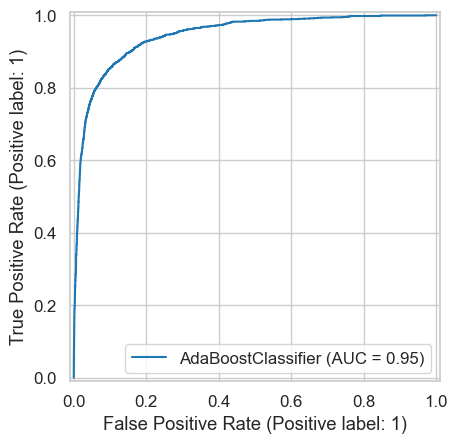

In [257]:
# ROC
RocCurveDisplay.from_estimator(adaboost, X_test_scaled, y_test)
plt.show()

In [258]:
print(f"{'Precision Score:':<20} {precision_score(y_test, y_test_pred)}")
print(f"{'Recall Score:':<20} {recall_score(y_test, y_test_pred)}")

Precision Score:     0.7568027210884354
Recall Score:        0.6258790436005626


In [259]:
TP = confusion[1,1] # true positive 
TN = confusion[0,0] # true negatives
FP = confusion[0,1] # false positives
FN = confusion[1,0] # false negatives

In [260]:
# Sensitivity, Specificity, False Positive Rate, Positive Predictive Rate, Negative Predictive Rate
print("Performance Metrics:")
print("---------------------")
print(f"{'Sensitivity (True Positive Rate):':<40} {TP / float(TP+FN)}")
print(f"{'Specificity (True Negative Rate):':<40} {TN / float(TN+FP)}")
print(f"{'False Positive Rate (FPR):':<40} {FP/ float(TN+FP)}")
print(f"{'Positive Predictive Rate (Precision):':<40} {TP/ float(TP+FP)}")
print(f"{'Negative Predictive Rate (NPV):':<40} {TN / float(TN+ FN)}")

Performance Metrics:
---------------------
Sensitivity (True Positive Rate):        0.6258790436005626
Specificity (True Negative Rate):        0.9772618858324058
False Positive Rate (FPR):               0.022738114167594213
Positive Predictive Rate (Precision):    0.7568027210884354
Negative Predictive Rate (NPV):          0.9585152838427947


#### SUMMARY

In [261]:
train_accuracies.append(accuracy_score(y_train, y_train_pred))
test_accuracies.append(accuracy_score(y_test, y_test_pred))
print(f"{'Accuracy Score for Train Set:':<40} {accuracy_score(y_train, y_train_pred)}")
print(f"{'Accuracy Score for Test Set:':<40} {accuracy_score(y_test, y_test_pred)}")

Accuracy Score for Train Set:            0.9408382292540938
Accuracy Score for Test Set:             0.9415714285714286


##### We got an accuracy of ~94.1% for the train set and ~94.2% for the test set, which implies that the model is neither overfitted nor underfitted, but the model is perfect at predicting unseen data.

## 7.5 XGBOOST

### 7.5.1 XGBOOST WITH PCA

In [262]:
# !pip install xgboost

import xgboost as xgb
from xgboost import XGBClassifier

xgb_cf1 = XGBClassifier(
    n_estimators=300,
    learning_rate=0.05,
    max_depth=6,
    subsample=0.8,
    colsample_bytree=0.7,
    gamma=0.1,
    min_child_weight=10,
    scale_pos_weight=5,
    objective="binary:logistic",
    random_state=42
)
    
xgb_cf1.fit(X_train_pca, y_train)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=0.7, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=0.1, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=0.05, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=6, max_leaves=None,
              min_child_weight=10, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=300, n_jobs=None,
              num_parallel_tree=None, random_state=42, ...)

In [263]:
# Accuracy for the Train Set
y_train_pred = xgb_cf1.predict(X_train_pca)
print(f'Train accuracy : {accuracy_score(y_train, y_train_pred)}')

print()
# Print the report on train data
print(classification_report(y_train, y_train_pred))

Train accuracy : 0.9360702869694102

              precision    recall  f1-score   support

           0       0.99      0.94      0.96     50289
           1       0.63      0.92      0.75      5710

    accuracy                           0.94     55999
   macro avg       0.81      0.93      0.85     55999
weighted avg       0.95      0.94      0.94     55999



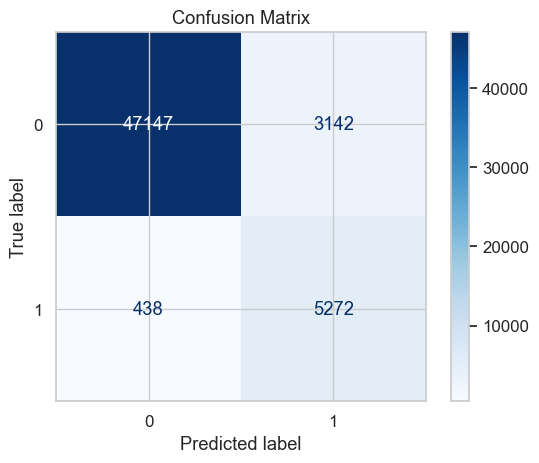

In [264]:
# Confusion matrix 
confusion = confusion_matrix(y_train, y_train_pred)
 
# Plot confusion matrix
disp = ConfusionMatrixDisplay(confusion_matrix=confusion)
disp.plot(cmap='Blues')
plt.title("Confusion Matrix")
plt.show()

#### MAKING PREDICTIONS ON THE TEST SET

In [265]:
# Accuracy for the Test Set
y_test_pred = xgb_cf1.predict(X_test_pca)
print(f'Test accuracy : {accuracy_score(y_test, y_test_pred)}')

print()
# Print the report on test data
print(classification_report(y_test, y_test_pred))

Test accuracy : 0.9097142857142857

              precision    recall  f1-score   support

           0       0.97      0.93      0.95     12578
           1       0.54      0.75      0.63      1422

    accuracy                           0.91     14000
   macro avg       0.76      0.84      0.79     14000
weighted avg       0.93      0.91      0.92     14000



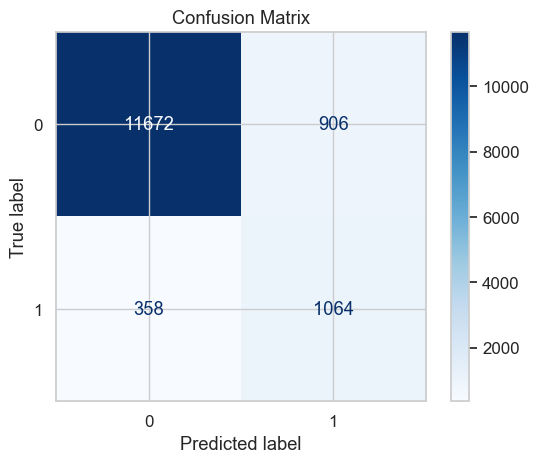

In [266]:
# Confusion matrix 
confusion = confusion_matrix(y_test, y_test_pred)

# Plot confusion matrix
disp = ConfusionMatrixDisplay(confusion_matrix=confusion)
disp.plot(cmap='Blues')
plt.title("Confusion Matrix")
plt.show()

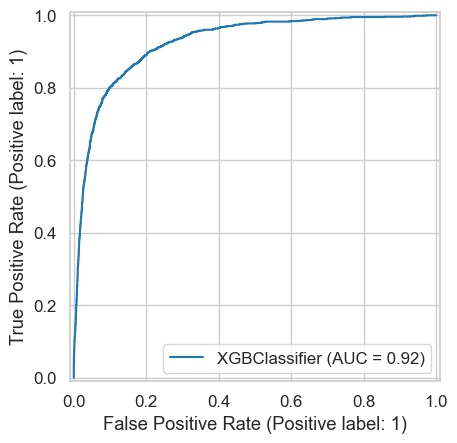

In [267]:
# ROC
RocCurveDisplay.from_estimator(xgb_cf1, X_test_pca, y_test)
plt.show()

#### HYPERPARAMETER TUNING USING RANDOMIZEDSEARCHCV

In [268]:
%%time
xgb_cf2 = XGBClassifier(random_state=42, objective = 'binary:logistic')

# Define hyperparameters and ranges to search
params = {
    'n_estimators': [100, 200, 300],
    'learning_rate': [0.05, 0.1],
    'max_depth': [5, 6, 7, 8, 9],
    'min_child_weight': [5, 7, 9, 10],
    'gamma': [0.1],
    'subsample': [0.8],
    'colsample_bytree': [0.6],
    'scale_pos_weight': [1]
}

folds = KFold(n_splits=3, shuffle=True, random_state=42)

random_search = RandomizedSearchCV(estimator=xgb_cf2, 
                            param_distributions=params, 
                            scoring='accuracy', n_iter=60, n_jobs=-1,
                            cv=folds, verbose=3, return_train_score=True, random_state=42)

# Perform gridsearch
random_search.fit(X_train_pca, y_train)

Fitting 3 folds for each of 60 candidates, totalling 180 fits
CPU times: total: 33.5 s
Wall time: 7min 51s


RandomizedSearchCV(cv=KFold(n_splits=3, random_state=42, shuffle=True),
                   estimator=XGBClassifier(base_score=None, booster=None,
                                           callbacks=None,
                                           colsample_bylevel=None,
                                           colsample_bynode=None,
                                           colsample_bytree=None, device=None,
                                           early_stopping_rounds=None,
                                           enable_categorical=False,
                                           eval_metric=None, feature_types=None,
                                           gamma=None, grow_policy=None,
                                           importance_type=No...
                                           n_estimators=None, n_jobs=None,
                                           num_parallel_tree=None,
                                           random_state=42, ...),
                   n_iter=60, n_jobs=-1,
                   param_distributions={'colsample_bytree': [0.6],
                                        'gamma': [0.1],
                                        'learning_rate': [0.05, 0.1],
                                        'max_depth': [5, 6, 7, 8, 9],
                                        'min_child_weight': [5, 7, 9, 10],
                                        'n_estimators': [100, 200, 300],
                                        'scale_pos_weight': [1],
                                        'subsample': [0.8]},
                   random_state=42, return_train_score=True, scoring='accuracy',
                   verbose=3)

In [269]:
print("Best parameters found: ", random_search.best_params_)
print("Best cross-validation accuracy: {:.2f}".format(random_search.best_score_))

xgb_clf_pca = random_search.best_estimator_
print("Best Model:", xgb_clf_pca)

Best parameters found:  {'subsample': 0.8, 'scale_pos_weight': 1, 'n_estimators': 300, 'min_child_weight': 10, 'max_depth': 5, 'learning_rate': 0.05, 'gamma': 0.1, 'colsample_bytree': 0.6}
Best cross-validation accuracy: 0.93
Best Model: XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=0.6, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=0.1, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=0.05, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=5, max_leaves=None,
              min_child_weight=10, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=300, n_jobs=None,
              num_parallel_tree=None, random_state=42, ...)


In [270]:
# Accuracy for the Train Set
y_train_pred = xgb_clf_pca.predict(X_train_pca)
print(f'Train accuracy : {accuracy_score(y_train, y_train_pred)}')

print()
# Print the report on train data
print(classification_report(y_train, y_train_pred))

Train accuracy : 0.9455525991535563

              precision    recall  f1-score   support

           0       0.96      0.98      0.97     50289
           1       0.80      0.62      0.70      5710

    accuracy                           0.95     55999
   macro avg       0.88      0.80      0.83     55999
weighted avg       0.94      0.95      0.94     55999



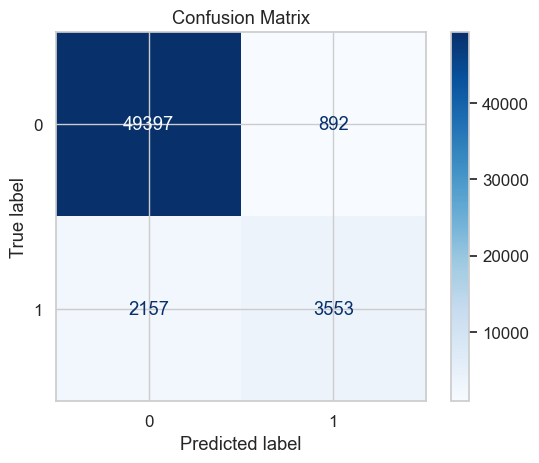

In [271]:
# Confusion matrix 
confusion = confusion_matrix(y_train, y_train_pred)

# Plot confusion matrix
disp = ConfusionMatrixDisplay(confusion_matrix=confusion)
disp.plot(cmap='Blues')
plt.title("Confusion Matrix")
plt.show()

#### MAKING PREDICTIONS ON THE TEST SET

In [272]:
# Accuracy for the Test Set
y_test_pred = xgb_clf_pca.predict(X_test_pca)
print(f'Test accuracy : {accuracy_score(y_test, y_test_pred)}')

print()
# Print the report on test data
print(classification_report(y_test, y_test_pred))

Test accuracy : 0.9276428571428571

              precision    recall  f1-score   support

           0       0.95      0.97      0.96     12578
           1       0.69      0.52      0.59      1422

    accuracy                           0.93     14000
   macro avg       0.82      0.75      0.78     14000
weighted avg       0.92      0.93      0.92     14000



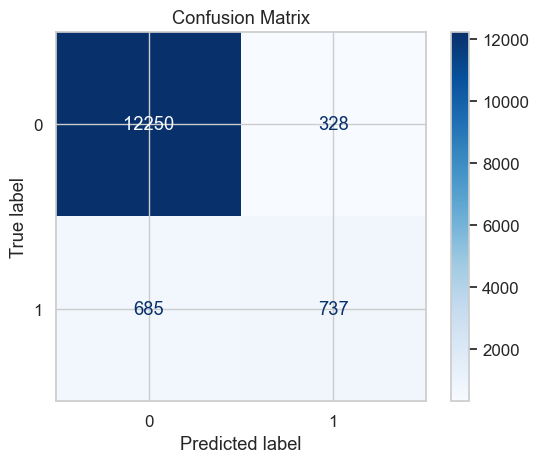

In [273]:
# Confusion matrix 
confusion = confusion_matrix(y_test, y_test_pred)

# Plot confusion matrix
disp = ConfusionMatrixDisplay(confusion_matrix=confusion)
disp.plot(cmap='Blues')
plt.title("Confusion Matrix")
plt.show()

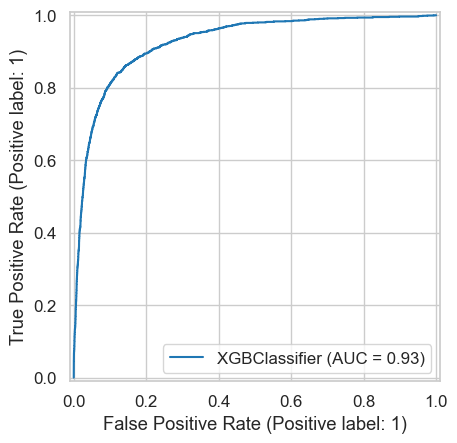

In [274]:
# ROC
RocCurveDisplay.from_estimator(xgb_clf_pca, X_test_pca, y_test)
plt.show()

In [275]:
print(f"{'Precision Score:':<20} {precision_score(y_test, y_test_pred)}")
print(f"{'Recall Score:':<20} {recall_score(y_test, y_test_pred)}")

Precision Score:     0.692018779342723
Recall Score:        0.5182841068917018


In [276]:
TP = confusion[1,1] # true positive 
TN = confusion[0,0] # true negatives
FP = confusion[0,1] # false positives
FN = confusion[1,0] # false negatives

In [277]:
# Sensitivity, Specificity, False Positive Rate, Positive Predictive Rate, Negative Predictive Rate
print("Performance Metrics:")
print("---------------------")
print(f"{'Sensitivity (True Positive Rate):':<40} {TP / float(TP+FN)}")
print(f"{'Specificity (True Negative Rate):':<40} {TN / float(TN+FP)}")
print(f"{'False Positive Rate (FPR):':<40} {FP/ float(TN+FP)}")
print(f"{'Positive Predictive Rate (Precision):':<40} {TP/ float(TP+FP)}")
print(f"{'Negative Predictive Rate (NPV):':<40} {TN / float(TN+ FN)}")

Performance Metrics:
---------------------
Sensitivity (True Positive Rate):        0.5182841068917018
Specificity (True Negative Rate):        0.9739227222133885
False Positive Rate (FPR):               0.026077277786611543
Positive Predictive Rate (Precision):    0.692018779342723
Negative Predictive Rate (NPV):          0.9470429068419018


#### SUMMARY

In [278]:
train_accuracies.append(accuracy_score(y_train, y_train_pred))
test_accuracies.append(accuracy_score(y_test, y_test_pred))
print(f"{'Accuracy Score for Train Set:':<40} {accuracy_score(y_train, y_train_pred)}")
print(f"{'Accuracy Score for Test Set:':<40} {accuracy_score(y_test, y_test_pred)}")

Accuracy Score for Train Set:            0.9455525991535563
Accuracy Score for Test Set:             0.9276428571428571


##### We got an accuracy of ~94.6% for the train set and ~92.8% for the test set, which implies that the model is neither overfitted nor underfitted and is good at predicting unseen data.

### 7.5.2 XGBOOST WITHOUT PCA

In [279]:
xgb_cf3 = XGBClassifier(
    n_estimators=300,
    learning_rate=1.0,
    max_depth=6,
    subsample=0.8,
    colsample_bytree=0.7,
    gamma=0.1,
    min_child_weight=10,
    scale_pos_weight=5,
    objective="binary:logistic",
    random_state=42
)
    
xgb_cf3.fit(X_train_scaled, y_train)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=0.7, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=0.1, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=1.0, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=6, max_leaves=None,
              min_child_weight=10, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=300, n_jobs=None,
              num_parallel_tree=None, random_state=42, ...)

In [280]:
# Accuracy for the Train Set
y_train_pred = xgb_cf3.predict(X_train_scaled)
print(f'Train accuracy : {accuracy_score(y_train, y_train_pred)}')

print()
# Print the report on train data
print(classification_report(y_train, y_train_pred))

Train accuracy : 0.9994821336095288

              precision    recall  f1-score   support

           0       1.00      1.00      1.00     50289
           1       0.99      1.00      1.00      5710

    accuracy                           1.00     55999
   macro avg       1.00      1.00      1.00     55999
weighted avg       1.00      1.00      1.00     55999



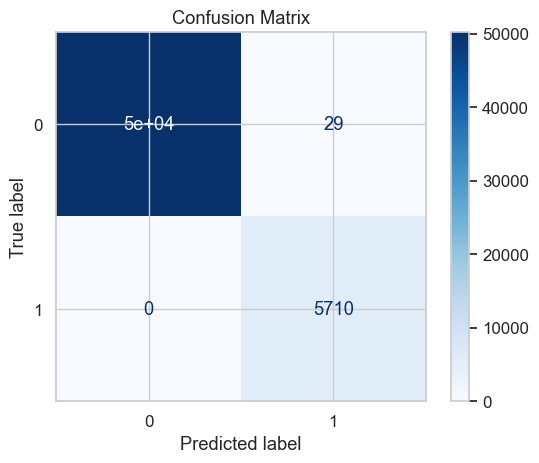

In [281]:
# Confusion matrix 
confusion = confusion_matrix(y_train, y_train_pred)
 
# Plot confusion matrix
disp = ConfusionMatrixDisplay(confusion_matrix=confusion)
disp.plot(cmap='Blues')
plt.title("Confusion Matrix")
plt.show()

#### MAKING PREDICTIONS ON THE TEST SET

In [282]:
# Accuracy for the Test Set
y_test_pred = xgb_cf3.predict(X_test_scaled)
print(f'Test accuracy : {accuracy_score(y_test, y_test_pred)}')

print()
# Print the report on test data
print(classification_report(y_test, y_test_pred))

Test accuracy : 0.925

              precision    recall  f1-score   support

           0       0.96      0.96      0.96     12578
           1       0.63      0.65      0.64      1422

    accuracy                           0.93     14000
   macro avg       0.79      0.80      0.80     14000
weighted avg       0.93      0.93      0.93     14000



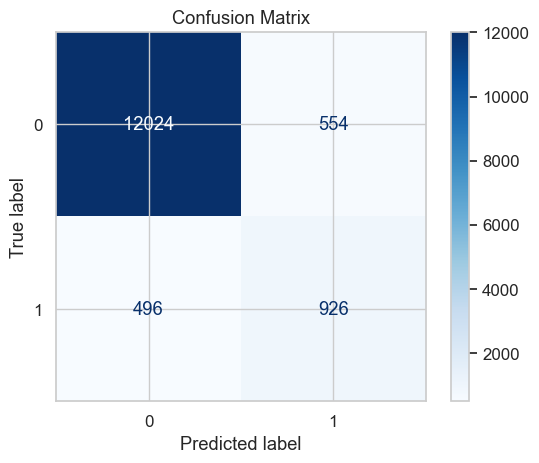

In [283]:
# Confusion matrix 
confusion = confusion_matrix(y_test, y_test_pred)

# Plot confusion matrix
disp = ConfusionMatrixDisplay(confusion_matrix=confusion)
disp.plot(cmap='Blues')
plt.title("Confusion Matrix")
plt.show()

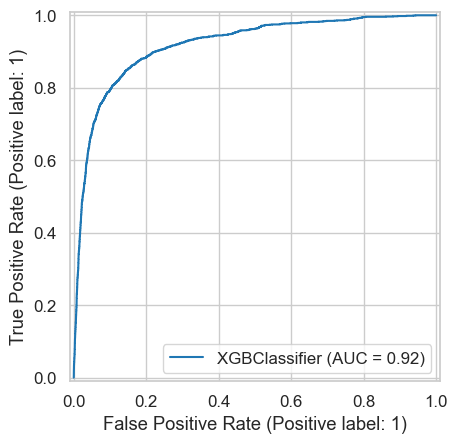

In [284]:
# ROC
RocCurveDisplay.from_estimator(xgb_cf3, X_test_scaled, y_test)
plt.show()

#### HYPERPARAMETER TUNING USING RANDOMIZEDSEARCHCV

In [285]:
%%time
xgb_cf4 = XGBClassifier(random_state=42, objective = 'binary:logistic')

# Define hyperparameters and ranges to search
params = {
    'n_estimators': [100, 200, 300],
    'learning_rate': [0.05, 0.1],
    'max_depth': [5, 6, 7, 8, 9],
    'min_child_weight': [5, 7, 9, 10],
    'gamma': [0.1],
    'subsample': [0.8],
    'colsample_bytree': [0.6],
    'scale_pos_weight': [1]
}

folds = KFold(n_splits=3, shuffle=True, random_state=42)

random_search_1 = RandomizedSearchCV(estimator=xgb_cf4, 
                            param_distributions=params, 
                            scoring='accuracy', n_iter=60, n_jobs=-1,
                            cv=folds, verbose=3, return_train_score=True, random_state=42)

# Perform RandomizedSearch
random_search_1.fit(X_train_scaled, y_train)

Fitting 3 folds for each of 60 candidates, totalling 180 fits
CPU times: total: 13 s
Wall time: 5min 2s


RandomizedSearchCV(cv=KFold(n_splits=3, random_state=42, shuffle=True),
                   estimator=XGBClassifier(base_score=None, booster=None,
                                           callbacks=None,
                                           colsample_bylevel=None,
                                           colsample_bynode=None,
                                           colsample_bytree=None, device=None,
                                           early_stopping_rounds=None,
                                           enable_categorical=False,
                                           eval_metric=None, feature_types=None,
                                           gamma=None, grow_policy=None,
                                           importance_type=No...
                                           n_estimators=None, n_jobs=None,
                                           num_parallel_tree=None,
                                           random_state=42, ...),
                   n_iter=60, n_jobs=-1,
                   param_distributions={'colsample_bytree': [0.6],
                                        'gamma': [0.1],
                                        'learning_rate': [0.05, 0.1],
                                        'max_depth': [5, 6, 7, 8, 9],
                                        'min_child_weight': [5, 7, 9, 10],
                                        'n_estimators': [100, 200, 300],
                                        'scale_pos_weight': [1],
                                        'subsample': [0.8]},
                   random_state=42, return_train_score=True, scoring='accuracy',
                   verbose=3)

In [286]:
print("Best parameters found: ", random_search_1.best_params_)
print("Best cross-validation accuracy: {:.2f}".format(random_search_1.best_score_))

xgb_clf = random_search_1.best_estimator_
print("Best Model:", xgb_clf)

Best parameters found:  {'subsample': 0.8, 'scale_pos_weight': 1, 'n_estimators': 100, 'min_child_weight': 9, 'max_depth': 5, 'learning_rate': 0.1, 'gamma': 0.1, 'colsample_bytree': 0.6}
Best cross-validation accuracy: 0.94
Best Model: XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=0.6, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=0.1, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=0.1, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=5, max_leaves=None,
              min_child_weight=9, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=100, n_jobs=None,
              num_parallel_tree=None, random_state=42, ...)


In [287]:
# Accuracy for the Train Set
y_train_pred = xgb_clf.predict(X_train_scaled)
print(f'Train accuracy : {accuracy_score(y_train, y_train_pred)}')

print()
# Print the report on train dat a
print(classification_report(y_train, y_train_pred))

Train accuracy : 0.946874051322345

              precision    recall  f1-score   support

           0       0.96      0.98      0.97     50289
           1       0.78      0.67      0.72      5710

    accuracy                           0.95     55999
   macro avg       0.87      0.82      0.84     55999
weighted avg       0.94      0.95      0.94     55999



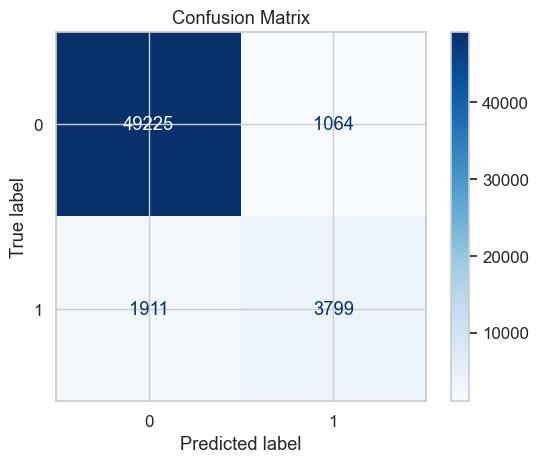

In [288]:
# Confusion matrix 
confusion = confusion_matrix(y_train, y_train_pred)

# Plot confusion matrix
disp = ConfusionMatrixDisplay(confusion_matrix=confusion)
disp.plot(cmap='Blues')
plt.title("Confusion Matrix")
plt.show()

#### MAKING PREDICTIONS ON THE TEST SET

In [289]:
# Accuracy for the Test Set
y_test_pred = xgb_clf.predict(X_test_scaled)
print(f'Test accuracy : {accuracy_score(y_test, y_test_pred)}')

print()
# Print the report on test data
print(classification_report(y_test, y_test_pred))

Test accuracy : 0.9425714285714286

              precision    recall  f1-score   support

           0       0.96      0.97      0.97     12578
           1       0.75      0.66      0.70      1422

    accuracy                           0.94     14000
   macro avg       0.85      0.82      0.83     14000
weighted avg       0.94      0.94      0.94     14000



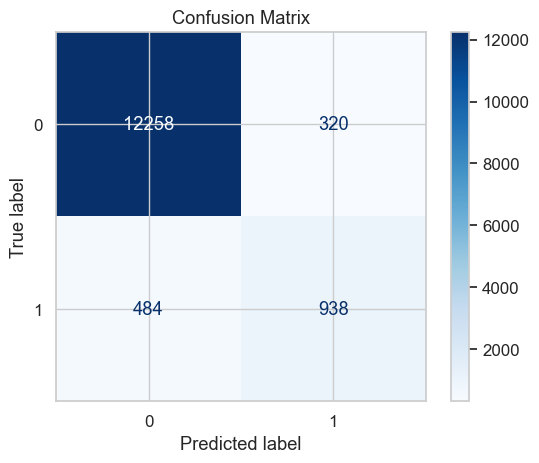

In [290]:
# Confusion matrix 
confusion = confusion_matrix(y_test, y_test_pred)

# Plot confusion matrix
disp = ConfusionMatrixDisplay(confusion_matrix=confusion)
disp.plot(cmap='Blues')
plt.title("Confusion Matrix")
plt.show()

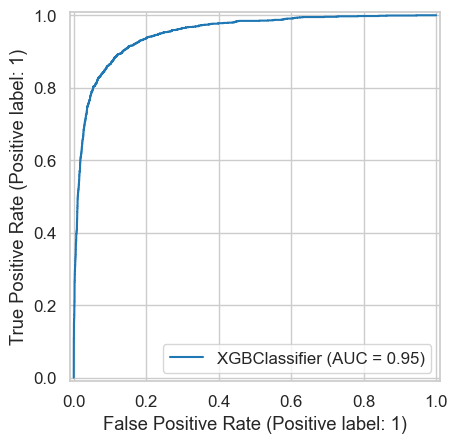

In [291]:
# ROC
RocCurveDisplay.from_estimator(xgb_clf, X_test_scaled, y_test)
plt.show()

In [292]:
print(f"{'Precision Score:':<20} {precision_score(y_test, y_test_pred)}")
print(f"{'Recall Score:':<20} {recall_score(y_test, y_test_pred)}")

Precision Score:     0.7456279809220986
Recall Score:        0.659634317862166


In [293]:
TP = confusion[1,1] # true positive 
TN = confusion[0,0] # true negatives
FP = confusion[0,1] # false positives
FN = confusion[1,0] # false negatives

In [294]:
# Sensitivity, Specificity, False Positive Rate, Positive Predictive Rate, Negative Predictive Rate
print("Performance Metrics:")
print("---------------------")
print(f"{'Sensitivity (True Positive Rate):':<40} {TP / float(TP+FN)}")
print(f"{'Specificity (True Negative Rate):':<40} {TN / float(TN+FP)}")
print(f"{'False Positive Rate (FPR):':<40} {FP/ float(TN+FP)}")
print(f"{'Positive Predictive Rate (Precision):':<40} {TP/ float(TP+FP)}")
print(f"{'Negative Predictive Rate (NPV):':<40} {TN / float(TN+ FN)}")

Performance Metrics:
---------------------
Sensitivity (True Positive Rate):        0.659634317862166
Specificity (True Negative Rate):        0.9745587533789156
False Positive Rate (FPR):               0.025441246621084435
Positive Predictive Rate (Precision):    0.7456279809220986
Negative Predictive Rate (NPV):          0.9620153822005965


#### FEATURE IMPORTANCES

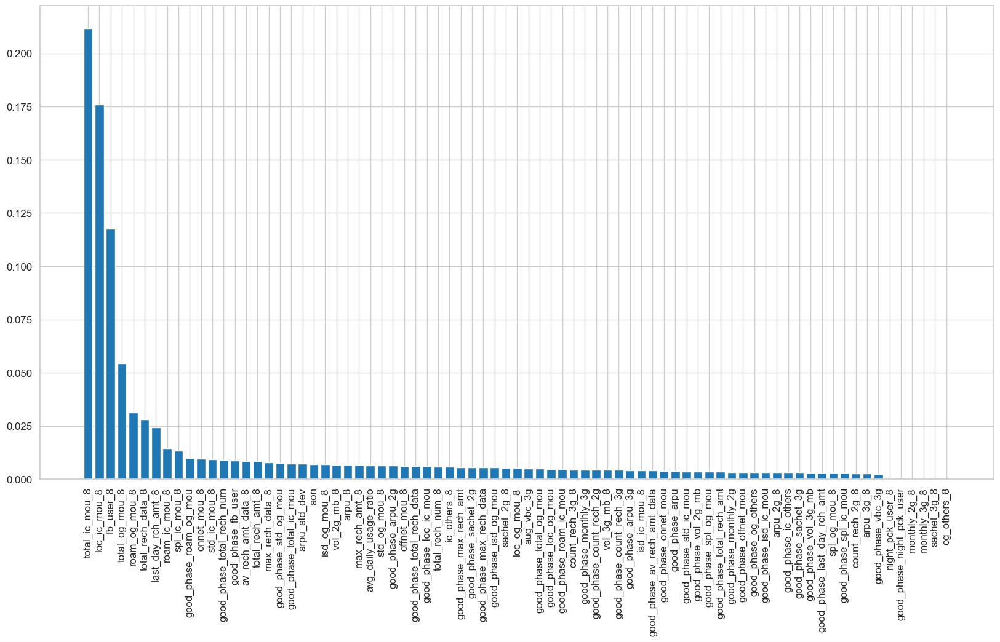

In [317]:
feature_importances = pd.DataFrame({'col':final_vars, 'importance':xgb_clf.feature_importances_})

feature_importances.sort_values(by='importance', ascending=False, inplace=True)

plt.figure(figsize=(20,10))
plt.xticks(rotation=90, ha='center')
plt.bar(feature_importances['col'], feature_importances['importance'])
plt.show()

In [296]:
print('Top 10 features:')
print('-----------------------------------')
print(feature_importances[:10])

Top 10 features:
-----------------------------------
                       col  importance
13          total_ic_mou_8    0.211790
11            loc_ic_mou_8    0.176083
35               fb_user_8    0.117605
10          total_og_mou_8    0.054408
4            roam_og_mou_8    0.031197
21       total_rech_data_8    0.028049
20      last_day_rch_amt_8    0.024339
3            roam_ic_mou_8    0.014409
14            spl_ic_mou_8    0.013504
61  good_phase_roam_og_mou    0.009901


#### SUMMARY

In [297]:
train_accuracies.append(accuracy_score(y_train, y_train_pred))
test_accuracies.append(accuracy_score(y_test, y_test_pred))
print(f"{'Accuracy Score for Train Set:':<40} {accuracy_score(y_train, y_train_pred)}")
print(f"{'Accuracy Score for Test Set:':<40} {accuracy_score(y_test, y_test_pred)}")

Accuracy Score for Train Set:            0.946874051322345
Accuracy Score for Test Set:             0.9425714285714286


##### We got an accuracy of ~94.7% for the train set and ~94.3% for the test set, which implies that the model is neither overfitted nor underfitted and is good at predicting unseen data. This Model is better than the one built with PCA.

### STEP #8 - CREATING SUBMISSION FILE

For submission, we need to make sure that the format is exactly the same as the sample.csv file. It contains 2 columns, id and churn_probability

In [298]:
sample.head()

,id,churn_probability
0,69999,0
1,70000,0
2,70001,0
3,70002,0
4,70003,0


The submission file should contain churn_probability values that have to be predicted for the unseen data provided (test.csv). The final dataframe after performing the Feature Engineering was:

In [299]:
unseen_scaled.head()

,arpu_8,onnet_mou_8,offnet_mou_8,roam_ic_mou_8,roam_og_mou_8,loc_og_mou_8,std_og_mou_8,isd_og_mou_8,spl_og_mou_8,og_others_8,total_og_mou_8,loc_ic_mou_8,std_ic_mou_8,total_ic_mou_8,spl_ic_mou_8,isd_ic_mou_8,ic_others_8,total_rech_num_8,total_rech_amt_8,max_rech_amt_8,last_day_rch_amt_8,total_rech_data_8,max_rech_data_8,count_rech_2g_8,count_rech_3g_8,av_rech_amt_data_8,vol_2g_mb_8,vol_3g_mb_8,arpu_3g_8,arpu_2g_8,night_pck_user_8,monthly_2g_8,sachet_2g_8,monthly_3g_8,sachet_3g_8,fb_user_8,aon,aug_vbc_3g,avg_daily_usage_ratio,arpu_std_dev,good_phase_loc_og_mou,good_phase_arpu,good_phase_arpu_3g,good_phase_offnet_mou,good_phase_std_og_mou,good_phase_monthly_2g,good_phase_fb_user,good_phase_total_rech_data,good_phase_sachet_3g,good_phase_spl_og_mou,good_phase_vol_2g_mb,good_phase_roam_ic_mou,good_phase_og_others,good_phase_sachet_2g,good_phase_monthly_3g,good_phase_av_rech_amt_data,good_phase_arpu_2g,good_phase_max_rech_data,good_phase_last_day_rch_amt,good_phase_ic_others,good_phase_count_rech_3g,good_phase_roam_og_mou,good_phase_isd_ic_mou,good_phase_std_ic_mou,good_phase_total_ic_mou,good_phase_spl_ic_mou,good_phase_count_rech_2g,good_phase_total_rech_amt,good_phase_isd_og_mou,good_phase_loc_ic_mou,good_phase_night_pck_user,good_phase_total_og_mou,good_phase_onnet_mou,good_phase_max_rech_amt,good_phase_vol_3g_mb,good_phase_total_rech_num,good_phase_vbc_3g
id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
69999,-0.775745,-0.422785,-0.581250,-0.221949,-0.240252,-0.536188,-0.401104,-0.086827,-0.434646,-0.042957,-0.599873,-0.636759,-0.392248,-0.683624,3.365506,-0.223219,-0.197769,-0.489148,-0.797193,-0.767126,-0.766414,-0.353792,-0.41817,-0.319411,-0.211766,-0.467703,-0.309166,-0.324952,-0.293113,-0.30762,-0.07461,-0.269515,-0.274874,-0.218631,-0.125926,-0.552409,0.498373,-0.320630,-0.531034,-0.894009,-0.484616,-0.805747,-0.313046,-0.586513,-0.437922,-0.308701,-0.601035,-0.379648,-0.141345,-0.481078,-0.346705,-0.282839,-0.288934,-0.28558,-0.233729,-0.506653,-0.334718,-0.452302,-0.479223,-0.233411,-0.234753,-0.313318,-0.233494,-0.493246,-0.689652,4.353442,-0.336218,-0.767013,-0.099294,-0.611736,-0.093065,-0.618953,-0.449983,-0.760223,-0.339462,-0.447254,-0.330255
70000,0.344140,-0.438219,0.924570,-0.221949,-0.240252,1.557514,-0.436813,0.094281,-0.437795,-0.042957,0.333121,0.203661,-0.467167,0.418890,-0.318327,3.718034,-0.197769,-0.327008,0.588342,1.541880,-0.766414,-0.353792,-0.41817,-0.319411,-0.211766,-0.467703,-0.309166,-0.324952,-0.293113,-0.30762,-0.07461,-0.269515,-0.274874,-0.218631,-0.125926,-0.552409,1.383487,-0.320630,-0.307211,-0.289559,2.727626,0.799845,-0.313046,1.637236,-0.496578,-0.308701,-0.601035,-0.379648,-0.141345,-0.481078,-0.346705,-0.282839,-0.288934,-0.28558,-0.233729,-0.506653,-0.334718,-0.452302,1.146780,-0.233411,-0.234753,-0.313318,6.417175,-0.390563,0.595525,-0.459939,-0.336218,0.647797,-0.099294,0.077851,-0.093065,0.881492,-0.285988,1.909947,-0.339462,-0.538803,-0.330255
70001,1.800070,-0.492218,-0.538556,1.093365,1.731168,-0.703773,-0.495271,-0.086827,-0.437795,-0.042957,-0.751020,-0.806601,-0.467167,-0.846530,-0.318327,-0.223219,-0.197769,-0.327008,2.162814,4.165749,-0.766414,-0.353792,-0.41817,-0.319411,-0.211766,-0.467703,-0.309166,-0.324952,-0.293113,-0.30762,-0.07461,-0.269515,-0.274874,-0.218631,-0.125926,-0.552409,-0.990850,2.702338,-0.582158,1.034220,-0.740445,0.456897,-0.313046,-0.651928,-0.539002,-0.308701,-0.601035,-0.379648,-0.141345,-0.481078,-0.346705,2.848648,-0.288934,-0.28558,-0.233729,-0.506653,-0.334718,-0.452302,-0.992698,-0.233411,-0.234753,1.123318,-0.233494,-0.506185,-0.888701,-0.459939,-0.336218,1.524383,-0.099294,-0.842479,-0.093065,-0.821612,-0.542764,3.817212,-0.339462,0.010490,2.977213
70002,-0.927035,-0.531867,-0.626494,-0.221949,-0.240252,-0.573600,-0.495271,-0.086827,-0.317071,-0.042957,-0.688386,2.058979,-0.314739,1.620558,-0.318327,0.138575,-0.197769,-0.813427,-0.986130,-1.081990,-0.766414,-0.353792,-0.41817,-0.319411,-0.211766,-0.467703,-0.

Best Model:

In [300]:
final_models = [lr_rfe, lr_pca, dt_clf_pca, dt_clf, rf_clf_pca, rf_clf, adaboost_pca, adaboost, xgb_clf_pca, xgb_clf]
model_names = ["Logistic Regression (RFE)", "Logistic Regression (PCA)", "Decision Tree (PCA)", "Decision Tree", "Random Forest (PCA)", "Random Forest", "AdaBoost (PCA)", "AdaBoost", "XGBoost (PCA)", "XGBoost"]
    
pd.DataFrame({
    "Model": model_names,
    "Train Accuracy": [f"{acc:.6%}" for acc in train_accuracies],
    "Test Accuracy": [f"{acc:.6%}" for acc in test_accuracies]
})

,Model,Train Accuracy,Test Accuracy
0,Logistic Regression (RFE),92.221290%,92.035714%
1,Logistic Regression (PCA),91.639136%,91.264286%
2,Decision Tree (PCA),92.244504%,91.021429%
3,Decision Tree,94.140967%,94.342857%
4,Random Forest (PCA),92.840944%,91.471429%
5,Random Forest,94.439186%,94.292857%
6,AdaBoost (PCA),91.569492%,91.328571%
7,AdaBoost,94.083823%,94.157143%
8,XGBoost (PCA),94.555260%,92.764286%
9,XGBoost,94.687405%,94.257143%


From the above table we can conclude that Decision Tree model `dt_clf`, Random Forest model `rf_clf`, AdaBoost model `adaboost` and XGBoostClassifier model `xgb_clf` are the best models.

Next, lets create a new column in the unseen dataset called churn_probability and use the model to predict the probabilities for this data

In [309]:
# final_best_model = dt_clf
# submission = unseen.copy()
# submission['churn_probability'] = final_best_model.predict(unseen_scaled)
# submission.reset_index(inplace=True)
# output = submission[['id','churn_probability']]
# output.head()

In [310]:
# output.to_csv('Submission.csv', index=False) # Kaggle Accuracy = 0.94420

In [311]:
# final_best_model = rf_clf
# submission = unseen.copy()
# submission['churn_probability'] = final_best_model.predict(unseen_scaled)
# submission.reset_index(inplace=True)
# output = submission[['id','churn_probability']]
# output.head()

In [312]:
# output.to_csv('Submission.csv', index=False) # Kaggle Accuracy = 0.94373

In [313]:
# final_best_model = adaboost
# submission = unseen.copy()
# submission['churn_probability'] = final_best_model.predict(unseen_scaled)
# submission.reset_index(inplace=True)
# output = submission[['id','churn_probability']]
# output.head()

In [314]:
# output.to_csv('Submission.csv', index=False) # Kaggle Accuracy = 0.94243

In [315]:
# Best Performing model is final_model
final_best_model = xgb_clf
submission = unseen.copy()
submission['churn_probability'] = final_best_model.predict(unseen_scaled)
submission.reset_index(inplace=True)
output = submission[['id','churn_probability']]
output.head()

,id,churn_probability
0,69999,0
1,70000,0
2,70001,1
3,70002,0
4,70003,0


Finally, lets create a csv file out of this dataset, ensuring to set index=False to avoid an addition column in the csv.

In [316]:
output.to_csv('Submission.csv', index=False) # Kaggle Accuracy = 0.94493 

## CONCLUSIONS FOR TELECOM CHURN ANALYSIS

The analysis of feature importance for predicting telecom churn highlights several critical behavioral and usage patterns of customers in the month preceding churn (month 8). Here are the key insights:

1. **Total Incoming Calls (total_ic_mou_8)** and **Local Incoming Calls (loc_ic_mou_8)** have the highest impact on churn prediction, with importance scores of 0.2118 and 0.1761, respectively. This suggests that customers with significantly reduced incoming call activity may exhibit a higher likelihood of churn.

2. **Facebook User Status (fb_user_8)** is the third most important factor, with an importance score of 0.1176. This indicates that digital engagement (or lack thereof) is a critical predictor of churn, possibly reflecting changing customer preferences or dissatisfaction with value-added services.

3. **Total Outgoing Calls (total_og_mou_8)** and **Roaming Outgoing Calls (roam_og_mou_8)** contribute to churn prediction with importance scores of 0.0544 and 0.0312, respectively. Reduction in outgoing call behavior, particularly during roaming, could signal dissatisfaction with pricing or service quality.

4. **Total Data Recharge (total_rech_data_8)** and **Last Day Recharge Amount (last_day_rch_amt_8)** highlight the relevance of recharging behavior, with importance scores of 0.0280 and 0.0243. Lower recharge activity may indicate declining engagement with the telecom provider's services.

5. **Roaming Incoming Calls (roam_ic_mou_8)** and **Special Incoming Calls (spl_ic_mou_8)** are also significant, reflecting how roaming and premium service usage might influence churn behavior.

6. **Good Phase Roaming Outgoing Calls (good_phase_roam_og_mou)**, though the least impactful among the top 10, provides additional insight into roaming patterns and their influence on customer retention.

### Business Implications:
- **Proactive Engagement**: Focus on customers with reduced incoming and outgoing call volumes to understand and address dissatisfaction.
- **Digital Offerings**: Enhance digital engagement strategies, particularly targeting Facebook users, as this behavior strongly correlates with churn.
- **Customized Recharge Offers**: Offer targeted recharge plans and incentives to customers showing declining recharge activity.
- **Roaming Plans**: Optimize roaming packages to improve customer satisfaction and retention during travel.

By leveraging these insights, telecom companies can design targeted interventions to improve customer experience, reduce churn, and enhance revenue.